# Northwind Traders Analysis

## Libraries, Load, and Check

In [2]:
#importing relevant libraries
import os
os.environ['OMP_NUM_THREADS'] = '1'

import pandas as pd
import numpy as np
import re
import seaborn as sns
import matplotlib.pyplot as plt

#!pip install pygraphviz

import networkx as nx

from pandas.plotting import autocorrelation_plot

from scipy import stats
from scipy.stats import ttest_ind
from scipy.stats import boxcox
from scipy.stats import f_oneway

#!pip install statsmodels
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.vector_ar.var_model import VAR
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import acf
from statsmodels.tsa.stattools import pacf
from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.cluster import KMeans

#!pip install pmdarima
from pmdarima import auto_arima

#!pip install category_encoders
import category_encoders as ce

#!pip install mlxtend
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori, association_rules

pd.set_option('display.max_rows', None)

In [3]:
#Check current working directory
current_working_directory = os.getcwd()
print(current_working_directory)

C:\Users\valde\Desktop\Northwind Traders\Northwind Traders


In [4]:
#Moving to correct wd
new_working_directory = r'C:\Users\valde\Desktop\Northwind Traders\Northwind Traders'
os.chdir(new_working_directory)
print("Current Working Directory:", os.getcwd())

Current Working Directory: C:\Users\valde\Desktop\Northwind Traders\Northwind Traders


## !!! Make sure that only the csv files you want to be imported is in the directory !!!

In [5]:
#loading in csv files as dataframes
csv_files = [file for file in os.listdir(new_working_directory) if file.endswith('.csv')]

#create empty dictionary to store dataframes
dataframes = {}

#loop over list of CSV files and load them as dataframes
for filename in csv_files:
    try:
        df_name = filename.replace('.csv','')
        dataframes[df_name] = pd.read_csv(os.path.join(new_working_directory, filename))
    except UnicodeDecodeError as e: #find which csv files have a unicode error
        print(f"Error loading {filename}: {e}")
        try:
            dataframes[df_name] = pd.read_csv(os.path.join(new_working_directory, filename), encoding='ISO-8859-1') #use another encoding to load them in
            print(f"Success loading {filename} with ISO-8859-1 encoding") 
        except Exception as e:
            print(f"Error loading {filename} with ISO-8859-1 encoding: {e}")
        #You'll have to add more try/excepts for other encodings
    

Error loading customers.csv: 'utf-8' codec can't decode byte 0xed in position 245: invalid continuation byte
Success loading customers.csv with ISO-8859-1 encoding
Error loading products.csv: 'utf-8' codec can't decode byte 0xf6 in position 1022: invalid start byte
Success loading products.csv with ISO-8859-1 encoding


In [6]:
#Checking that our dataframes dictionary has the csv names as keys and that each key contains the corresponding dataframe
print(dataframes.keys())

dataframes['categories']

dict_keys(['categories', 'customers', 'employees', 'orders', 'order_details', 'products', 'shippers'])


,categoryID,categoryName,description
0,1,Beverages,"Soft drinks, coffees, teas, beers, and ales"
1,2,Condiments,"Sweet and savory sauces, relishes, spreads, an..."
2,3,Confections,"Desserts, candies, and sweet breads"
3,4,Dairy Products,Cheeses
4,5,Grains & Cereals,"Breads, crackers, pasta, and cereal"
5,6,Meat & Poultry,Prepared meats
6,7,Produce,Dried fruit and bean curd
7,8,Seafood,Seaweed and fish


## Exploratory Data Analysis

Let's explore and understand the data and familiarize ourselves with what the data has and its characteristics. We can do this through descriptive statistics and visualizations to help us identify patterns, outliers, and inconsistences. We'll be looking out for the relationships between the variables as well and seeing things from multiple angles

### Here we can see the size (row/col) and structure (data types) of each dataframe and the first few rows as well

In [7]:
# Check if all CSV files are in the dataframes dictionary
csv_filenames = {file.replace('.csv', '') for file in csv_files}
df_keys = set(dataframes.keys())

if csv_filenames == df_keys:
    print("All CSV files are accounted for in the dataframes dictionary.")
else:
    print("Some CSV files may be missing in the dataframes dictionary.")
    print("Files loaded:", df_keys)
    print("Files expected:", csv_filenames)

# Check for non-empty DataFrames and inspect the first few rows
for df_name, df in dataframes.items():
    print(f"Data for {df_name}:")
    if df.empty:
        print("Warning: The DataFrame is empty!")
    else:
        print(df.info())  # Summary of the DataFrame
        display(df.head())  # Display the first few rows - Display renders the info as HTML table (more visually appealing)
    print("\n" + "-"*80 + "\n")  # Separator for readability

All CSV files are accounted for in the dataframes dictionary.
Data for categories:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8 entries, 0 to 7
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   categoryID    8 non-null      int64 
 1   categoryName  8 non-null      object
 2   description   8 non-null      object
dtypes: int64(1), object(2)
memory usage: 324.0+ bytes
None


,categoryID,categoryName,description
0,1,Beverages,"Soft drinks, coffees, teas, beers, and ales"
1,2,Condiments,"Sweet and savory sauces, relishes, spreads, an..."
2,3,Confections,"Desserts, candies, and sweet breads"
3,4,Dairy Products,Cheeses
4,5,Grains & Cereals,"Breads, crackers, pasta, and cereal"



--------------------------------------------------------------------------------

Data for customers:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91 entries, 0 to 90
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   customerID    91 non-null     object
 1   companyName   91 non-null     object
 2   contactName   91 non-null     object
 3   contactTitle  91 non-null     object
 4   city          91 non-null     object
 5   country       91 non-null     object
dtypes: object(6)
memory usage: 4.4+ KB
None


,customerID,companyName,contactName,contactTitle,city,country
0,ALFKI,Alfreds Futterkiste,Maria Anders,Sales Representative,Berlin,Germany
1,ANATR,Ana Trujillo Emparedados y helados,Ana Trujillo,Owner,Mexico City,Mexico
2,ANTON,Antonio Moreno Taquería,Antonio Moreno,Owner,Mexico City,Mexico
3,AROUT,Around the Horn,Thomas Hardy,Sales Representative,London,UK
4,BERGS,Berglunds snabbköp,Christina Berglund,Order Administrator,Luleå,Sweden



--------------------------------------------------------------------------------

Data for employees:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9 entries, 0 to 8
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   employeeID    9 non-null      int64  
 1   employeeName  9 non-null      object 
 2   title         9 non-null      object 
 3   city          9 non-null      object 
 4   country       9 non-null      object 
 5   reportsTo     8 non-null      float64
dtypes: float64(1), int64(1), object(4)
memory usage: 564.0+ bytes
None


,employeeID,employeeName,title,city,country,reportsTo
0,1,Nancy Davolio,Sales Representative,New York,USA,8.0
1,2,Andrew Fuller,Vice President Sales,New York,USA,NaN
2,3,Janet Leverling,Sales Representative,New York,USA,8.0
3,4,Margaret Peacock,Sales Representative,New York,USA,8.0
4,5,Steven Buchanan,Sales Manager,London,UK,2.0



--------------------------------------------------------------------------------

Data for orders:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 830 entries, 0 to 829
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   orderID       830 non-null    int64  
 1   customerID    830 non-null    object 
 2   employeeID    830 non-null    int64  
 3   orderDate     830 non-null    object 
 4   requiredDate  830 non-null    object 
 5   shippedDate   809 non-null    object 
 6   shipperID     830 non-null    int64  
 7   freight       830 non-null    float64
dtypes: float64(1), int64(3), object(4)
memory usage: 52.0+ KB
None


,orderID,customerID,employeeID,orderDate,requiredDate,shippedDate,shipperID,freight
0,10248,VINET,5,2013-07-04,2013-08-01,2013-07-16,3,32.38
1,10249,TOMSP,6,2013-07-05,2013-08-16,2013-07-10,1,11.61
2,10250,HANAR,4,2013-07-08,2013-08-05,2013-07-12,2,65.83
3,10251,VICTE,3,2013-07-08,2013-08-05,2013-07-15,1,41.34
4,10252,SUPRD,4,2013-07-09,2013-08-06,2013-07-11,2,51.30



--------------------------------------------------------------------------------

Data for order_details:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2155 entries, 0 to 2154
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   orderID    2155 non-null   int64  
 1   productID  2155 non-null   int64  
 2   unitPrice  2155 non-null   float64
 3   quantity   2155 non-null   int64  
 4   discount   2155 non-null   float64
dtypes: float64(2), int64(3)
memory usage: 84.3 KB
None


,orderID,productID,unitPrice,quantity,discount
0,10248,11,14.0,12,0.0
1,10248,42,9.8,10,0.0
2,10248,72,34.8,5,0.0
3,10249,14,18.6,9,0.0
4,10249,51,42.4,40,0.0



--------------------------------------------------------------------------------

Data for products:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77 entries, 0 to 76
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   productID        77 non-null     int64  
 1   productName      77 non-null     object 
 2   quantityPerUnit  77 non-null     object 
 3   unitPrice        77 non-null     float64
 4   discontinued     77 non-null     int64  
 5   categoryID       77 non-null     int64  
dtypes: float64(1), int64(3), object(2)
memory usage: 3.7+ KB
None


,productID,productName,quantityPerUnit,unitPrice,discontinued,categoryID
0,1,Chai,10 boxes x 20 bags,18.00,0,1
1,2,Chang,24 - 12 oz bottles,19.00,0,1
2,3,Aniseed Syrup,12 - 550 ml bottles,10.00,0,2
3,4,Chef Anton's Cajun Seasoning,48 - 6 oz jars,22.00,0,2
4,5,Chef Anton's Gumbo Mix,36 boxes,21.35,1,2



--------------------------------------------------------------------------------

Data for shippers:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3 entries, 0 to 2
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   shipperID    3 non-null      int64 
 1   companyName  3 non-null      object
dtypes: int64(1), object(1)
memory usage: 180.0+ bytes
None


,shipperID,companyName
0,1,Speedy Express
1,2,United Package
2,3,Federal Shipping



--------------------------------------------------------------------------------



Quickly scrolling through this information, we can see that there is 1 missing value in the 'reportsTo' column in the employees table. This is most likely due to the fact that there is an employee who is a CEO or something similar and doesn't report to anyone.
In the orders table, the 'shippedDate' column also has 21 missing values. Let's quickly explore this to see what the data looks like

In [8]:
#View our employees dataframe in our dataframes dictionary and filter it to see rows where reportsTo is null
dataframes['employees'][dataframes['employees']['reportsTo'].isnull()]

,employeeID,employeeName,title,city,country,reportsTo
1,2,Andrew Fuller,Vice President Sales,New York,USA,NaN


We can see that for this row where 'reportsTo' is NaN, this employee's title is Vice President of Sales which makes sense that they do not report to anyone.

In [9]:
dataframes['orders'][dataframes['orders']['shippedDate'].isnull()]

,orderID,customerID,employeeID,orderDate,requiredDate,shippedDate,shipperID,freight
760,11008,ERNSH,7,2015-04-08,2015-05-06,NaN,3,79.46
771,11019,RANCH,6,2015-04-13,2015-05-11,NaN,3,3.17
791,11039,LINOD,1,2015-04-21,2015-05-19,NaN,2,65.00
792,11040,GREAL,4,2015-04-22,2015-05-20,NaN,3,18.84
797,11045,BOTTM,6,2015-04-23,2015-05-21,NaN,2,70.58
803,11051,LAMAI,7,2015-04-27,2015-05-25,NaN,3,2.79
806,11054,CACTU,8,2015-04-28,2015-05-26,NaN,1,0.33
810,11058,BLAUS,9,2015-04-29,2015-05-27,NaN,3,31.14
811,11059,RICAR,2,2015-04-29,2015-06-10,NaN,2,85.80
813,11061,GREAL,4,2015-04-30,2015-06-11,NaN,3,14.01


In [10]:
dataframes['orders'].sort_values(by = 'shippedDate').tail(100)

,orderID,customerID,employeeID,orderDate,requiredDate,shippedDate,shipperID,freight
739,10987,EASTC,8,2015-03-31,2015-04-28,2015-04-06,1,185.48
747,10995,PERIC,1,2015-04-02,2015-04-30,2015-04-06,3,46.00
742,10990,ERNSH,2,2015-04-01,2015-05-13,2015-04-07,3,117.61
743,10991,QUICK,1,2015-04-01,2015-04-29,2015-04-07,1,38.51
703,10951,RICSU,9,2015-03-16,2015-04-27,2015-04-07,2,30.85
755,11003,THECR,3,2015-04-06,2015-05-04,2015-04-08,3,14.91
718,10966,CHOPS,4,2015-03-20,2015-04-17,2015-04-08,1,27.19
712,10960,HILAA,3,2015-03-19,2015-04-02,2015-04-08,1,2.08
734,10982,BOTTM,2,2015-03-27,2015-04-24,2015-04-08,1,14.01
676,10924,BERGS,3,2015-03-04,2015-04-01,2015-04-08,2,151.52


A quick glance at our order and shipped dates suggests that the orders are still in progress and haven't been shipped out as these orders were ordered between April and May of 2015.

### Checking basic statistics of each dataframe

In [11]:
# Loop through the dataframes dictionary
for df_name, df in dataframes.items():
    print(f"Descriptive statistics for {df_name}:\n")
    
    # Check if the DataFrame has numeric data to describe
    if df.select_dtypes(include=[np.number]).empty:
        print(f"No numeric columns to describe in {df_name}.\n")
    else:
        # Apply the describe function and print the output
        display(df.describe())
    
    print("\n" + "-"*80 + "\n")  # Separator for readability


Descriptive statistics for categories:



,categoryID
count,8.00000
mean,4.50000
std,2.44949
min,1.00000
25%,2.75000
50%,4.50000
75%,6.25000
max,8.00000



--------------------------------------------------------------------------------

Descriptive statistics for customers:

No numeric columns to describe in customers.


--------------------------------------------------------------------------------

Descriptive statistics for employees:



,employeeID,reportsTo
count,9.000000,8.000000
mean,5.000000,5.375000
std,2.738613,2.503569
min,1.000000,2.000000
25%,3.000000,4.250000
50%,5.000000,5.000000
75%,7.000000,8.000000
max,9.000000,8.000000



--------------------------------------------------------------------------------

Descriptive statistics for orders:



,orderID,employeeID,shipperID,freight
count,830.000000,830.000000,830.000000,830.000000
mean,10662.500000,4.403614,2.007229,78.244205
std,239.744656,2.499648,0.779685,116.779294
min,10248.000000,1.000000,1.000000,0.020000
25%,10455.250000,2.000000,1.000000,13.380000
50%,10662.500000,4.000000,2.000000,41.360000
75%,10869.750000,7.000000,3.000000,91.430000
max,11077.000000,9.000000,3.000000,1007.640000



--------------------------------------------------------------------------------

Descriptive statistics for order_details:



,orderID,productID,unitPrice,quantity,discount
count,2155.000000,2155.000000,2155.000000,2155.000000,2155.000000
mean,10659.375870,40.793039,26.218520,23.812993,0.056167
std,241.378032,22.159019,29.827418,19.022047,0.083450
min,10248.000000,1.000000,2.000000,1.000000,0.000000
25%,10451.000000,22.000000,12.000000,10.000000,0.000000
50%,10657.000000,41.000000,18.400000,20.000000,0.000000
75%,10862.500000,60.000000,32.000000,30.000000,0.100000
max,11077.000000,77.000000,263.500000,130.000000,0.250000



--------------------------------------------------------------------------------

Descriptive statistics for products:



,productID,unitPrice,discontinued,categoryID
count,77.000000,77.000000,77.000000,77.000000
mean,39.000000,28.866364,0.103896,4.116883
std,22.371857,33.815111,0.307127,2.395028
min,1.000000,2.500000,0.000000,1.000000
25%,20.000000,13.250000,0.000000,2.000000
50%,39.000000,19.500000,0.000000,4.000000
75%,58.000000,33.250000,0.000000,6.000000
max,77.000000,263.500000,1.000000,8.000000



--------------------------------------------------------------------------------

Descriptive statistics for shippers:



,shipperID
count,3.0
mean,2.0
std,1.0
min,1.0
25%,1.5
50%,2.0
75%,2.5
max,3.0



--------------------------------------------------------------------------------



### Checking the categorical variables in each Dataframe and their distribution of counts

Distribution of categorical variables for categories:


--------------------------------------------------------------------------------

Distribution of categorical variables for customers:



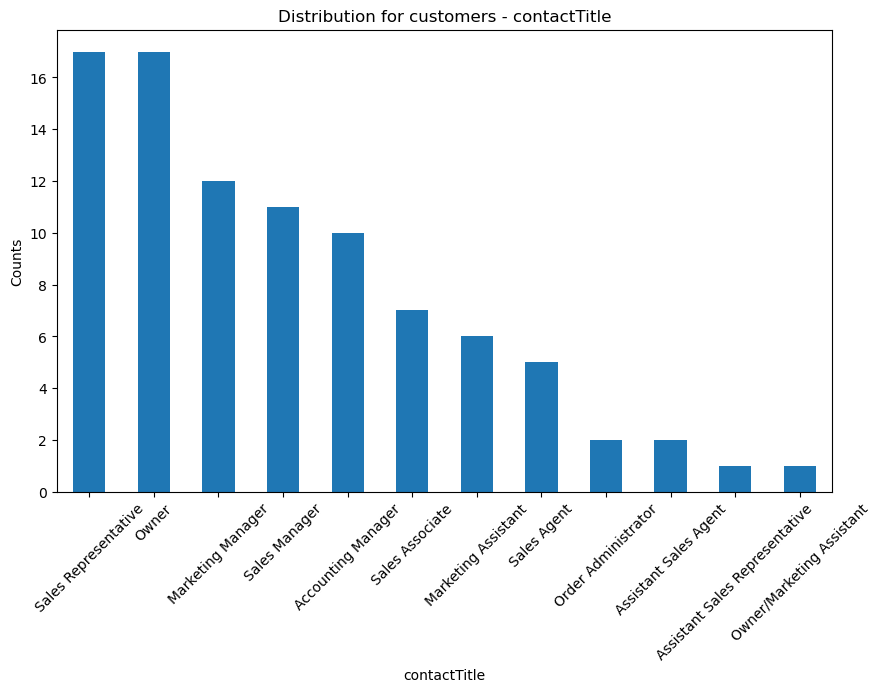

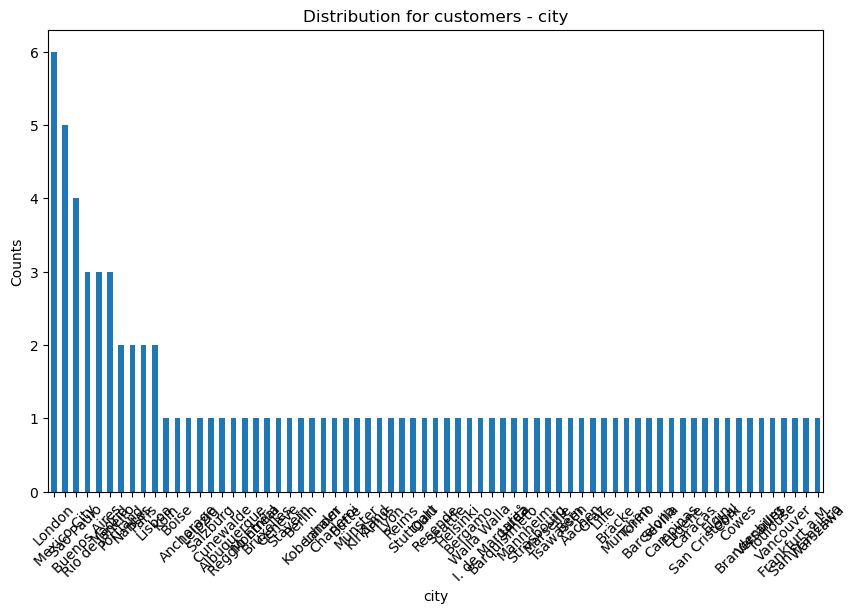

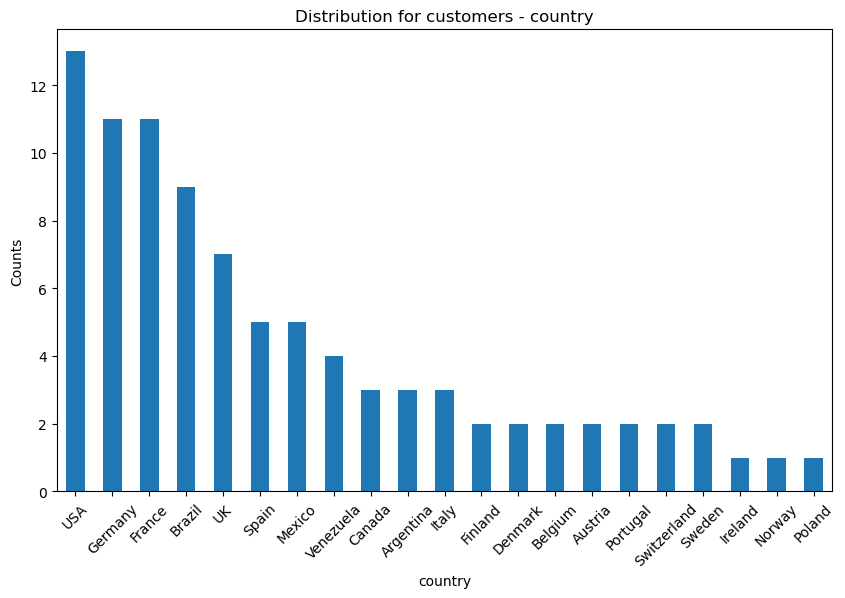


--------------------------------------------------------------------------------

Distribution of categorical variables for employees:



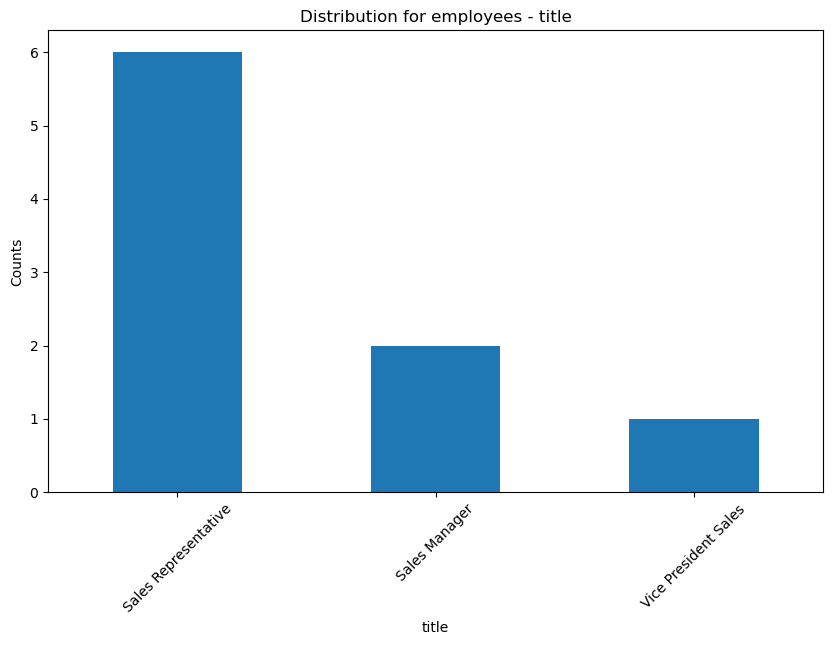

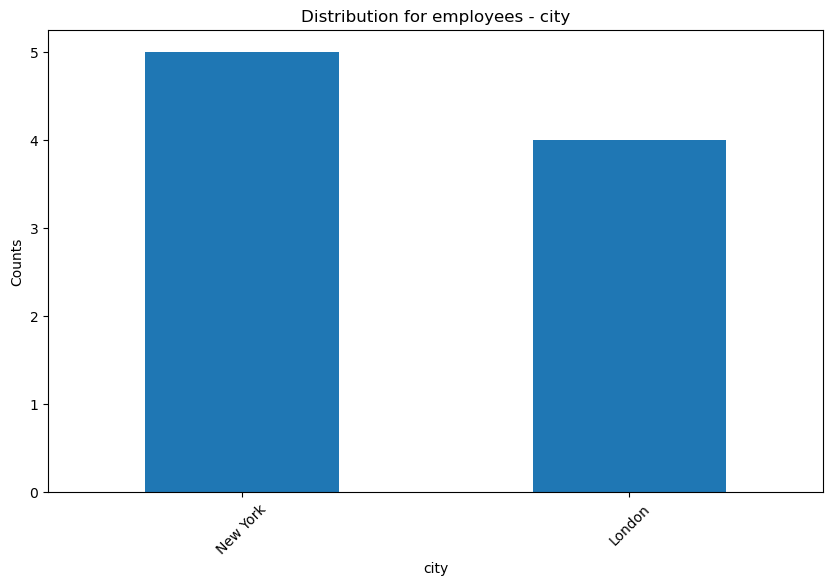

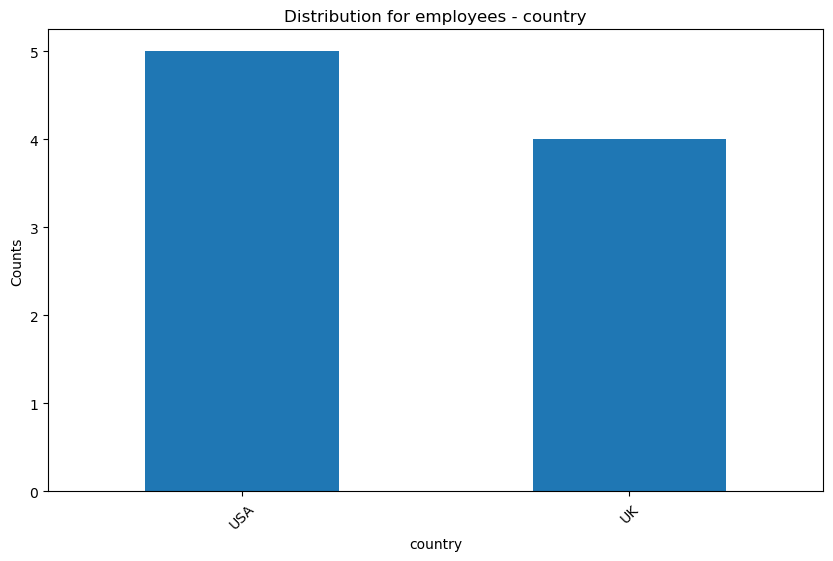


--------------------------------------------------------------------------------

Distribution of categorical variables for orders:



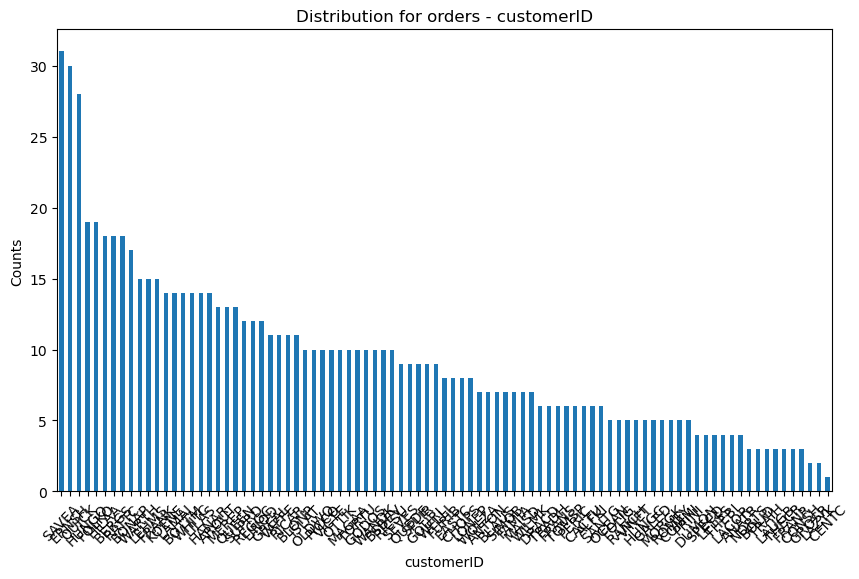

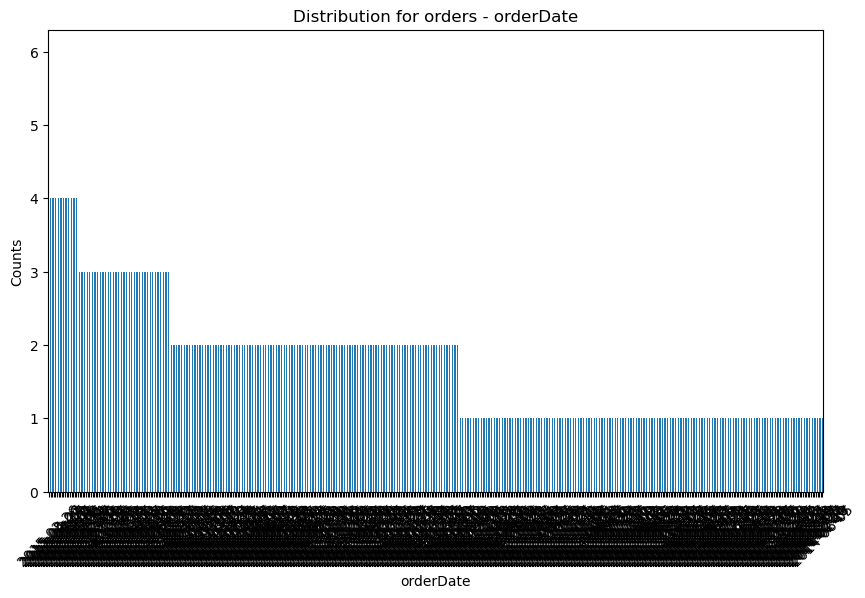

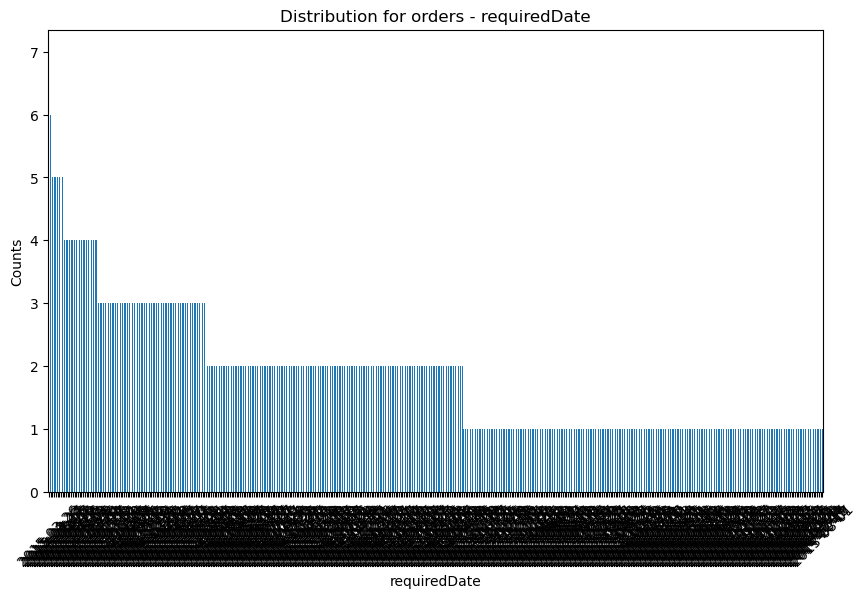

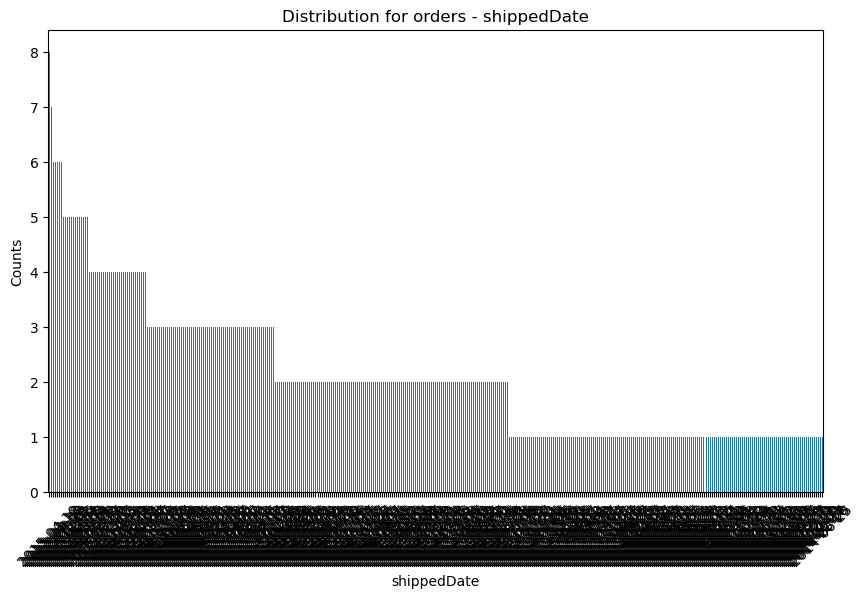


--------------------------------------------------------------------------------

Distribution of categorical variables for order_details:

No categorical columns found in order_details.


--------------------------------------------------------------------------------

Distribution of categorical variables for products:



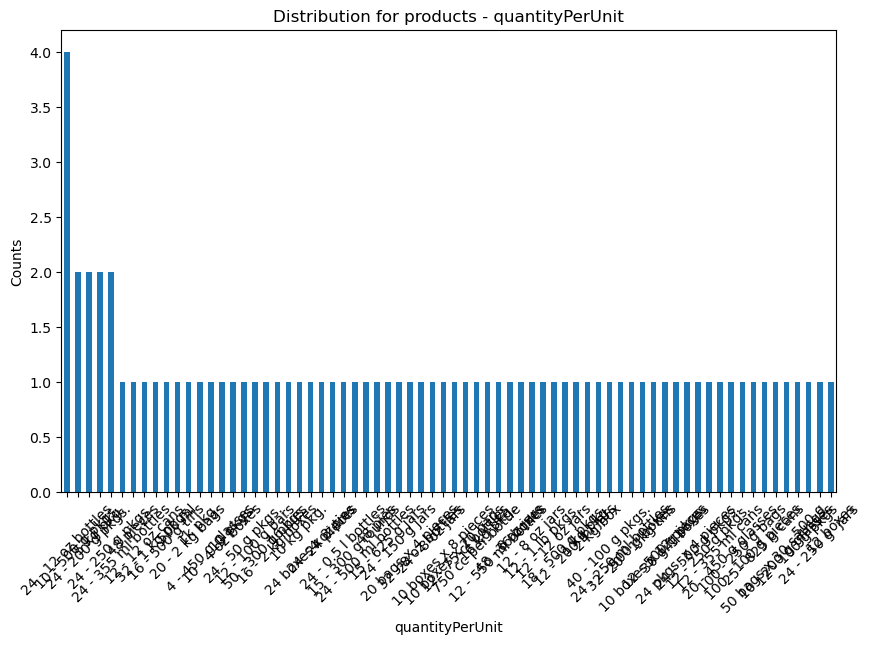


--------------------------------------------------------------------------------

Distribution of categorical variables for shippers:


--------------------------------------------------------------------------------



In [12]:
for df_name, df in dataframes.items():
    print(f"Distribution of categorical variables for {df_name}:\n")
    
    # Select columns that are of type object or category
    categorical_cols = df.select_dtypes(include=['object', 'category']).columns
    
    if len(categorical_cols) == 0:
        print(f"No categorical columns found in {df_name}.\n")
    else:
        for col in categorical_cols:
            # Get value counts
            value_counts = df[col].value_counts()

            # Check if all value_counts are not 1 - no point in showing plots with counts of only 1s
            if not all(value_counts == 1):
                # Plotting the bar chart
                plt.figure(figsize=(10, 6))  # Adjust the size as needed
                value_counts.plot(kind='bar')
                plt.title(f'Distribution for {df_name} - {col}')
                plt.xlabel(col)
                plt.ylabel('Counts')
                plt.xticks(rotation=45)  # Rotate labels for better readability if needed
                plt.show()

    print("\n" + "-"*80 + "\n")  # Separator for readability

In our customers table, we can see that the employees of Northwind Trader are mostly talking to Sales Reps and Owners for their orders. Most of the customers are from the USA, Germany, and France. 
For our employees, we can see that they are all based in USA and the UK. 
For our orders, we can see that most of our orders come from SAVEA, ERNSH, and QUICK.
For our shippers, there are only 3 shipping companies that Northwind Traders use.

### Checking for Date columns and their datatype(s) and format(s)

In [13]:
# Define a regular expression pattern for date detection
date_pattern = re.compile(r'\b(\d{4}-\d{2}-\d{2}|\d{2}/\d{2}/\d{4})\b')

# Function to identify date columns by name or by content
def find_date_columns(df):
    date_columns = []
    # Check by column name
    for col in df.columns:
        if 'date' in col.lower():
            date_columns.append(col)
    # Check by content
    for col in df.columns:
        if df[col].dtype == 'object':  # Typically, date columns are read as strings initially
            # Check if any string in the column matches the date pattern
            if df[col].astype(str).str.match(date_pattern).any():
                date_columns.append(col)
    # Remove duplicates and return the list
    return list(set(date_columns))

# Apply the function to each DataFrame and print the potential date columns
for df_name, df in dataframes.items():
    potential_date_columns = find_date_columns(df)
    print(f"Potential date columns in {df_name}: {potential_date_columns}")


Potential date columns in categories: []
Potential date columns in customers: []
Potential date columns in employees: []
Potential date columns in orders: ['shippedDate', 'requiredDate', 'orderDate']
Potential date columns in order_details: []
Potential date columns in products: []
Potential date columns in shippers: []


#### Checking if all 3 date columns have the same format

In [14]:
def check_date_formats(df, date_columns):
    date_format_summary = {}
    for col in date_columns:
        df[col] = pd.to_datetime(df[col], errors='coerce')
        if df[col].isnull().any():
            # Initialize a dictionary to store the formats found
            formats_found = {}
            # Check against each format
            for format in ('%Y-%m-%d','%m/%d/%Y', '%d-%m-%Y'): #will need to be modified to accomodate multiple formats
                try:
                    # Reformat the dates using the given format and check if they match
                    formatted_dates = df[col].dropna().dt.strftime(format)
                    # Check if all reformatted dates match the original dates to confirm the format
                    match_format = (formatted_dates == df[col].dropna().dt.strftime('%Y-%m-%d')).all()
                    if match_format:
                        formats_found[format] = formatted_dates.iloc[0]
                except:
                    # If there is an error in formatting, it means this format does not match any date
                    pass
            # If any specific formats are found, return them along with the 'nulls' note
            if formats_found:
                date_format_summary[col] = f"Formats detected: {formats_found} and nulls"
            else:
                date_format_summary[col] = "Unknown or multiple formats and nulls"
        else:
            # No nulls means all dates are of the same format, return the first date
            date_format_summary[col] = f"Single format detected: {df[col].dt.strftime('%Y-%m-%d').iloc[0]}"
    return date_format_summary

# Example usage with your 'orders' DataFrame
date_columns_orders = ['requiredDate', 'shippedDate', 'orderDate']
orders_date_format_summary = check_date_formats(dataframes['orders'], date_columns_orders)
orders_date_format_summary


{'requiredDate': 'Single format detected: 2013-08-01',
 'shippedDate': "Formats detected: {'%Y-%m-%d': '2013-07-16'} and nulls",
 'orderDate': 'Single format detected: 2013-07-04'}

Through this function, we have found that all date columns have the same format and we know that shippedDate has nulls as we have explored previously.

In [15]:
dataframes['orders']['shippedDate']
#NaT = not a time

0     2013-07-16
1     2013-07-10
2     2013-07-12
3     2013-07-15
4     2013-07-11
5     2013-07-16
6     2013-07-23
7     2013-07-15
8     2013-07-17
9     2013-07-22
10    2013-07-23
11    2013-07-25
12    2013-07-29
13    2013-07-30
14    2013-07-25
15    2013-07-31
16    2013-08-23
17    2013-08-12
18    2013-07-31
19    2013-08-06
20    2013-08-02
21    2013-08-09
22    2013-08-02
23    2013-08-30
24    2013-08-06
25    2013-08-12
26    2013-08-16
27    2013-08-09
28    2013-08-14
29    2013-08-13
30    2013-08-16
31    2013-08-16
32    2013-09-12
33    2013-08-21
34    2013-08-21
35    2013-08-23
36    2013-08-27
37    2013-08-26
38    2013-08-30
39    2013-08-28
40    2013-09-03
41    2013-08-28
42    2013-09-03
43    2013-09-04
44    2013-09-02
45    2013-09-11
46    2013-09-05
47    2013-09-10
48    2013-09-11
49    2013-09-10
50    2013-09-11
51    2013-09-13
52    2013-09-18
53    2013-09-17
54    2013-10-09
55    2013-09-18
56    2013-09-17
57    2013-10-09
58    2013-09-

# Double check mins/maxs

In [16]:
def find_min_max_values(dataframes):
    min_max_values = {}
    for name, df in dataframes.items():
        min_max_values[name] = {}
        for col in df.columns:
            if pd.api.types.is_numeric_dtype(df[col]) or pd.api.types.is_datetime64_any_dtype(df[col]):
                min_value = df[col].min()
                max_value = df[col].max()
                min_max_values[name][col] = {'min': min_value, 'max': max_value}
    return min_max_values

# Example usage with your 'dataframes' dictionary
all_min_max_values = find_min_max_values(dataframes)
for df_name, stats in all_min_max_values.items():
    print(f"Dataframe: {df_name}")
    for column, min_max in stats.items():
       print(f"Column: {column}, Min: {min_max['min']}, Max: {min_max['max']}")
    print("\n" + "-"*80 + "\n")  # Separator for readability


Dataframe: categories
Column: categoryID, Min: 1, Max: 8

--------------------------------------------------------------------------------

Dataframe: customers

--------------------------------------------------------------------------------

Dataframe: employees
Column: employeeID, Min: 1, Max: 9
Column: reportsTo, Min: 2.0, Max: 8.0

--------------------------------------------------------------------------------

Dataframe: orders
Column: orderID, Min: 10248, Max: 11077
Column: employeeID, Min: 1, Max: 9
Column: orderDate, Min: 2013-07-04 00:00:00, Max: 2015-05-06 00:00:00
Column: requiredDate, Min: 2013-07-24 00:00:00, Max: 2015-06-11 00:00:00
Column: shippedDate, Min: 2013-07-10 00:00:00, Max: 2015-05-06 00:00:00
Column: shipperID, Min: 1, Max: 3
Column: freight, Min: 0.02, Max: 1007.64

--------------------------------------------------------------------------------

Dataframe: order_details
Column: orderID, Min: 10248, Max: 11077
Column: productID, Min: 1, Max: 77
Column: unitP

This is the same information we got from above through .describe() but I only want to see the range of values to see if they make sense. Order_details look fine as well since there are prices above 0.0 and matches productID in products as well. The dates from the orders table make sense, but we can check if there are any required/shipped date that are before order dates.



In [17]:
# Convert date columns to datetime if not already done
orders_df = dataframes['orders'].copy()
orders_df['orderDate'] = pd.to_datetime(orders_df['orderDate'])
orders_df['shippedDate'] = pd.to_datetime(orders_df['shippedDate'])
orders_df['requiredDate'] = pd.to_datetime(orders_df['requiredDate'])

# Check if 'shippedDate' or 'requiredDate' are before 'orderDate'
shipped_before_order = orders_df[orders_df['shippedDate'] < orders_df['orderDate']]
required_before_order = orders_df[orders_df['requiredDate'] < orders_df['orderDate']]

(shipped_before_order[['orderDate', 'shippedDate']], required_before_order[['orderDate', 'requiredDate']])

(Empty DataFrame
 Columns: [orderDate, shippedDate]
 Index: [],
 Empty DataFrame
 Columns: [orderDate, requiredDate]
 Index: [])

Looks like there are no shipped or required dates before the order date. Are there any that are shipped after the required date?

In [18]:
# Convert date columns to datetime if not already done
orders_df = dataframes['orders'].copy()
orders_df['orderDate'] = pd.to_datetime(orders_df['orderDate'])
orders_df['shippedDate'] = pd.to_datetime(orders_df['shippedDate'])
orders_df['requiredDate'] = pd.to_datetime(orders_df['requiredDate'])

# Check if 'shippedDate' or 'requiredDate' are before 'orderDate'
shipped_after_required = orders_df[orders_df['shippedDate'] > orders_df['requiredDate']]

display(shipped_after_required[['requiredDate', 'shippedDate']])
len(shipped_after_required[['requiredDate', 'shippedDate']])

,requiredDate,shippedDate
16,2013-08-21,2013-08-23
23,2013-08-29,2013-08-30
32,2013-09-11,2013-09-12
54,2013-10-08,2013-10-09
61,2013-10-17,2013-10-23
72,2013-10-17,2013-10-18
132,2014-01-09,2014-01-16
175,2014-02-06,2014-02-24
179,2014-02-24,2014-03-03
185,2014-03-03,2014-03-04


37

There are only 37 orders shipped after the required date, pretty good considering the amount of orders that we have.

In [19]:
dataframes['customers']

,customerID,companyName,contactName,contactTitle,city,country
0,ALFKI,Alfreds Futterkiste,Maria Anders,Sales Representative,Berlin,Germany
1,ANATR,Ana Trujillo Emparedados y helados,Ana Trujillo,Owner,Mexico City,Mexico
2,ANTON,Antonio Moreno Taquería,Antonio Moreno,Owner,Mexico City,Mexico
3,AROUT,Around the Horn,Thomas Hardy,Sales Representative,London,UK
4,BERGS,Berglunds snabbköp,Christina Berglund,Order Administrator,Luleå,Sweden
5,BLAUS,Blauer See Delikatessen,Hanna Moos,Sales Representative,Mannheim,Germany
6,BLONP,Blondesddsl père et fils,Frédérique Citeaux,Marketing Manager,Strasbourg,France
7,BOLID,Bólido Comidas preparadas,Martín Sommer,Owner,Madrid,Spain
8,BONAP,Bon app',Laurence Lebihan,Owner,Marseille,France
9,BOTTM,Bottom-Dollar Markets,Elizabeth Lincoln,Accounting Manager,Tsawassen,Canada


In [20]:
dataframes['orders']

,orderID,customerID,employeeID,orderDate,requiredDate,shippedDate,shipperID,freight
0,10248,VINET,5,2013-07-04,2013-08-01,2013-07-16,3,32.38
1,10249,TOMSP,6,2013-07-05,2013-08-16,2013-07-10,1,11.61
2,10250,HANAR,4,2013-07-08,2013-08-05,2013-07-12,2,65.83
3,10251,VICTE,3,2013-07-08,2013-08-05,2013-07-15,1,41.34
4,10252,SUPRD,4,2013-07-09,2013-08-06,2013-07-11,2,51.30
5,10253,HANAR,3,2013-07-10,2013-07-24,2013-07-16,2,58.17
6,10254,CHOPS,5,2013-07-11,2013-08-08,2013-07-23,2,22.98
7,10255,RICSU,9,2013-07-12,2013-08-09,2013-07-15,3,148.33
8,10256,WELLI,3,2013-07-15,2013-08-12,2013-07-17,2,13.97
9,10257,HILAA,4,2013-07-16,2013-08-13,2013-07-22,3,81.91


# Merging all dataframes

We have many tables to join and they have different columns to be joined on. In addition, tables also share duplicated column names such as city, county, unitprice, etc. Let's fix this by adding a suffix to each column indicating which table they're originally from as well as excluding the columns we're joining on to prevent duplicated columns.

In [21]:
def rename_columns(dataframes, suffixes, exclude_columns=None):
    """
    Renames columns in each dataframe by adding a suffix to avoid duplicate column names after merging,
    except for the columns in the exclude_columns list.
    Suffixes is a dictionary where the key is the dataframe name and the value is the suffix to add.
    """
    if exclude_columns is None:
        exclude_columns = []

    renamed_dataframes = {}
    for df_name, df in dataframes.items():
        # Add suffix to each column except those in exclude_columns and the index
        df_renamed = df.rename(columns=lambda x: f"{x}{suffixes[df_name]}" if x not in exclude_columns and x not in df.index.names else x)
        renamed_dataframes[df_name] = df_renamed
    return renamed_dataframes

# Dictionary with the suffixes for each dataframe
df_suffixes = {
    'orders': '_o',
    'order_details': '_od',
    'customers': '_cust',
    'employees': '_emp',
    'shippers': '_ship',
    'products': '_prod',
    'categories': '_cat'
}

# List of columns to exclude from renaming
exclude_cols = ['categoryID', 'employeeID', 'orderID', 'shipperID', 'productID','customerID']  # Update this list with the appropriate column names

# Rename the dataframes
renamed_dataframes = rename_columns(dataframes, df_suffixes, exclude_columns=exclude_cols)

In [22]:
renamed_dataframes

{'categories':    categoryID  categoryName_cat  \
 0           1         Beverages   
 1           2        Condiments   
 2           3       Confections   
 3           4    Dairy Products   
 4           5  Grains & Cereals   
 5           6    Meat & Poultry   
 6           7           Produce   
 7           8           Seafood   
 
                                      description_cat  
 0        Soft drinks, coffees, teas, beers, and ales  
 1  Sweet and savory sauces, relishes, spreads, an...  
 2                Desserts, candies, and sweet breads  
 3                                            Cheeses  
 4                Breads, crackers, pasta, and cereal  
 5                                     Prepared meats  
 6                          Dried fruit and bean curd  
 7                                   Seaweed and fish  ,
 'customers':    customerID                      companyName_cust         contactName_cust  \
 0       ALFKI                   Alfreds Futterkiste         

In [23]:
# Perform the merge operation with the correct column names using the suffixes we verified
final_df = (
    renamed_dataframes['orders']
    .merge(renamed_dataframes['order_details'], on='orderID', how='inner')
    .merge(renamed_dataframes['customers'], on='customerID', how='inner')
    .merge(renamed_dataframes['employees'], on='employeeID', how='inner')
    .merge(renamed_dataframes['shippers'], on='shipperID', how='inner')
    .merge(renamed_dataframes['products'], on='productID', how='inner')
    .merge(renamed_dataframes['categories'], on='categoryID', how='inner')
)

# Display the first few rows of the merged DataFrame to confirm the merge was successful
final_df


,orderID,customerID,employeeID,orderDate_o,requiredDate_o,shippedDate_o,shipperID,freight_o,productID,unitPrice_od,...,country_emp,reportsTo_emp,companyName_ship,productName_prod,quantityPerUnit_prod,unitPrice_prod,discontinued_prod,categoryID,categoryName_cat,description_cat
0,10248,VINET,5,2013-07-04,2013-08-01,2013-07-16,3,32.38,11,14.00,...,UK,2.0,Federal Shipping,Queso Cabrales,1 kg pkg.,21.00,0,4,Dairy Products,Cheeses
1,10944,BOTTM,6,2015-03-12,2015-03-26,2015-03-13,3,52.92,11,21.00,...,UK,5.0,Federal Shipping,Queso Cabrales,1 kg pkg.,21.00,0,4,Dairy Products,Cheeses
2,10570,MEREP,3,2014-06-17,2014-07-15,2014-06-19,3,188.99,11,21.00,...,USA,8.0,Federal Shipping,Queso Cabrales,1 kg pkg.,21.00,0,4,Dairy Products,Cheeses
3,10926,ANATR,4,2015-03-04,2015-04-01,2015-03-11,3,39.92,11,21.00,...,USA,8.0,Federal Shipping,Queso Cabrales,1 kg pkg.,21.00,0,4,Dairy Products,Cheeses
4,10842,TORTU,1,2015-01-20,2015-02-17,2015-01-29,3,54.42,11,21.00,...,USA,8.0,Federal Shipping,Queso Cabrales,1 kg pkg.,21.00,0,4,Dairy Products,Cheeses
5,10542,KOENE,1,2014-05-20,2014-06-17,2014-05-26,3,10.95,11,21.00,...,USA,8.0,Federal Shipping,Queso Cabrales,1 kg pkg.,21.00,0,4,Dairy Products,Cheeses
6,10800,SEVES,1,2014-12-26,2015-01-23,2015-01-05,3,137.44,11,21.00,...,USA,8.0,Federal Shipping,Queso Cabrales,1 kg pkg.,21.00,0,4,Dairy Products,Cheeses
7,10770,HANAR,8,2014-12-09,2015-01-06,2014-12-17,3,5.32,11,21.00,...,USA,2.0,Federal Shipping,Queso Cabrales,1 kg pkg.,21.00,0,4,Dairy Products,Cheeses
8,10614,BLAUS,8,2014-07-29,2014-08-26,2014-08-01,3,1.93,11,21.00,...,USA,2.0,Federal Shipping,Queso Cabrales,1 kg pkg.,21.00,0,4,Dairy Products,Cheeses
9,10889,RATTC,9,2015-02-16,2015-03-16,2015-02-23,3,280.61,11,21.00,...,UK,5.0,Federal Shipping,Queso Cabrales,1 kg pkg.,21.00,0,4,Dairy Products,Cheeses


In [24]:
# List of all DataFrame keys
df_keys = ['orders', 'order_details', 'customers', 'employees', 'shippers', 'products', 'categories']

# Calculate the total number of columns by summing the number of columns in each individual DataFrame
individual_columns_dfs = print([dataframes[key].shape[1] for key in df_keys])
total_columns_individual_dfs = sum([dataframes[key].shape[1] for key in df_keys])

# Print the total
print(f"Total number of columns in all individual DataFrames: {total_columns_individual_dfs}")

# Print the number of columns in the final merged DataFrame
print(f"Number of columns in the final merged DataFrame: {final_df.shape[1]}")

[8, 5, 6, 6, 2, 6, 3]
Total number of columns in all individual DataFrames: 36
Number of columns in the final merged DataFrame: 30


Everything is merged properly. Since we have 7 tables, our final_df's column count is going to be 6 less than the sum of our individual dataframes due to the key columns merging into 1 after our join.

## Checking for Duplicates

We want to check if there were any orders that are duplicates. Based on our columns, we don't want to choose any primary key columns because they are unique identifiers for each record (orderID). Based on the context of the data, we want to check for orders that might have been mistakenly duplicated such as double entries. Hence we will check based on customerID, orderDate, and their products.

In [25]:
final_df.columns

Index(['orderID', 'customerID', 'employeeID', 'orderDate_o', 'requiredDate_o',
       'shippedDate_o', 'shipperID', 'freight_o', 'productID', 'unitPrice_od',
       'quantity_od', 'discount_od', 'companyName_cust', 'contactName_cust',
       'contactTitle_cust', 'city_cust', 'country_cust', 'employeeName_emp',
       'title_emp', 'city_emp', 'country_emp', 'reportsTo_emp',
       'companyName_ship', 'productName_prod', 'quantityPerUnit_prod',
       'unitPrice_prod', 'discontinued_prod', 'categoryID', 'categoryName_cat',
       'description_cat'],
      dtype='object')

In [26]:
final_df[final_df[['customerID','orderDate_o','productID']].duplicated(keep = False)].sort_values('customerID')

,orderID,customerID,employeeID,orderDate_o,requiredDate_o,shippedDate_o,shipperID,freight_o,productID,unitPrice_od,...,country_emp,reportsTo_emp,companyName_ship,productName_prod,quantityPerUnit_prod,unitPrice_prod,discontinued_prod,categoryID,categoryName_cat,description_cat
257,10410,BOTTM,3,2014-01-10,2014-02-07,2014-01-15,3,2.40,59,44.0,...,USA,8.0,Federal Shipping,Raclette Courdavault,5 kg pkg.,55.0,0,4,Dairy Products,Cheeses
267,10411,BOTTM,9,2014-01-10,2014-02-07,2014-01-21,3,23.65,59,44.0,...,UK,5.0,Federal Shipping,Raclette Courdavault,5 kg pkg.,55.0,0,4,Dairy Products,Cheeses


Here, we see there are two orders to the same customer on the same order date with the same productID. Upon closer inspection, they are not duplicates as different employees worked on these orders with different product quantities, and discounts.
The customer is from Canada, Tsawassen and freight cost is nearly ten times more when ordering from the UK employee than the USA employee. It's plausible that the product is being shipped from the UK when ordering from the UK employee hence the increased freight cost as USA is much closer to Canada than the UK.

## Check for Missing Values

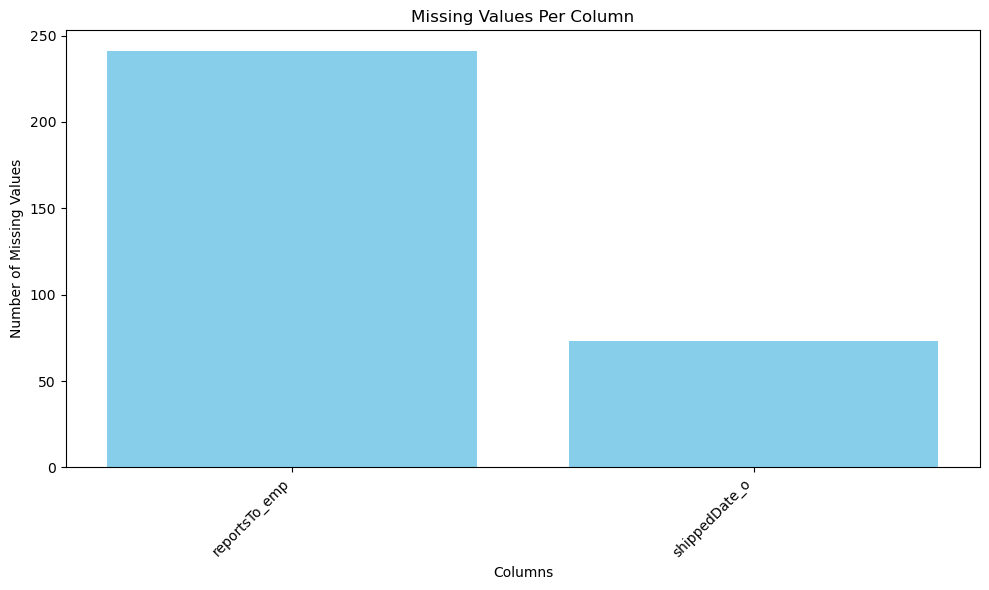

In [27]:
missing_values = final_df.isnull().sum()
missing_values = missing_values[missing_values > 0]  #Filter out columns with no missing values
missing_values_sorted = missing_values.sort_values(ascending=False)

plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.bar(missing_values_sorted.index, missing_values_sorted.values, color='skyblue')
plt.xlabel('Columns')
plt.ylabel('Number of Missing Values')
plt.xticks(rotation=45, ha='right')  # Rotate the column names for better readability
plt.title('Missing Values Per Column')
plt.tight_layout()  # Adjust the layout to make room for the rotated x-axis labels
plt.show()

## Checking the correlations in our merged dataset

Correlations only work with numeric data types. We can easily select the numeric columns but let's transform our date columns so those can be included as well.

In [28]:
final_df.dtypes

orderID                          int64
customerID                      object
employeeID                       int64
orderDate_o             datetime64[ns]
requiredDate_o          datetime64[ns]
shippedDate_o           datetime64[ns]
shipperID                        int64
freight_o                      float64
productID                        int64
unitPrice_od                   float64
quantity_od                      int64
discount_od                    float64
companyName_cust                object
contactName_cust                object
contactTitle_cust               object
city_cust                       object
country_cust                    object
employeeName_emp                object
title_emp                       object
city_emp                        object
country_emp                     object
reportsTo_emp                  float64
companyName_ship                object
productName_prod                object
quantityPerUnit_prod            object
unitPrice_prod           

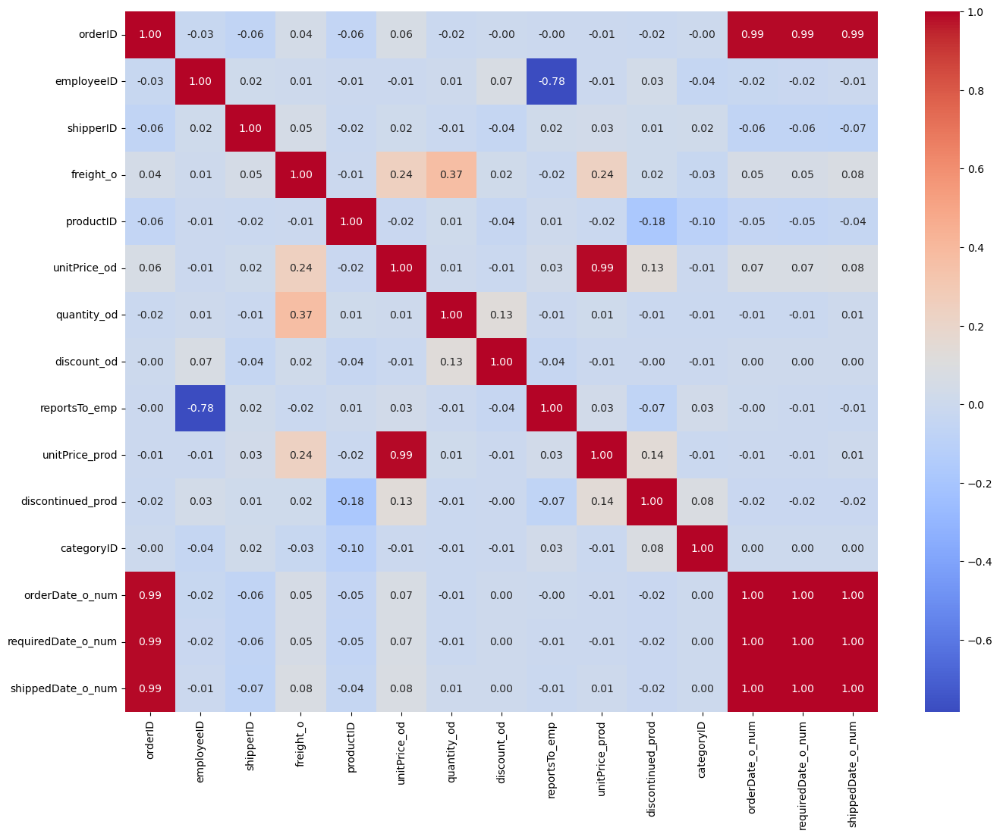

In [29]:
# Convert the identified date columns to datetime if they are not already in that format.
date_columns = ['orderDate_o', 'requiredDate_o', 'shippedDate_o']

for col in date_columns:
    final_df[col] = pd.to_datetime(final_df[col], errors='coerce')

# Now we calculate the number of days from the minimum date in each column to transform dates into numerical values
for col in date_columns:
    min_date = final_df[col].min()
    final_df[col + '_num'] = (final_df[col] - min_date).dt.days

# Select the numeric columns again, which will now include our new date representations
numeric_cols_with_dates = final_df.select_dtypes(include=[np.number])

# Recalculate the correlation matrix
correlation_matrix_with_dates = numeric_cols_with_dates.corr()

# Draw the heatmap for the new correlation matrix
plt.figure(figsize=(16, 12))
sns.heatmap(correlation_matrix_with_dates, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
plt.show()


As a guideline for correlation considering their absolute values:

Strong Correlation: >= 0.5 to 0.6

Moderate:  0.3 to 0.5

Weak or None: <= 0.3

The heatmap shows us that 'employeeID' and 'reportsTo' have a negative correlation. A brief look of the employees table show us that Sales Reps report to Sales Managers who in turn report to the VP of Sales.

ProductID is also negatively correlated with discontinued_prod which makes sense as the older products are discontinued first. Nothing else really stands out.

In [30]:
dataframes['employees']

,employeeID,employeeName,title,city,country,reportsTo
0,1,Nancy Davolio,Sales Representative,New York,USA,8.0
1,2,Andrew Fuller,Vice President Sales,New York,USA,NaN
2,3,Janet Leverling,Sales Representative,New York,USA,8.0
3,4,Margaret Peacock,Sales Representative,New York,USA,8.0
4,5,Steven Buchanan,Sales Manager,London,UK,2.0
5,6,Michael Suyama,Sales Representative,London,UK,5.0
6,7,Robert King,Sales Representative,London,UK,5.0
7,8,Laura Callahan,Sales Manager,New York,USA,2.0
8,9,Anne Dodsworth,Sales Representative,London,UK,5.0


In [31]:
numeric_cols_with_dates.columns

Index(['orderID', 'employeeID', 'shipperID', 'freight_o', 'productID',
       'unitPrice_od', 'quantity_od', 'discount_od', 'reportsTo_emp',
       'unitPrice_prod', 'discontinued_prod', 'categoryID', 'orderDate_o_num',
       'requiredDate_o_num', 'shippedDate_o_num'],
      dtype='object')

C:\Users\valde\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


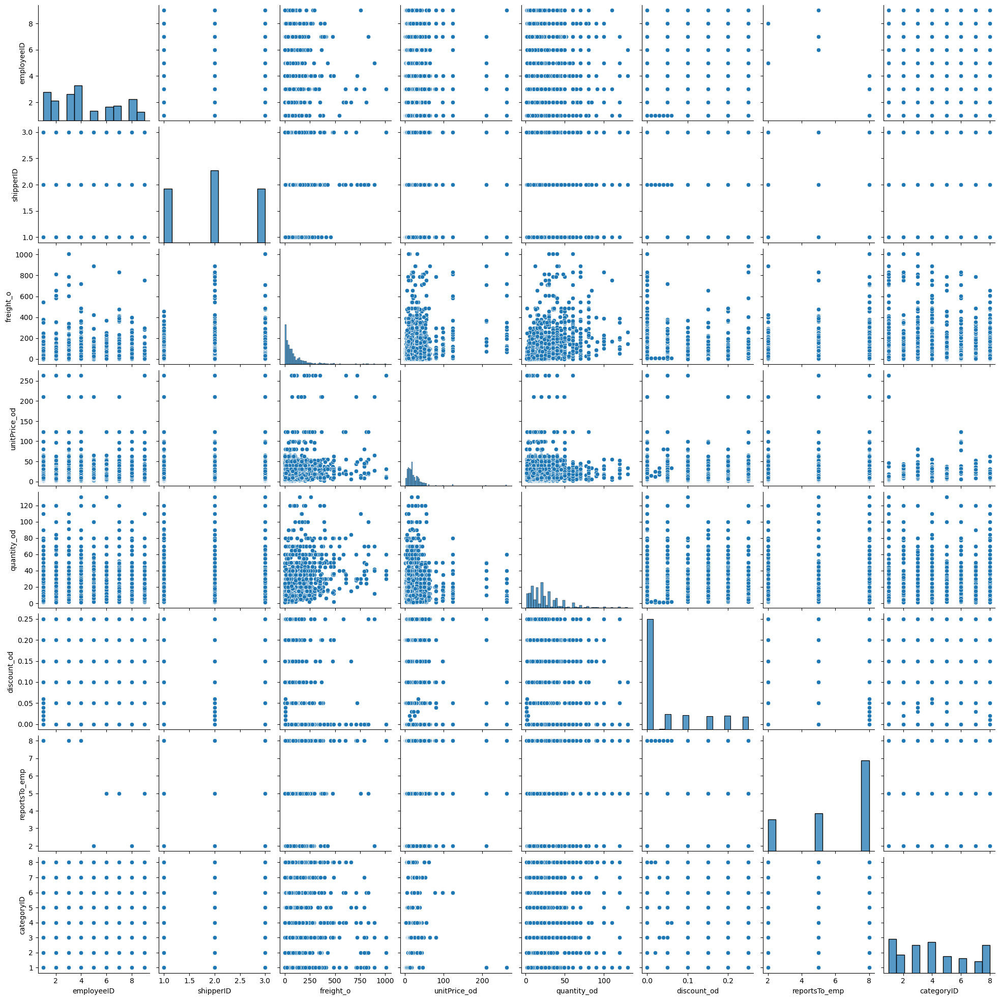

In [32]:
pairplot = numeric_cols_with_dates[['employeeID','shipperID','freight_o','unitPrice_od', 
                                    'quantity_od', 'discount_od', 'reportsTo_emp', 'categoryID']]

sns.pairplot(pairplot)

# Time Series Analysis

There are many variables which we can do our time series analysis such as Sales over Time, Order Volume, Number of Customers, Number of Products, Employee Performance, and Shipping Time.

Let's start off with Sales over Time.

We can also consult our data dictionary csv that was given to us which contains a brief description of each column

In [33]:
final_df.columns

Index(['orderID', 'customerID', 'employeeID', 'orderDate_o', 'requiredDate_o',
       'shippedDate_o', 'shipperID', 'freight_o', 'productID', 'unitPrice_od',
       'quantity_od', 'discount_od', 'companyName_cust', 'contactName_cust',
       'contactTitle_cust', 'city_cust', 'country_cust', 'employeeName_emp',
       'title_emp', 'city_emp', 'country_emp', 'reportsTo_emp',
       'companyName_ship', 'productName_prod', 'quantityPerUnit_prod',
       'unitPrice_prod', 'discontinued_prod', 'categoryID', 'categoryName_cat',
       'description_cat', 'orderDate_o_num', 'requiredDate_o_num',
       'shippedDate_o_num'],
      dtype='object')

In [34]:
final_df.head()

,orderID,customerID,employeeID,orderDate_o,requiredDate_o,shippedDate_o,shipperID,freight_o,productID,unitPrice_od,...,productName_prod,quantityPerUnit_prod,unitPrice_prod,discontinued_prod,categoryID,categoryName_cat,description_cat,orderDate_o_num,requiredDate_o_num,shippedDate_o_num
0,10248,VINET,5,2013-07-04,2013-08-01,2013-07-16,3,32.38,11,14.0,...,Queso Cabrales,1 kg pkg.,21.0,0,4,Dairy Products,Cheeses,0,8,6.0
1,10944,BOTTM,6,2015-03-12,2015-03-26,2015-03-13,3,52.92,11,21.0,...,Queso Cabrales,1 kg pkg.,21.0,0,4,Dairy Products,Cheeses,616,610,611.0
2,10570,MEREP,3,2014-06-17,2014-07-15,2014-06-19,3,188.99,11,21.0,...,Queso Cabrales,1 kg pkg.,21.0,0,4,Dairy Products,Cheeses,348,356,344.0
3,10926,ANATR,4,2015-03-04,2015-04-01,2015-03-11,3,39.92,11,21.0,...,Queso Cabrales,1 kg pkg.,21.0,0,4,Dairy Products,Cheeses,608,616,609.0
4,10842,TORTU,1,2015-01-20,2015-02-17,2015-01-29,3,54.42,11,21.0,...,Queso Cabrales,1 kg pkg.,21.0,0,4,Dairy Products,Cheeses,565,573,568.0


In [35]:
#Total Sales revenue wasn't given to us so we have to calculate it on our own with given columns
final_df['SalesRevenue'] = final_df['unitPrice_od'] * (1 - final_df['discount_od']) * final_df['quantity_od']
final_df[['unitPrice_od','discount_od','quantity_od','SalesRevenue']]

,unitPrice_od,discount_od,quantity_od,SalesRevenue
0,14.00,0.00,12,168.0000
1,21.00,0.25,5,78.7500
2,21.00,0.05,15,299.2500
3,21.00,0.00,2,42.0000
4,21.00,0.00,15,315.0000
5,21.00,0.05,15,299.2500
6,21.00,0.10,50,945.0000
7,21.00,0.25,15,236.2500
8,21.00,0.00,14,294.0000
9,21.00,0.00,40,840.0000


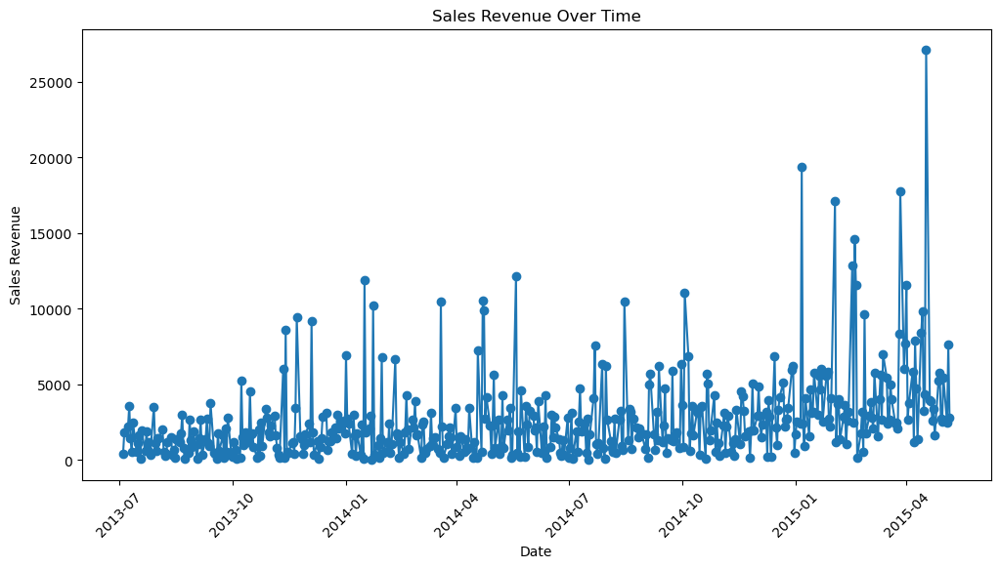

In [36]:
sales_over_time = final_df.groupby('orderDate_o')['SalesRevenue'].sum().reset_index() 
#.reset_index() required to turn orderDate back into a regular column -> plottable

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(sales_over_time['orderDate_o'], sales_over_time['SalesRevenue'], marker='o')
plt.title('Sales Revenue Over Time')
plt.xlabel('Date')
plt.ylabel('Sales Revenue')
plt.xticks(rotation=45)
plt.show()

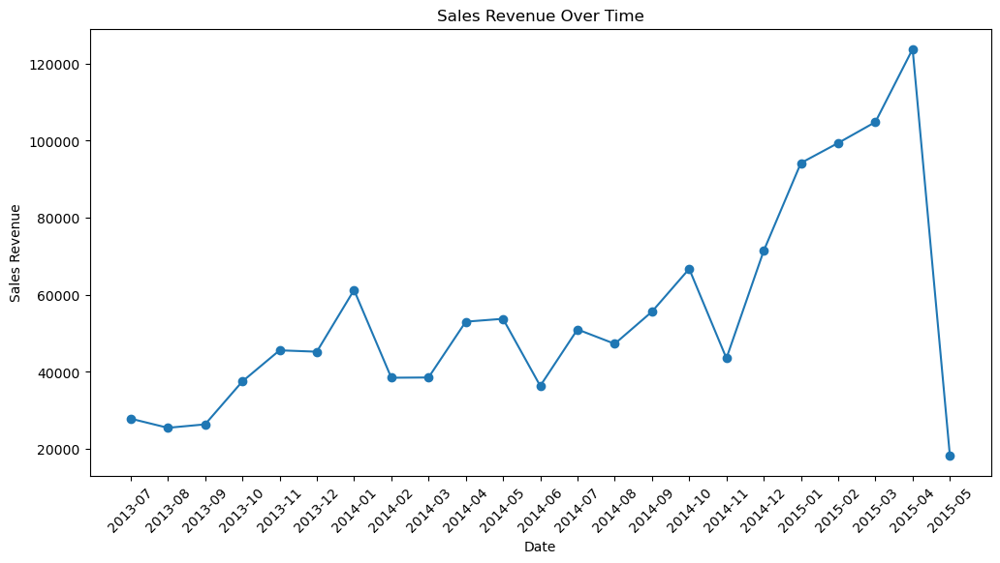

In [37]:
sales_over_time = final_df.groupby(final_df['orderDate_o'].dt.to_period('M'))['SalesRevenue'].sum().reset_index() 
#.reset_index() required to turn orderDate back into a regular column -> plottable

sales_over_time['orderDate_o'] = sales_over_time['orderDate_o'].astype(str)
#TypeError: float() argument must be a string or a real number, not 'Period' for plt.plot therefore we must turn
#sales_over_time['orderDate_o'] back into a string or number type

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(sales_over_time['orderDate_o'], sales_over_time['SalesRevenue'], marker='o')
plt.title('Sales Revenue Over Time')
plt.xlabel('Date')
plt.ylabel('Sales Revenue')
plt.xticks(rotation=45)
plt.show()

Sales Revenue seemed to be growing slowly from 2013-07 to 2014-01 then dropped and stagnated until 2014-11 where it had a meteoric rise until 2015-04 where it dropped even lower than where it started out in 2013-07.

It's very likely that our data had few orders for 2015-05 due to data collection ending hence we didn't have a lot of orders. We'll confirm if this was true or not.

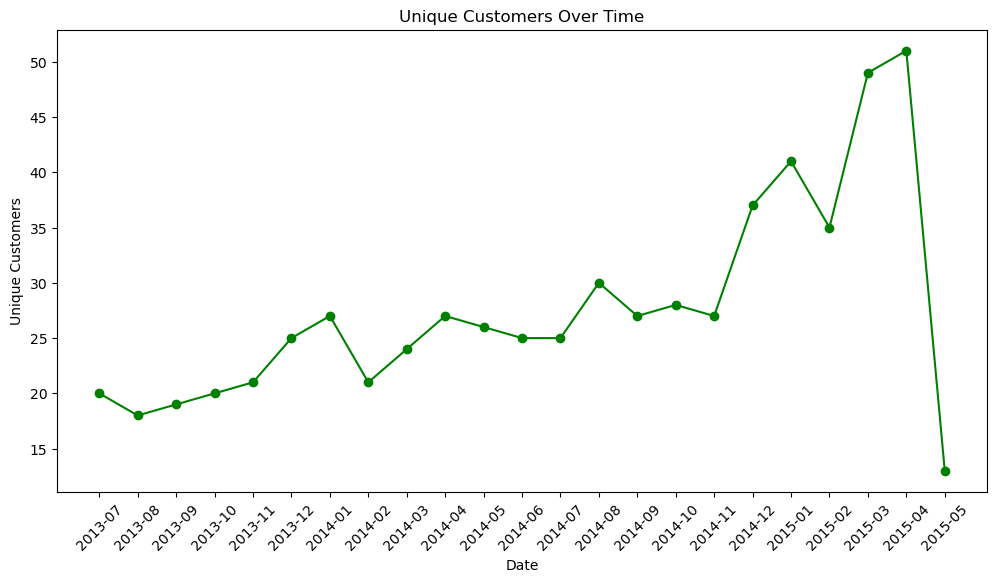

In [38]:
customers_over_time = final_df.groupby(final_df['orderDate_o'].dt.to_period('M'))['customerID'].nunique().reset_index() 
#.reset_index() required to turn orderDate back into a regular column -> plottable

customers_over_time['orderDate_o'] = customers_over_time['orderDate_o'].astype(str)
#TypeError: float() argument must be a string or a real number, not 'Period' for plt.plot therefore we must turn
#sales_over_time['orderDate_o'] back into a string or number type

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(customers_over_time['orderDate_o'], customers_over_time['customerID'], marker='o', color = 'green')
plt.title('Unique Customers Over Time')
plt.xlabel('Date')
plt.ylabel('Unique Customers')
plt.xticks(rotation=45)
plt.show()

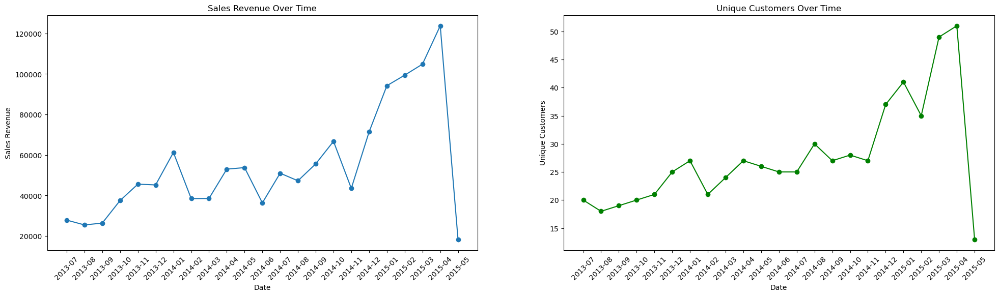

In [39]:
import matplotlib.pyplot as plt

# Setting up a figure with two subplots side by side
plt.figure(figsize=(24, 6))  # Increase the width to accommodate both plots

# Plot for Sales Revenue Over Time
plt.subplot(1, 2, 1)  # 1 row, 2 columns, first plot
plt.plot(sales_over_time['orderDate_o'], sales_over_time['SalesRevenue'], marker='o')
plt.title('Sales Revenue Over Time')
plt.xlabel('Date')
plt.ylabel('Sales Revenue')
plt.xticks(rotation=45)

# Plot for Unique Customers Over Time
plt.subplot(1, 2, 2)  # 1 row, 2 columns, second plot
plt.plot(customers_over_time['orderDate_o'], customers_over_time['customerID'], marker='o', color='green')
plt.title('Unique Customers Over Time')
plt.xlabel('Date')
plt.ylabel('Unique Customers')
plt.xticks(rotation=45)

# Display the plots
plt.show()


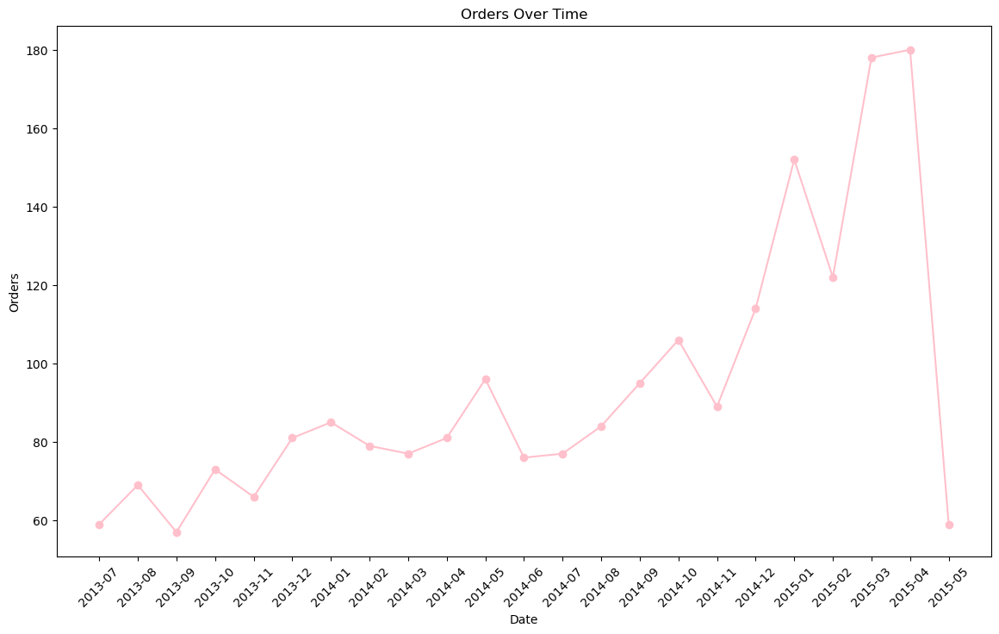

In [40]:
orders_over_time = final_df.groupby(final_df['orderDate_o'].dt.to_period('M'))['orderID'].count().reset_index() 
#.reset_index() required to turn orderDate back into a regular column -> plottable

orders_over_time['orderDate_o'] = orders_over_time['orderDate_o'].astype(str)
#TypeError: float() argument must be a string or a real number, not 'Period' for plt.plot therefore we must turn
#sales_over_time['orderDate_o'] back into a string or number type

# Plotting
plt.figure(figsize=(14, 8))
plt.plot(orders_over_time['orderDate_o'], orders_over_time['orderID'], marker='o', color = 'pink')
plt.title('Orders Over Time')
plt.xlabel('Date')
plt.ylabel('Orders')
plt.xticks(rotation=45)
plt.show()

#### Comparing total number of orders in April vs May

In [41]:
#Taking a look at 2015-05 to confirm our suspicions
print(final_df[final_df['orderDate_o'] > '2015-04-30']['orderDate_o'].min())
print(final_df[final_df['orderDate_o'] > '2015-04-30']['orderDate_o'].max())
print(final_df[final_df['orderDate_o'] > '2015-04-30']['orderID'].count())
print(final_df[(final_df['orderDate_o'].dt.month == 4) & (final_df['orderDate_o'].dt.year == 2015)]['orderID'].count())

2015-05-01 00:00:00
2015-05-06 00:00:00
59
180


I was correct in my guess that the data ends. The orders for May of 2015 only go up to the 6th.
There are only 59 orders in 2015-05 so it makes sense that there's a huge drop in sales revenue as well as unique customers since the month prior had 180 orders.

#### Further Time Series Analysis

Can we use time series analysis to analyze trends, seasonality, cyclical, autocorrelation, stationarity, decomposition, forecasting, anomaly detection, intervention, and multivariate?

orderDate_o: This is likely a datetime column and will be crucial for indexing your time series data.

requiredDate_o and shippedDate_o: Also datetime columns, useful if you're analyzing lead times or shipping durations.

freight_o: Could be used to analyze trends or seasonality in shipping costs.

unitPrice_od, quantity_od, discount_od: Useful for analyzing sales trends, revenue, and discount strategies over time.

unitPrice_prod: Can be analyzed to understand trends in product pricing.

SalesRevenue: This is a key metric for most time series analyses in a sales context - trends, seasonality, forecasting, etc.

When you are performing specific analyses like:

Anomaly Detection: Focus on quantitative columns like SalesRevenue or freight_o.
Forecasting: Use SalesRevenue or other sales-related numerical columns.
Intervention Analysis: You would analyze the impact of a specific event or change over time, so choose a column that would be directly affected by the intervention.
Multivariate Time Series Analysis: You can analyze multiple quantitative columns together, like SalesRevenue, unitPrice_od, and quantity_od, to understand their interrelationships over time.

## Analyzing Trends for Sales and Order Date

C:\Users\valde\AppData\Local\Temp\ipykernel_19140\1457273335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sales_trends.fillna(method='ffill',inplace=True)


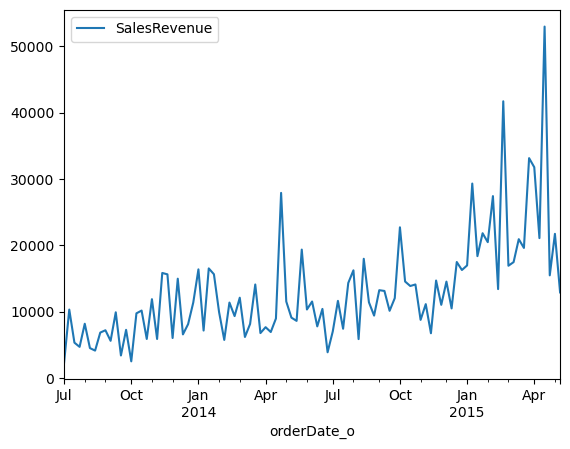

In [42]:
sales_trends = final_df[['orderDate_o','SalesRevenue']]
sales_trends.set_index('orderDate_o', inplace=True)
sales_trends.fillna(method='ffill',inplace=True)
weekly_sales = sales_trends.resample('W').sum()
weekly_sales.plot()
plt.show()

In [43]:
result = adfuller(weekly_sales.dropna())
print('ADF Statistic:', result[0])
print('p-value:', result[1])


ADF Statistic: -2.3781212183240097
p-value: 0.14800698298814785


In [44]:
result

(-2.3781212183240097,
 0.14800698298814785,
 2,
 94,
 {'1%': -3.5019123847798657,
  '5%': -2.892815255482889,
  '10%': -2.583453861475781},
 1725.905601126636)

The Augmented Dickey_Fuller (ADF) test is a statistical test to check for unit roots in a time series in order to test for stationarity. The more negative the ADF Statistic, the stronger we reject the null hypothesis. If the p-value of less than 0.05 (typically), the null hypothesis of non-stationarity is rejected.

Our ADF is not more negative than any of the critical values which means the test doesn't provide enough evidence to reject the null hypothesis at the 10%, 5%, or 1% levels.
Our p-value is greater than 0.05 as well which means our ADF test results suggests that our time series is likely non-stationary.

Our time series need to be stationary (statistical properties such as mean, variance, autocorrelation are constant over time) in order for good model predictability, reliable parameter estimates, and good forecasting.

In an attempt to make our time series stationary, we will apply differencing, transformations (logs, squart roots, powers), detrending (e.g subtracting a moving average), and seasonal adjustments.

The idea of detrending is to isolate and analyze the short-term fluctuations or seasonal patterns in the data. Many statistical models require stationary data which detrending helps achieve. It also helps us understand the internal variability in the data that is not due to the overall trend. Detrending by subtracting a moving average from the original sales revenue will result in a series that oscillate around a constant level and highlights deviations from the trend.


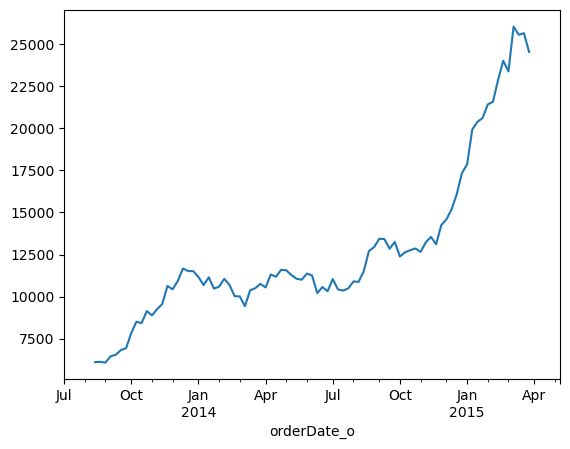

In [45]:
#seasonal_decompose is used to decompose a time series into trend, seasonality, and residual(noise)
#Trend: overall direction of the data over time
#Seasonality: Regular pattern of variability within specific timeframes
#Residuals: random components that can't be attributed to trends or season
decomposition = seasonal_decompose(weekly_sales, model='additive', period = 13) 
trend = decomposition.trend
trend.plot()
plt.show()

Given that orderDate_o goes from 2013-07-04 to 2015-05-06, we are working with less than 2 full years of data which makes it hard to use seasonal_decompose because there is not enough cycles in our data. Our data is in weeks so we choose a period of 13 which is roughly 3 months to give us quarterly information.
This allows us to better see the trends in our data. We can see that it started it's explosive sales growth in the December of 2014.

#### Differencing

In [46]:
# Assuming 'weekly_sales' is your DataFrame and 'SalesRevenue' is the column you want to difference
df = weekly_sales['SalesRevenue'].diff().dropna()  # Apply differencing and drop NA values

# Now df is a Series containing the differenced data
result = adfuller(df)
print('ADF Statistic:', result[0])
print('p-value:', result[1])
result

ADF Statistic: -5.907409313482183
p-value: 2.688234373325947e-07


(-5.907409313482183,
 2.688234373325947e-07,
 6,
 89,
 {'1%': -3.506057133647011,
  '5%': -2.8946066061911946,
  '10%': -2.5844100201994697},
 1707.1230141989693)

When Differencing, our ADF is more negative than the critical values at all levels and we have a small p-value that is smaller than 0.05 which suggests that the differenced time series is stationary and we can proceed with time series analysis or modeling that require stationarity such as ARIMA for forecasting.

Let's check other transformations to see if we can get it even lower.

#### Transformations via logs, sqrts, powers

In [47]:
df = np.log(weekly_sales['SalesRevenue'])

result = adfuller(df)
print('ADF Statistic:', result[0])
print('p-value:', result[1])
result

ADF Statistic: -2.272934157150201
p-value: 0.1808458636036624


(-2.272934157150201,
 0.1808458636036624,
 2,
 94,
 {'1%': -3.5019123847798657,
  '5%': -2.892815255482889,
  '10%': -2.583453861475781},
 101.85213029999699)

Worse than original.

In [48]:
df = np.sqrt(weekly_sales['SalesRevenue'])

result = adfuller(df)
print('ADF Statistic:', result[0])
print('p-value:', result[1])
result

ADF Statistic: -2.248982757401778
p-value: 0.18894998299085564


(-2.248982757401778,
 0.18894998299085564,
 2,
 94,
 {'1%': -3.5019123847798657,
  '5%': -2.892815255482889,
  '10%': -2.583453861475781},
 785.1108718032456)

Slightly better than logs but still worse than original.

In [49]:
df, lam = boxcox(weekly_sales['SalesRevenue'] + 1)
print("Lambda for Box-Cox Transformation:", lam)

result = adfuller(df)
print('ADF Statistic:', result[0])
print('p-value:', result[1])
result

Lambda for Box-Cox Transformation: 0.05034065680653126
ADF Statistic: -2.2634095094889024
p-value: 0.18404074622061595


(-2.2634095094889024,
 0.18404074622061595,
 2,
 94,
 {'1%': -3.5019123847798657,
  '5%': -2.892815255482889,
  '10%': -2.583453861475781},
 181.2260838136223)

Box-Cox provides us for a lambda value that tells us how to transform our data to make it more suitable for analysis especially for linear models that assume normality and constant variance. The closer our lambda value is to 0 (exactly a log transformation), the more appropriate it is to apply a log transformation.

Our lambda value suggests that our original data may have exponential trends or multiplicate seasonality (this is true because of our explosive sales growth starting from December 2014).

However, this is still worse than our original and Differencing still stands strong.

#### Detrending - subtracting moving avg

In [50]:
window_size = 4

moving_avg = weekly_sales['SalesRevenue'].rolling(window = window_size).mean()
detrended_sales = weekly_sales['SalesRevenue'] - moving_avg
detrended_sales = detrended_sales.dropna()

result = adfuller(detrended_sales)
print('ADF Statistic:', result[0])
print('p-value:', result[1])
result

ADF Statistic: -11.796148080742677
p-value: 9.568809996164918e-22


(-11.796148080742677,
 9.568809996164918e-22,
 0,
 93,
 {'1%': -3.502704609582561,
  '5%': -2.8931578098779522,
  '10%': -2.583636712914788},
 1621.3779694647828)

This is even better than differencing. There are also other methods such as linear regression detrending, polynomial regression detrending, and signal processing.

#### Seasonal Adjustments

In [51]:
# Assuming 'weekly_sales' is your DataFrame and 'SalesRevenue' is the time series column
# Adjust the lag to match the seasonal period; for weekly data, you might use 52 (weeks in a year)

seasonal_lag = 52  # for weekly data with yearly seasonality
seasonally_adjusted = weekly_sales['SalesRevenue'].diff(seasonal_lag)
seasonally_adjusted = seasonally_adjusted.dropna()  # remove NaN values resulting from differencing

result = adfuller(seasonally_adjusted)
print('ADF Statistic:', result[0])
print('p-value:', result[1])
result


ADF Statistic: -2.1738310807259147
p-value: 0.2158799653395772


(-2.1738310807259147,
 0.2158799653395772,
 2,
 42,
 {'1%': -3.596635636000432,
  '5%': -2.933297331821618,
  '10%': -2.6049909750566895},
 732.1311237355721)

Since we don't have much seasonal data as we have less than 2 years of data, differencing the current values with 52 weeks ago (1 year) is worse than 1 week ago (seasonal_lag would be = 1)

##### All in all, detrending by subtracting a moving average gives us the best results for a stationary time series. We will continue with time series analysis with those results. 

One more thing, can you check the differences between orderdate, shippeddate, and requireddate? It might be interesting to see the lag/lead time and how it influenced particular customers. Hypothesis-wise, do customers that get their orders shipped right on time or generally early, order more from Northwind Traders?

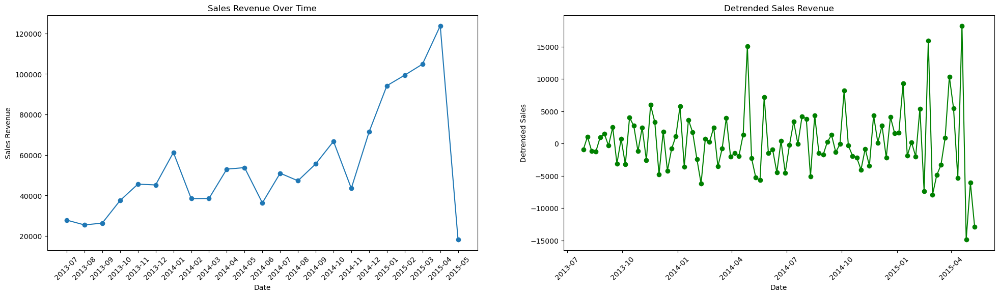

In [52]:
plt.figure(figsize=(24, 6))
plt.subplot(1,2,1)
plt.plot()

# Plot for Sales Revenue Over Time
plt.subplot(1, 2, 1)  # 1 row, 2 columns, first plot
plt.plot(sales_over_time['orderDate_o'], sales_over_time['SalesRevenue'], marker='o')
plt.title('Sales Revenue Over Time')
plt.xlabel('Date')
plt.ylabel('Sales Revenue')
plt.xticks(rotation=45)

#Plot for detrended sales (stationary)
plt.subplot(1, 2, 2)  # 1 row, 2 columns, second plot
plt.plot(detrended_sales, marker='o', color='green')
plt.title('Detrended Sales Revenue')
plt.xlabel('Date')
plt.ylabel('Detrended Sales')
plt.xticks(rotation=45)

# Display the plots
plt.show()

##### With a stationary time series, we can do the following analysis:
1. Autocorrelation and Partial Autocorrelation Analysis: identify repeating patterns or seasonality
2. ARIMA Modeling: popular technique for forecasting
3. Seasonal Decomposition: if there is seasonality, decomposes the time series into seasonal, trend, and residual components - used to understand complex patterns
4. Exponential Smoothing Models: Eg) Holt-Winters to capture trends and seasonal patterns
5. Time Series Cross-Validation: Evaluate performance of forecasting models (train test splits)
6. Machine Learning: Random Forest, Gradient Boosting, Neural Networks for time series forecasting
7. Anomaly Detection: use statistical methods to detect errors and unusual events
8. Forecasting future values
9. Explore Causual Relationships: With multiple time series datasets, we can use methods like Granger Causality Tests

Given the fact that our dataset spans less than 2 years (2013-07-04 to 2015-05-06), we will focus on autocorrelation, arima modeling, anomaly detection, and cross-validation to assess any models developed.

## Autocorrelation Analysis

Let's try to understand the linear relationship between observations in the time series at different lags. This allows us to see if high or low sales in one week means high or low sales in the next or if there is no pattern at all. We are examining if past behavior can give any clues about the future.

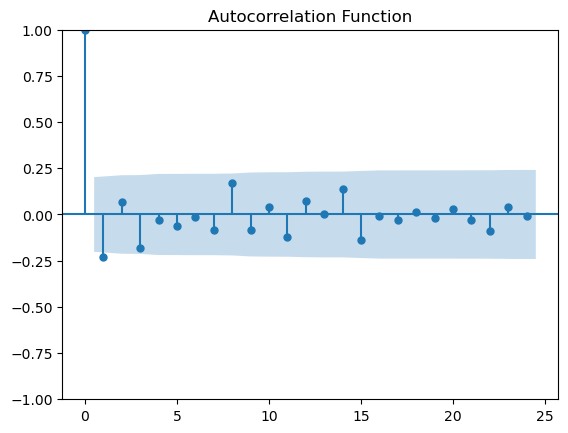

In [53]:
plot_acf(detrended_sales, lags = 24)
plt.title('Autocorrelation Function')
plt.show()

In [54]:
autocorrelation_values = acf(detrended_sales, nlags=24)
autocorrelation_series = pd.Series(autocorrelation_values)
print(autocorrelation_series)

0     1.000000
1    -0.228491
2     0.069626
3    -0.179749
4    -0.028063
5    -0.061380
6    -0.012262
7    -0.083971
8     0.172924
9    -0.084007
10    0.038953
11   -0.121813
12    0.074009
13    0.002209
14    0.138084
15   -0.135430
16   -0.009430
17   -0.028561
18    0.015394
19   -0.018900
20    0.031756
21   -0.030709
22   -0.089293
23    0.043080
24   -0.007449
dtype: float64


Our detrended_sales data is based off of our weekly_sales data which has approximately 96 weeks. A common practice is to use around a quarter or a third of the total number of data points so we should use anywhere from 24 - 32 lags.

Understanding the Chart: lag 0 will always be 1 as any series is perfectly correlated with itself at lag 0. The height and direction of the bars indicate how strong the data points are correlated with data points that are 1 - 24 weeks apart.

For example, at lag 8, we nearly have 0.25 correlation which means for a current Week X, if sales were higher than usual in Week X - 8 (weeks), then Week X would be likely to be higher than usual as well. Conversely, if sales were lower in Week X - 8, then Week X will tend to be lower as well.

However, none of our points other than lag 1 are statistically significant as they haven't passed the horizontal blue line. We can still explore some of these lags such as lag 1:-0.228, 3:-0.178, and 8:0.173

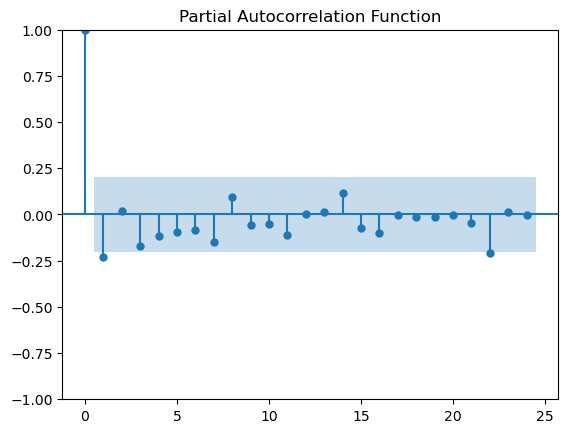

In [55]:
plot_pacf(detrended_sales, lags=24)
plt.title('Partial Autocorrelation Function')
plt.show()

In [56]:
pautocorrelation_values = pacf(detrended_sales, nlags=24)
pautocorrelation_series = pd.Series(pautocorrelation_values)
print(pautocorrelation_series)

0     1.000000
1    -0.230948
2     0.018805
3    -0.174581
4    -0.119477
5    -0.099045
6    -0.090910
7    -0.162197
8     0.102876
9    -0.065243
10   -0.057870
11   -0.130066
12    0.002134
13    0.011363
14    0.141762
15   -0.092111
16   -0.119952
17   -0.005074
18   -0.019349
19   -0.015943
20   -0.003299
21   -0.060938
22   -0.284210
23    0.014751
24   -0.002995
dtype: float64


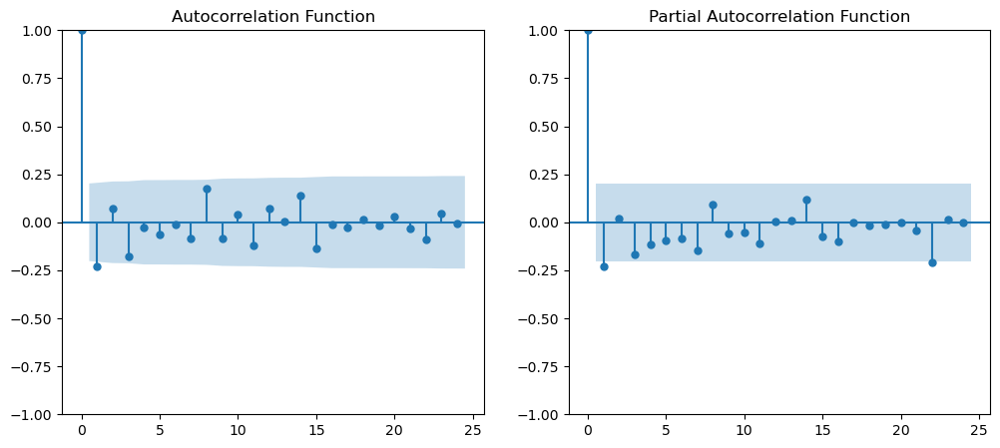

In [57]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5)) # 1 row, 2 columns

# Plot ACF on the first subplot
plot_acf(detrended_sales, lags=24, ax=axes[0])
axes[0].set_title('Autocorrelation Function')

# Plot PACF on the second subplot
plot_pacf(detrended_sales, lags=24, ax=axes[1])
axes[1].set_title('Partial Autocorrelation Function')

plt.show()

Partial Autocorrelation Function (PACF) reveals the direct relationship between a data point and its lags whereas Autocorrelation function (ACF) shows the combined direct and indirect effects of past data points on the current data point.

ACF is influenced the direct correlation between the current value and the value X lags ago as well as by the correlations at all intervening lags (1 through X-1 lags).

PACF specifically measures the direct correlation between the current value and the value at a specific lag and controls for the correlations at all intervening lags and filters out the indirect effects of the intervening periods. In short, ACF looks at the overall pattern and considers all previous weeks cumulatively and PACF focuses on the specific, isolated impact of just the one week, ignoring longer patterns or rhythms.

Looking at this chart, PACF shows us statistically significant correlations at lag 1 and lag 22 with nearly -0.25 correlation.

This tells us that if sales were higher in one week, they tend to be lower the following week. This indicates a kind of reversal pattern from one week to the next. Same thing with lag 22 where if sales were higher 22 weeks ago, they tend to be lower now.

However, none of our points other than lag 1 and 22 are statistically significant as they haven't passed the horizontal blue line. We can still explore some of these lags such as lag 1:-0.23, 14:0.142, and 22:-0.284

### Exploring Lags from ACF and PACF

#### ACF

Exploring our lags from ACF: Lags 1:-0.228, 3:-0.178, and 8:0.173

Keep in mind only lag 1 is statistically significant.

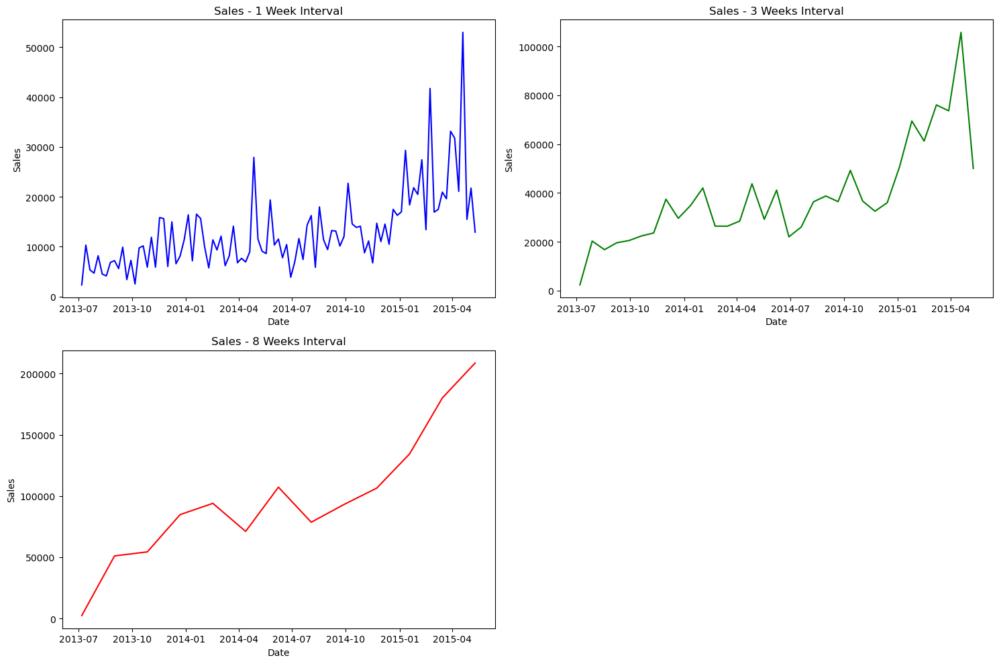

In [58]:
# Resampling the data for different intervals
week1_sales = sales_trends.resample('W').sum()  # 1 week
week3_sales = sales_trends.resample('3W').sum() # 3 weeks
week8_sales = sales_trends.resample('8W').sum() # 8 weeks

# Creating subplots
plt.figure(figsize=(15, 10))

# Plot for 1 week interval
plt.subplot(2, 2, 1)
plt.plot(week1_sales, color='blue')
plt.title('Sales - 1 Week Interval')
plt.xlabel('Date')
plt.ylabel('Sales')

# Plot for 3 weeks interval
plt.subplot(2, 2, 2)
plt.plot(week3_sales, color='green')
plt.title('Sales - 3 Weeks Interval')
plt.xlabel('Date')
plt.ylabel('Sales')

# Plot for 8 weeks interval
plt.subplot(2, 2, 3)
plt.plot(week8_sales, color='red')
plt.title('Sales - 8 Weeks Interval')
plt.xlabel('Date')
plt.ylabel('Sales')

# Adjust layout
plt.tight_layout()
plt.show()

Lag 1:-0.228 ; There is a slight tendency where high sales in one week lead to lower sales in the next.

Lag 3:-0.178 ; We also see the same thing here with the reversal pattern.

Lag 8:0.173 ; We see that every 8 weeks there tends to be an increase in total sales other than 2014-04 and 2-14-08

#### PACF

Exploring our lags from PACF: Lags 1:-0.23, 14:0.142, and 22:-0.284

Keep in mind only lag 1 and 22 are statistically significant.

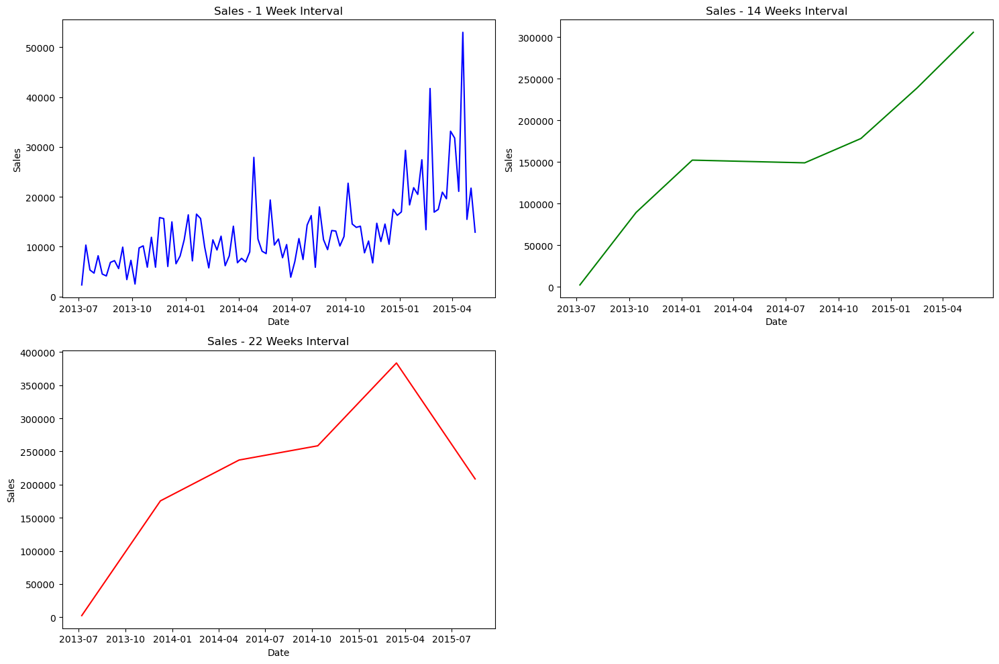

In [59]:
# Resampling the data for different intervals
week1_sales = sales_trends.resample('W').sum()  # 1 week
week14_sales = sales_trends.resample('14W').sum() # 14 weeks
week22_sales = sales_trends.resample('22W').sum() # 22 weeks

# Creating subplots
plt.figure(figsize=(15, 10))

# Plot for 1 week interval
plt.subplot(2, 2, 1)
plt.plot(week1_sales, color='blue')
plt.title('Sales - 1 Week Interval')
plt.xlabel('Date')
plt.ylabel('Sales')

# Plot for 3 weeks interval
plt.subplot(2, 2, 2)
plt.plot(week14_sales, color='green')
plt.title('Sales - 14 Weeks Interval')
plt.xlabel('Date')
plt.ylabel('Sales')

# Plot for 8 weeks interval
plt.subplot(2, 2, 3)
plt.plot(week22_sales, color='red')
plt.title('Sales - 22 Weeks Interval')
plt.xlabel('Date')
plt.ylabel('Sales')

# Adjust layout
plt.tight_layout()
plt.show()

Lag 1:-0.23 ; There is a slight tendency where high sales in one week lead to lower sales in the next.

Lag 14:0.142 ; We see that it mostly increases every 14 weeks other than the start of 2014-01

Lag 22:-0.284 ; We expect to see high total sales figures followed by a low figure every 22 weeks. This pattern seems to be masked by the overall trend increasing positively. It might be worth researching the factors driving an overall increase such as new products/services.

# AutoRegressive Integrated Moving Average (ARIMA) Model Forecasting

ARIMA is a popular statistical approach for forecasting time series data. It can be used to show trends, seasonality, and autocorrelation. It is most effective when applied to stationary time series. 

We should use ARIMA if our data has autocorrelation (current values correlated with past values), non-seasonal data (rather than seasonal where we would use SARIMA), and we want to do short-term forecasting by predicting the future based on past data trends and patterns.

The AutoRegressive part of the model can quantify how much past values affect the current value and tells us the significance of the influence of past values. The Moving Average part captures the influence of random fluctuations in the data and helps us understand how much random events have influenced current values.

## ARIMA with detrended_sales via moving avg

We need to create a train_data and test_data set in order to do a train test split with our ARIMA model. Our train_data should be a subset of our detrended_sales and be in a time series format with a time-based index and be stationary. Our train_data should exclude the most recent part of our time series which is used as a test set to evaluate the model's performance.

Since our data goes from 2013-07-04 to 2015-05-06 we don't have a full month of data at the end so I'll probably cap it at 2015-04-30.

Usually in train test splits, we keep around 70-80% of the data for training and 20-30% for testing.

## We are going to cap it at our last full week to get rid of the week of 2015-05-10
Here is some context, our original full orderDate_o goes from 2013-07-04 to 2015-05-06 and then we turned this into weekly sales which goes from 2013-07-07 to 2015-05-10 and then we differenced weekly_sales into detrended sales with a 4 week moving average which resulted in 2013-07-28 to 2015-05-10.

Because of the fact that we don't have a full month of data for 2015-05, at what date should I cap my detrended_sales for arima modeling?

So can't I just cap it at the last week? Doesn't a 4 week moving average differencing means at our current week, we subtract that week's sum of sales by the average sum of sales for the last 4 weeks including the current week?

Therefore, don't we just keep it until the last full week and not the last full month?
Yes, I think so.

In [60]:
#recall that detrended_sales is based off of weekly_sales differenced by a 4 week moving average
#We're going to cap it at the last full week since our data ends at 2015-05-06
detrended_sales_cap = detrended_sales[:'2015-05-03'] 

split_ratio = 0.7
split_index = int(len(detrended_sales_cap) * split_ratio)
split_date = detrended_sales_cap.index[split_index]

train_data = detrended_sales_cap[:split_date]
test_data = detrended_sales_cap[split_date + pd.Timedelta(days=1):]
#Because we are working with weekly data, even if we increase the date by 1 day, because there is no such date
#it jumps to the next available date; weeks=1 would be the same result


#Method 'ffill' means forward fill which replaces NaN values with the last observed non-null value
train_data.fillna(method='ffill', inplace=True)
#This is redundant because our initial check of our dataset resulted in 0 NAs for orderDate_o and SalesRevenue
#We also have already done this for weekly_sales which detrended_sales is basde off of

ARIMA() initializes the model with our train_data and takes parameters d,p,q. p represents the number of lagged observations in the model and can be determined by looking at the PACF plot. d represents the number of times the data needs to be differened to make it stationary. q is the size of the moving average window and can be determined by looking at the ACF plot as well.

For parameter p, we need to look at the lag where the PACF values are significant (outside the confidence interval) for the last time which is at lag = 22 with value -0.284210, however we can also test with lag = 1 with value -0.230948

For parameter d, it refers to the number of differences needed to make the time series stationary, usually done by subtractring the previous observation (first differencing) or more extended lags (second, third, etc., differencing) from the current observation. Given that detrended_sales is already stationary, we set d = 0, we can also test this with weekly_sales without any differencing and optimizing for d.

For parameter q, we need to look at the lag where the ACF plot where the point first crosses the significance threshold rather than last as opposed to parameter P for PACF which is at lag = 1 with value -0.228491

The number of our forecast steps should cover the entire test period. After that, we evaluate the model's performance and tweak the parameters to find the best model. Then, we can increase the forecast period depending on what we want.

### model.fit() returns a warning, plot it to show the visualization

C:\Users\valde\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Mean Squared Error: 51599330.2095564
Root Mean Squared Error: 7183.267377005843


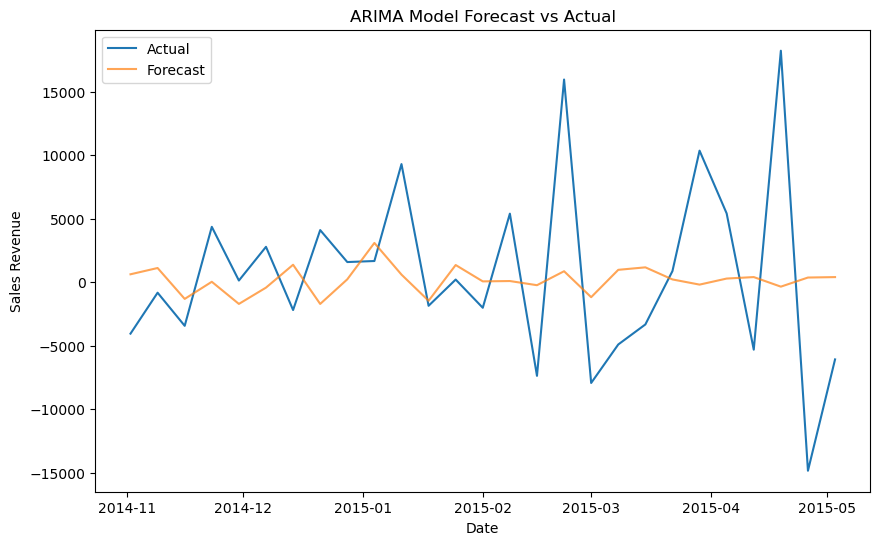

In [61]:
#ARIMA model with parameters (p, d, q)
p = 22
d = 0
q = 1
model = ARIMA(train_data, order=(p,d,q))
model_fit = model.fit()

# Making forecasts
#Our data is weekly, therefore each step represents a week
number_of_forecast_steps = len(test_data)
forecasts = model_fit.forecast(steps=number_of_forecast_steps)

# Calculate the mean squared error
mse = mean_squared_error(test_data, forecasts)
print('Mean Squared Error:', mse)

rmse = np.sqrt(mse)
print('Root Mean Squared Error:', rmse)

# Plotting the forecasts against the actual values
plt.figure(figsize=(10, 6))
plt.plot(test_data, label='Actual')
plt.plot(forecasts, label='Forecast', alpha=0.7)
plt.title('ARIMA Model Forecast vs Actual')
plt.xlabel('Date')
plt.ylabel('Sales Revenue')
plt.legend()
plt.show()



Maybe our parameters are not the best, let's see what the best parameters are according to auto_arima

In [62]:
auto_model = auto_arima(train_data, start_p=0, start_q=0,
                        max_p=24, max_q=24, m=52,
                        seasonal=False, 
                        d=None, trace=True, 
                        error_action='ignore',   
                        suppress_warnings=True, 
                        stepwise=True)

print(auto_model.summary())

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1272.316, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1272.790, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=1271.243, Time=0.01 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1267.060, Time=0.02 sec


C:\Users\valde\anaconda3\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (52) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(2,0,1)(0,0,0)[0]             : AIC=1268.565, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=1269.178, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=1268.447, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1271.623, Time=0.01 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=1271.128, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.08 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0]          
Total fit time: 0.260 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   66
Model:               SARIMAX(1, 0, 1)   Log Likelihood                -630.530
Date:                Tue, 26 Mar 2024   AIC                           1267.060
Time:                        15:17:23   BIC                           1273.629
Sample:                    07-28-2013   HQIC                          1269.656
                         - 10-26-2014                     

Let's try the arima again according to these parameters of 1,0,1

Mean Squared Error: 50486279.52629873
Root Mean Squared Error: 7105.369767035262


C:\Users\valde\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\valde\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\valde\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


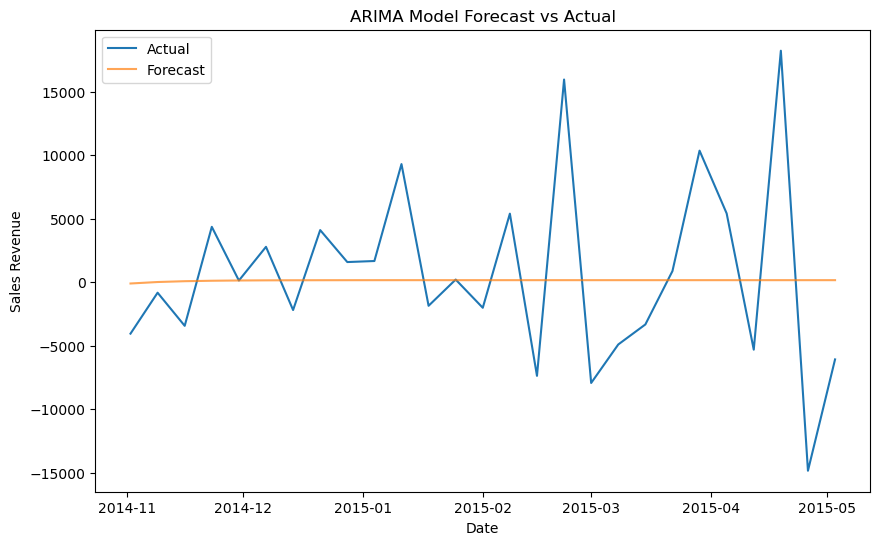

In [63]:
#ARIMA model with parameters (p, d, q)
p = 1
d = 0
q = 1
model = ARIMA(train_data, order=(p,d,q))
model_fit = model.fit()

# Making forecasts
#Our data is weekly, therefore each step represents a week
number_of_forecast_steps = len(test_data)
forecasts = model_fit.forecast(steps=number_of_forecast_steps)

# Calculate the mean squared error
mse = mean_squared_error(test_data, forecasts)
print('Mean Squared Error:', mse)

rmse = np.sqrt(mse)
print('Root Mean Squared Error:', rmse)

# Plotting the forecasts against the actual values
plt.figure(figsize=(10, 6))
plt.plot(test_data, label='Actual')
plt.plot(forecasts, label='Forecast', alpha=0.7)
plt.title('ARIMA Model Forecast vs Actual')
plt.xlabel('Date')
plt.ylabel('Sales Revenue')
plt.legend()
plt.show()


It seems like it has less error but barely, it's just a straight line now and doesn't even go up and down.

I also want to see the results of the ARIMA model if I haven't differenced the data with moving average and let ARIMA do its thing.

In [64]:
#recall that detrended_sales is based off of weekly_sales differenced by a 4 week moving average
#We're going to cap it at the last full week since our data ends at 2015-05-06
weekly_sales_cap = weekly_sales[:'2015-05-03'] 

split_ratio = 0.7
split_index = int(len(weekly_sales_cap) * split_ratio)
split_date = weekly_sales_cap.index[split_index]

train_data = weekly_sales_cap[:split_date]
test_data = weekly_sales_cap[split_date + pd.Timedelta(days=1):]
#Because we are working with weekly data, even if we increase the date by 1 day, because there is no such date
#it jumps to the next available date; weeks=1 would be the same result


#Method 'ffill' means forward fill which replaces NaN values with the last observed non-null value
train_data.fillna(method='ffill', inplace=True)
#This is redundant because our initial check of our dataset resulted in 0 NAs for orderDate_o and SalesRevenue
#We also have already done this for weekly_sales which detrended_sales is basde off of

C:\Users\valde\AppData\Local\Temp\ipykernel_19140\1032414174.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_data.fillna(method='ffill', inplace=True)


C:\Users\valde\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\valde\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Mean Squared Error: 91645532.85744815
Root Mean Squared Error: 9573.167336751621


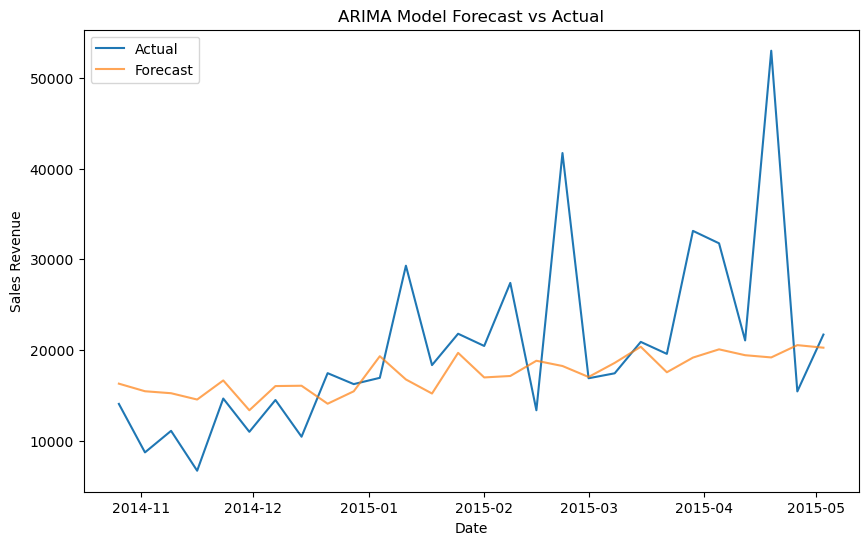

In [65]:
#ARIMA model with parameters (p, d, q)
p = 22
d = 2
q = 1
model = ARIMA(train_data, order=(p,d,q))
model_fit = model.fit()

# Making forecasts
#Our data is weekly, therefore each step represents a week
number_of_forecast_steps = len(test_data)
forecasts = model_fit.forecast(steps=number_of_forecast_steps)

# Calculate the mean squared error
mse = mean_squared_error(test_data, forecasts)
print('Mean Squared Error:', mse)

rmse = np.sqrt(mse)
print('Root Mean Squared Error:', rmse)

# Plotting the forecasts against the actual values
plt.figure(figsize=(10, 6))
plt.plot(test_data, label='Actual')
plt.plot(forecasts, label='Forecast', alpha=0.7)
plt.title('ARIMA Model Forecast vs Actual')
plt.xlabel('Date')
plt.ylabel('Sales Revenue')
plt.legend()
plt.show()


Testing from d = 0 to d = 4, d = 2 nets us the best RMSE but it is worse than our detrended sales via moving average. Let's try using auto_arima again with this non-detrended data and see what it tells us.

In [66]:
auto_model = auto_arima(train_data, start_p=0, start_q=0,
                        max_p=24, max_q=24, m=52,
                        seasonal=False, 
                        d=None, trace=True, 
                        error_action='ignore',   
                        suppress_warnings=True, 
                        stepwise=True)

print(auto_model.summary())

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1366.221, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1348.334, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.04 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1364.279, Time=0.01 sec


C:\Users\valde\anaconda3\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (52) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=1336.682, Time=0.02 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=1333.644, Time=0.02 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=1333.575, Time=0.02 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=1334.388, Time=0.03 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=1333.971, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=1331.969, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1330.172, Time=0.02 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=1332.744, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=1331.990, Time=0.10 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=1328.424, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=1327.220, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=1325.723, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=1327.156, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)

Mean Squared Error: 145317539.73322368
Root Mean Squared Error: 12054.772487825046


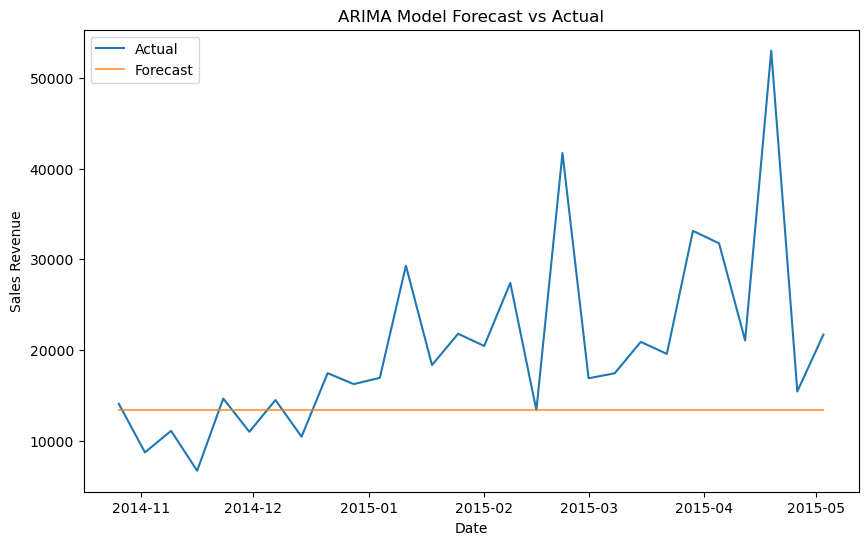

In [67]:
#ARIMA model with parameters (p, d, q)
p = 0
d = 1
q = 1
model = ARIMA(train_data, order=(p,d,q))
model_fit = model.fit()

# Making forecasts
#Our data is weekly, therefore each step represents a week
number_of_forecast_steps = len(test_data)
forecasts = model_fit.forecast(steps=number_of_forecast_steps)

# Calculate the mean squared error
mse = mean_squared_error(test_data, forecasts)
print('Mean Squared Error:', mse)

rmse = np.sqrt(mse)
print('Root Mean Squared Error:', rmse)

# Plotting the forecasts against the actual values
plt.figure(figsize=(10, 6))
plt.plot(test_data, label='Actual')
plt.plot(forecasts, label='Forecast', alpha=0.7)
plt.title('ARIMA Model Forecast vs Actual')
plt.xlabel('Date')
plt.ylabel('Sales Revenue')
plt.legend()
plt.show()

Overall, none of these parameters are giving us very good results. Let's try SARIMAX since arima is well-suited for non-seasonal time series and sarimax supports seasonality. First, we'll get our detrended train and test data back and apply sarimax.

In [68]:
#recall that detrended_sales is based off of weekly_sales differenced by a 4 week moving average
#We're going to cap it at the last full week since our data ends at 2015-05-06
detrended_sales_cap = detrended_sales[:'2015-05-03'] 

split_ratio = 0.7
split_index = int(len(detrended_sales_cap) * split_ratio)
split_date = detrended_sales_cap.index[split_index]

train_data = detrended_sales_cap[:split_date]
test_data = detrended_sales_cap[split_date + pd.Timedelta(days=1):]
#Because we are working with weekly data, even if we increase the date by 1 day, because there is no such date
#it jumps to the next available date; weeks=1 would be the same result


#Method 'ffill' means forward fill which replaces NaN values with the last observed non-null value
train_data.fillna(method='ffill', inplace=True)
#This is redundant because our initial check of our dataset resulted in 0 NAs for orderDate_o and SalesRevenue
#We also have already done this for weekly_sales which detrended_sales is basde off of

In [69]:
auto_model = auto_arima(train_data, start_p=0, start_q=0,
                        max_p=24, max_q=24, m=52,
                        seasonal=True, 
                        d=None, trace=True, 
                        error_action='ignore',   
                        suppress_warnings=True, 
                        stepwise=True)

print(auto_model.summary())

Performing stepwise search to minimize aic


C:\Users\valde\anaconda3\Lib\site-packages\pmdarima\arima\utils.py:117: UserWarning: Appropriate D value may not have been reached; length of seasonally-differenced array (14) is shorter than m (52). Using D=1
  warnings.warn("Appropriate D value may not have been reached; "


 ARIMA(0,0,0)(1,1,1)[52] intercept   : AIC=inf, Time=3.27 sec
 ARIMA(0,0,0)(0,1,0)[52] intercept   : AIC=278.827, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[52] intercept   : AIC=inf, Time=2.95 sec
 ARIMA(0,0,1)(0,1,1)[52] intercept   : AIC=inf, Time=4.74 sec
 ARIMA(0,0,0)(0,1,0)[52]             : AIC=277.019, Time=0.08 sec
 ARIMA(0,0,0)(1,1,0)[52] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(0,0,0)(0,1,1)[52] intercept   : AIC=inf, Time=2.25 sec
 ARIMA(1,0,0)(0,1,0)[52] intercept   : AIC=280.048, Time=0.08 sec
 ARIMA(0,0,1)(0,1,0)[52] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,1)(0,1,0)[52] intercept   : AIC=276.946, Time=0.93 sec
 ARIMA(1,0,1)(1,1,0)[52] intercept   : AIC=inf, Time=3.37 sec
 ARIMA(1,0,1)(0,1,1)[52] intercept   : AIC=277.295, Time=5.42 sec
 ARIMA(1,0,1)(1,1,1)[52] intercept   : AIC=275.925, Time=6.50 sec
 ARIMA(1,0,1)(2,1,1)[52] intercept   : AIC=inf, Time=18.48 sec
 ARIMA(1,0,1)(1,1,2)[52] intercept   : AIC=278.986, Time=13.20 sec
 ARIMA(1,0,1)(0,1,2)[52] intercept   : A

C:\Users\valde\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['maxiter']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
C:\Users\valde\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Mean Squared Error: 88911505.9488568
Root Mean Squared Error: 9429.289790268236


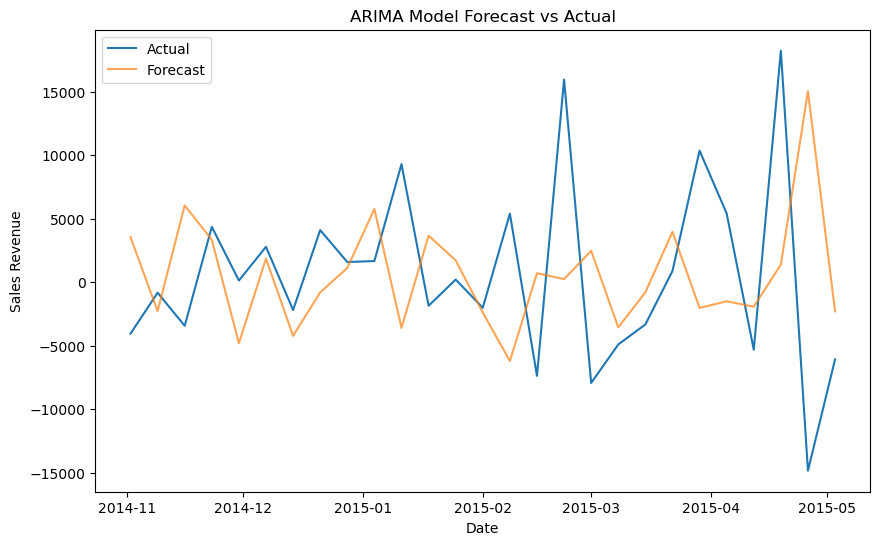

In [70]:
# ARIMA model parameters
p = 1
d = 0
q = 1

# Seasonal parameters - these are placeholders and should be adjusted for your data
P = 1  # Seasonal autoregressive order
D = 1  # Seasonal differencing order
Q = 0  # Seasonal moving average order
s = 52  # Seasonal period (e.g., 52 for weekly data in a year)

# Fit a SARIMAX model
model = sm.tsa.SARIMAX(train_data, 
                       order=(p, d, q), 
                       seasonal_order=(P, D, Q, s),
                       enforce_stationarity=False, 
                       enforce_invertibility=False, maxiter = 500)

model_fit = model.fit()

# Make forecasts
number_of_forecast_steps = len(test_data)
forecasts = model_fit.forecast(steps=number_of_forecast_steps)

# Calculate the mean squared error
mse = mean_squared_error(test_data, forecasts)
print('Mean Squared Error:', mse)

rmse = np.sqrt(mse)
print('Root Mean Squared Error:', rmse)

# Plotting the forecasts against the actual values
plt.figure(figsize=(10, 6))
plt.plot(test_data, label='Actual')
plt.plot(forecasts, label='Forecast', alpha=0.7)
plt.title('ARIMA Model Forecast vs Actual')
plt.xlabel('Date')
plt.ylabel('Sales Revenue')
plt.legend()
plt.show()



SARIMAX has captured a lot of highs and lows and is the best model so far. Time series cross-validation is about the model's performance over different periods of time. However, since it only uses one model, we need to compare its performance against another model for the same periods of time to see which model's better.

## Apply our model to our original dataset
1. Apply the detrending phase to the entire dataset
2. Fit the SARIMAX model to our entire dataset and Forecast the future values
3. Inverse the detrending process to the entire dataset and plot

Recall the how we made our detrended_sales based off of our weekly_sales:

sales_trends = final_df[['orderDate_o','SalesRevenue']]

sales_trends.set_index('orderDate_o', inplace=True)

sales_trends.fillna(method='ffill',inplace=True)

weekly_sales = sales_trends.resample('W').sum()

window_size = 4

moving_avg = weekly_sales['SalesRevenue'].rolling(window = window_size).mean()

detrended_sales = weekly_sales['SalesRevenue'] - moving_avg

detrended_sales = detrended_sales.dropna()


### 1. Apply detrending phase to the entire dataset

In [71]:
#We have already done this
detrended_sales.head(5)

orderDate_o
2013-07-28    -969.48875
2013-08-04    1050.37625
2013-08-11   -1169.11375
2013-08-18   -1248.85125
2013-08-25     932.07125
Freq: W-SUN, Name: SalesRevenue, dtype: float64

### 2. Fit SARIMAX model to our entire dataset and forecasting future values

Applying the SARIMAX Model to our entire dataset in weekly sales detrended for 96 weeks (2 years)

C:\Users\valde\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['maxiter']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
C:\Users\valde\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


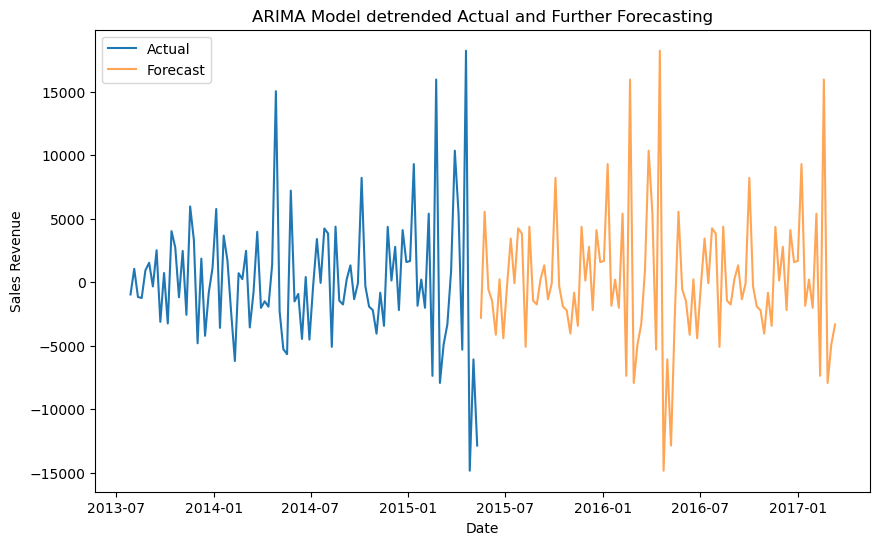

In [72]:
# ARIMA model parameters
p = 1
d = 0
q = 1

# Seasonal parameters - these are placeholders and should be adjusted for your data
P = 1  # Seasonal autoregressive order
D = 1  # Seasonal differencing order
Q = 0  # Seasonal moving average order
s = 52  # Seasonal period (e.g., 52 for weekly data in a year)

# Fit a SARIMAX model
model = sm.tsa.SARIMAX(detrended_sales, 
                       order=(p, d, q), 
                       seasonal_order=(P, D, Q, s),
                       enforce_stationarity=False, 
                       enforce_invertibility=False, maxiter = 500)

model_fit = model.fit()

# Make forecasts
number_of_forecast_steps = 96
forecasts = model_fit.forecast(steps=number_of_forecast_steps)

# Plotting the forecasts against the actual values
plt.figure(figsize=(10, 6))
plt.plot(detrended_sales, label='Actual')
plt.plot(forecasts, label='Forecast', alpha=0.7)
plt.title('ARIMA Model detrended Actual and Further Forecasting')
plt.xlabel('Date')
plt.ylabel('Sales Revenue')
plt.legend()
plt.show()


### 3. Inverse detrending process to our entire dataset and plot

We already have weekly_sales before we applied detrending to it. All we need to do is inverse the detrend of the forecasted values. We are going to use the last known value of the moving average for the forecasted points.

In [73]:
last_known_moving_avg = moving_avg.iloc[-1]
forecasts_retrend = forecasts + last_known_moving_avg

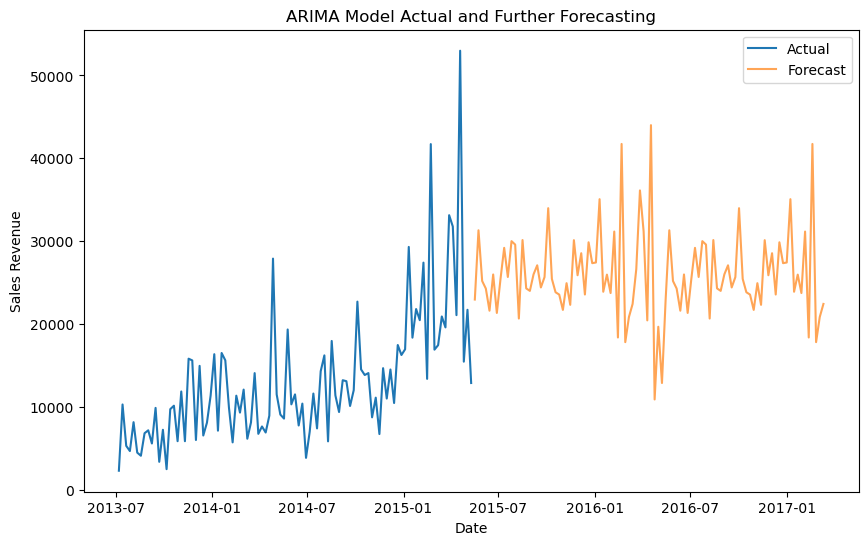

In [74]:
# Plotting the forecasts against the actual values
plt.figure(figsize=(10, 6))
plt.plot(weekly_sales, label='Actual')
plt.plot(forecasts_retrend, label='Forecast', alpha=0.7)
plt.title('ARIMA Model Actual and Further Forecasting')
plt.xlabel('Date')
plt.ylabel('Sales Revenue')
plt.legend()
plt.show()

It's not the worst model but it's definitely wrong as we see huge upward spikes within every 6 months. Let's try other machine learning models and see if we can get a better result or insights.

# Linear Regression

### Select interesting target variables:

freight_o: predicting freight costs for logistics planning, how do different factors affect the cost?

quantity_od: knowing what affects quantity could assist in inventory management.

unitPrice_od: pricing strategies could be created seeing how it varies

productID: predicting the demand for each producct for stock management and marketing.

### Linear Regression Strategy

To begin, we must choose features that are usable to linear regression and would affect our target variable. These features must not be highly correlated with each other to prevent multicollinearity where one feature is super helpful in predicting our target.

Another technique to reduce dimensionality (# of features you have) is by using Principal Component Analysis

We then split our data into training and testing sets to evaluate the model's performance and train a linear regression model on the training set.

We evaluate the model with R-Squared, MAE, or MSE and check the residuals of the model for normal distribution to confirm the assumption of linear regression.

Use cross-validation such as k-fold cross-validation to validate the model's performance across different subsets.

Interpret the coefficients of the model to understand the influence of each feature on the target variable.


We are going to stick to Sales Revenue just so it's related to our ARIMA model. We can't forecast future Sales Revenue with Linear Regression without being given future data for our features but we can identify the strength and relationship between our given features and Sales Revenue.

## Choosing features and transforming our dataframe for Linear Regression

Columns like orderID and customerID should be excluded as they are identifiers, we already have the names of these IDs thanks to our merge.

We are going to convert our date values into year, month, day, day of the week. Time delta (time since start) would be useful for trends over time but we already know that it trends upwards based on previous analysis. It is more interesting to capture seasonality, cyclical patterns and day-of-week effects.

If we regenerate our heatmap to include Sales Revenue, we can see freight_o has a 0.41 correlation with Sales Revenue which is significant but not overwhelming such that it would dominate or skew the model therefore we can keep freight_o despite knowing that intuitively, higher freight cost means more items which could mean more Sales Revenue.

Many of these categorical columns such as companyName, contactName, employeeName, title, city, etc will have a high number of unique values (high cardinality) and will result in a large number of features when encoded which makes the model prone to overfitting.

We're going to include categories and products since it would be interesting to see which categories/products affect Sales Revenue the most.

Keep in mind that SalesRevenue was our own calculated column created from final_df['SalesRevenue'] = final_df['unitPrice_od'] * (1 - final_df['discount_od']) * final_df['quantity_od']

Which means that we have to exclude these 3 columns to prevent multicollinearity since they would be highly correlated with Sales Revenue.

In [75]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2155 entries, 0 to 2154
Data columns (total 34 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   orderID               2155 non-null   int64         
 1   customerID            2155 non-null   object        
 2   employeeID            2155 non-null   int64         
 3   orderDate_o           2155 non-null   datetime64[ns]
 4   requiredDate_o        2155 non-null   datetime64[ns]
 5   shippedDate_o         2082 non-null   datetime64[ns]
 6   shipperID             2155 non-null   int64         
 7   freight_o             2155 non-null   float64       
 8   productID             2155 non-null   int64         
 9   unitPrice_od          2155 non-null   float64       
 10  quantity_od           2155 non-null   int64         
 11  discount_od           2155 non-null   float64       
 12  companyName_cust      2155 non-null   object        
 13  contactName_cust  

### Converting dates
Note when using dt.dayofweek, 0 represents Monday and 6 is Sunday

In [76]:
# Transform date columns
for date_col in ['orderDate_o', 'requiredDate_o', 'shippedDate_o']:
    final_df[date_col + '_year'] = final_df[date_col].dt.year
    final_df[date_col + '_month'] = final_df[date_col].dt.month
    final_df[date_col + '_day'] = final_df[date_col].dt.day
    final_df[date_col + '_weekday'] = final_df[date_col].dt.weekday

### Selecting columns

pd.get_dummies returns bool dtypes, we will convert them into int columns just in case.

In [77]:
feature_columns = [col for col in final_df.columns if 'year' in col or 'month' in col or 'day' in col or 'weekday' in col]
feature_columns += ['freight_o','categoryName_cat', 'productName_prod']

df_features = final_df[feature_columns]
df_features = pd.get_dummies(df_features, columns = ['categoryName_cat','productName_prod'], drop_first=True)

for col in df_features.columns:
    if df_features[col].dtype == 'bool':
        df_features[col] = df_features[col].astype(int)
        
df_features.head(5)

,orderDate_o_year,orderDate_o_month,orderDate_o_day,orderDate_o_weekday,requiredDate_o_year,requiredDate_o_month,requiredDate_o_day,requiredDate_o_weekday,shippedDate_o_year,shippedDate_o_month,...,productName_prod_Teatime Chocolate Biscuits,productName_prod_Thüringer Rostbratwurst,productName_prod_Tofu,productName_prod_Tourtière,productName_prod_Tunnbröd,productName_prod_Uncle Bob's Organic Dried Pears,productName_prod_Valkoinen suklaa,productName_prod_Vegie-spread,productName_prod_Wimmers gute Semmelknödel,productName_prod_Zaanse koeken
0,2013,7,4,3,2013,8,1,3,2013.0,7.0,...,0,0,0,0,0,0,0,0,0,0
1,2015,3,12,3,2015,3,26,3,2015.0,3.0,...,0,0,0,0,0,0,0,0,0,0
2,2014,6,17,1,2014,7,15,1,2014.0,6.0,...,0,0,0,0,0,0,0,0,0,0
3,2015,3,4,2,2015,4,1,2,2015.0,3.0,...,0,0,0,0,0,0,0,0,0,0
4,2015,1,20,1,2015,2,17,1,2015.0,1.0,...,0,0,0,0,0,0,0,0,0,0


### Prepare X,Y and train_test_split then creating and training our model, predicting, and evaluating

We will first try LinearRegression from sklearn and then use OLS from statsmodels. LinearRegression is designed for ML and predictive modeling and focuses on simplicity and practicality hence it lacks statistical summaries by default. Meanwhile, OLS provides extensive statistical summaries such as coefficients, errors, confidence intervals, significance tests, and other diagnostic measures.

Using OLS over LinearRegression would allow us to understand the statistical significance of the relationships between our variables and the detailed diagnostics of our model.

In [78]:
#features and target
##We know that some ship dates have NaN and we will drop the corresponding rows from y
X = df_features.dropna() 
remaining_indexes = X.index

y = final_df['SalesRevenue'].loc[remaining_indexes]

#train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=33)

# Create and train the Linear Regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)
y_test_mean = y_test.mean()
y_pred_mean = y_pred.mean()

# Print performance metrics

# Coefficients and Intercept: LinearRegression from sklearn is designed for ML and predictive modeling
#feature_names = X_train.columns
#for i, name in enumerate(feature_names):
   # print(f"{name}: {model.coef_[i]}")
#print("Intercept:", model.intercept_)

print(f'y_test_mean: {y_test_mean}')
print(f'y_pred_mean: {y_pred_mean}')
print(f'Mean Squared Error: {mse}')
print(f'Root Mean Squared Error: {rmse}')
print(f'R-squared: {r2}')

y_test_mean: 578.3026894484412
y_pred_mean: 564.50131192882
Mean Squared Error: 375781.4748995574
Root Mean Squared Error: 613.010175200671
R-squared: 0.5510290097893603


The constant (intercept) needs to be added to our model since statsmodels (unlike scikit-learn) doesn't automatically include it. We need to include it because it represents the expected mean of our target variable when all our features are set to zero. Unless we know for sure that when all predictors are 0, the response will also be 0, we add the constant so that the regression line doesn't go through the origin (0,0) to better fit the data.

In [79]:
# Assuming X and y are already defined
# Add a constant to the model (intercept) since statsmodels doesn't have an intercept by default
X_with_constant = sm.add_constant(X)

# Create the model
model = sm.OLS(y, X_with_constant)

# Fit the model
results = model.fit()

# View the summary
print(results.summary())


                            OLS Regression Results                            
Dep. Variable:           SalesRevenue   R-squared:                       0.576
Model:                            OLS   Adj. R-squared:                  0.557
Method:                 Least Squares   F-statistic:                     30.72
Date:                Tue, 26 Mar 2024   Prob (F-statistic):          2.01e-305
Time:                        15:20:59   Log-Likelihood:                -16396.
No. Observations:                2082   AIC:                         3.297e+04
Df Residuals:                    1993   BIC:                         3.347e+04
Df Model:                          88                                         
Covariance Type:            nonrobust                                         
                                                        coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------

#### Actual vs Predicted Values plot

This plot shows the relationship between actual values and the values predicted by the model. Points near the ideal fit line (actual = predicted) indicate a good model fit. This plot is useful for evaluating the overall performance of the model and identifying and predicted biases or patterns.

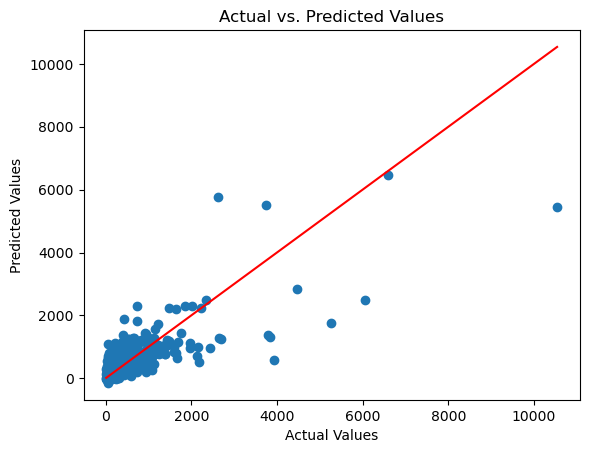

In [80]:
# Add a constant to X_test: model trained with an intercept, therefore X_test also added to maintain consistency
X_test_with_const = sm.add_constant(X_test, has_constant='add')

# Predict values
y_pred = results.predict(X_test_with_const)

# Scatter plot of Actual vs Predicted values
plt.scatter(y_test, y_pred)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs. Predicted Values')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red')  # Ideal fit line
plt.show()

## OLS Regression Results Explanation 

In [81]:
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:           SalesRevenue   R-squared:                       0.576
Model:                            OLS   Adj. R-squared:                  0.557
Method:                 Least Squares   F-statistic:                     30.72
Date:                Tue, 26 Mar 2024   Prob (F-statistic):          2.01e-305
Time:                        15:20:59   Log-Likelihood:                -16396.
No. Observations:                2082   AIC:                         3.297e+04
Df Residuals:                    1993   BIC:                         3.347e+04
Df Model:                          88                                         
Covariance Type:            nonrobust                                         
                                                        coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------

Our Model is OLS (Ordinary Least Squares) with Method Least Squares which is one of the simplest and straightforward techniques for regression analysis and is often a good starting point for linear modeling problems. It is easy to interpret as each coefficient quantifies the change in the dependent variable (SalesRevenue) for a one-unit change in the independent variable (holding all other variables constant).

The OLS Model is intrinsically linked with the least squares method where it estimates the coefficients of the OLS model by minimizing the sum of the squares of the residuals (differences between observed and predicted values).

OLS assumes that our features and our target have a linear relationship and that we have constant variance (homoscedasticity) of errors across all levels of the independent variables.

A low Prob (F-statistic) value suggests that our model is statistically significant.

AIC and BIC are used to compare different models where lower values generally indicate a better model. AIC aims to select the model that best explains the data with minimal amount of information loss while BIC penalizes more heavily for increasing sample size.

In short, selecting models using AIC is better when aiming to predict future observations whereas BIC is used to select the model that best explains the observed data.

#### R-squared and Adj. R-squared

There is a slight difference between using r2_score and the R-squared returned from our OLS model. This is expected and normal because r2_score evaluates the model's predictive performance on unseen data whereas the OLS model evaluates how well our model fits the training data.

R-squared tells us how well our model fits the data. For this model, 57.6% of the variance in Sales Revenue can be explained by the model's predictors. 
Adjusted R-Squared is similar to R-squared but adjusts for the number of predictors in the model since a large number of predictors could inflate the R-squared value. It is penalized for adding predictors that do not improve the model.

#### Assumptions of the Data: Linearity and Homoscedasticity

To check for linearity, let's create a scatterplot for each independent variable against the dependent variable and look for a linear pattern. If the relationships look curved or complex, linearity may be violated.

We will also plot the residuals against the predicted values, if there is a linear pattern without discernible shape, it suggests linearity.

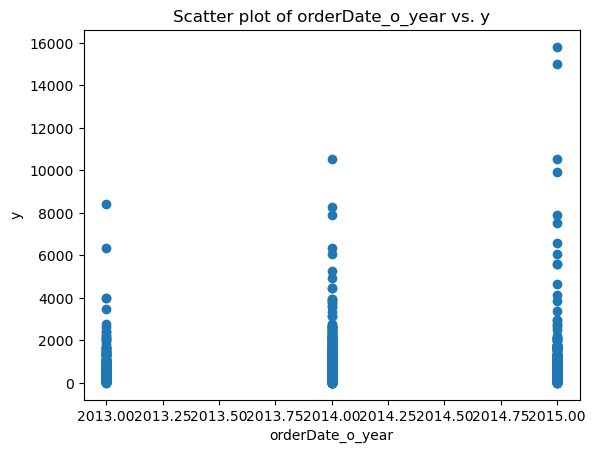

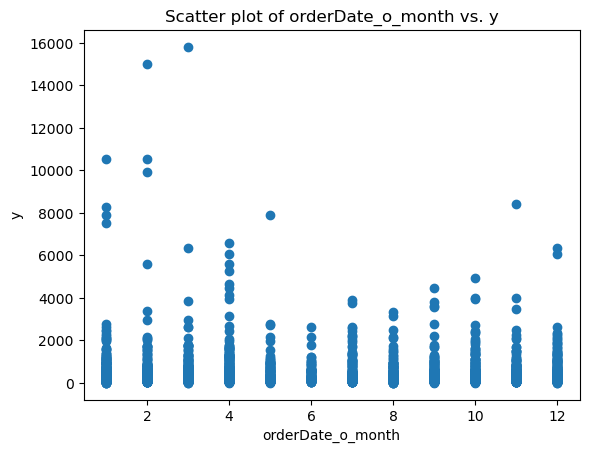

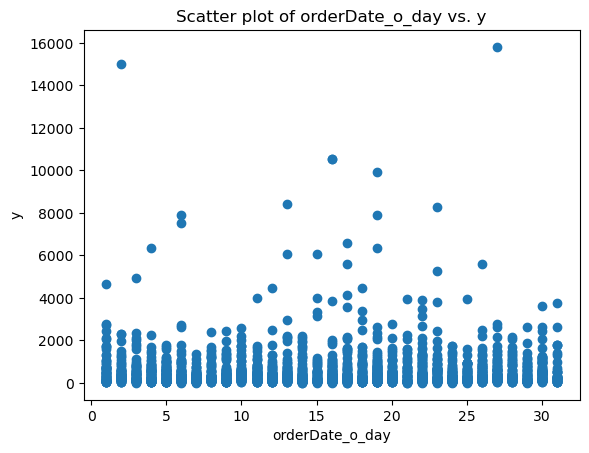

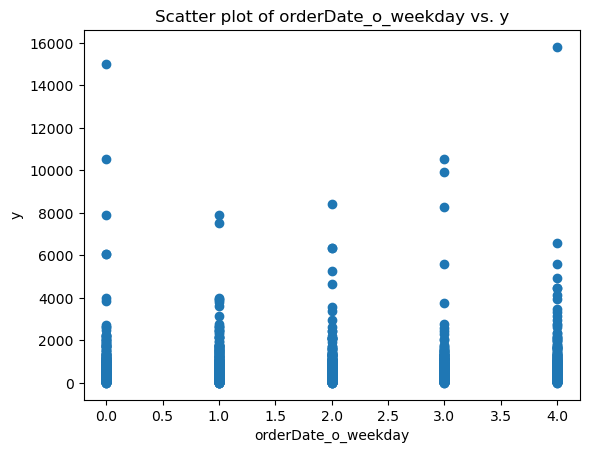

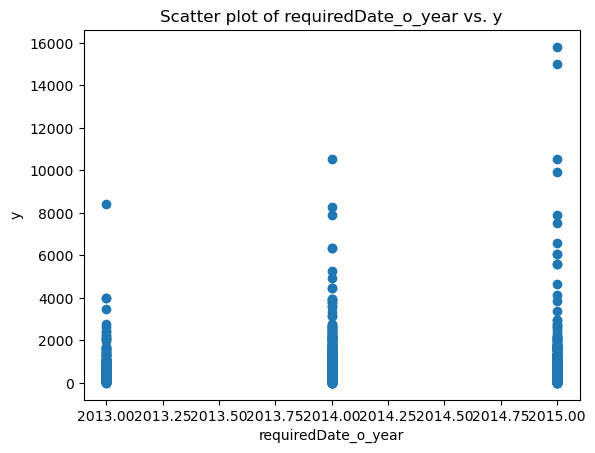

...

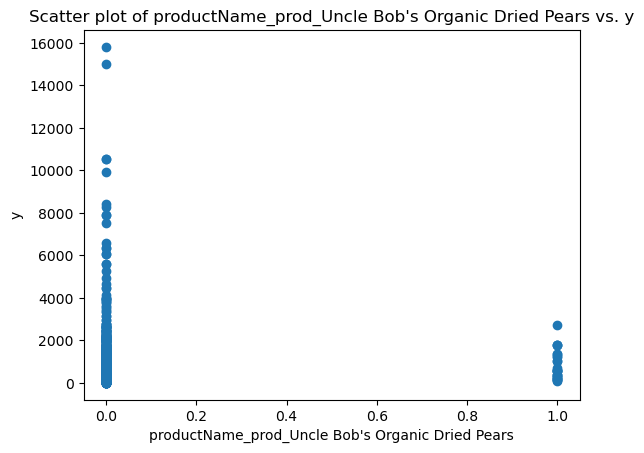

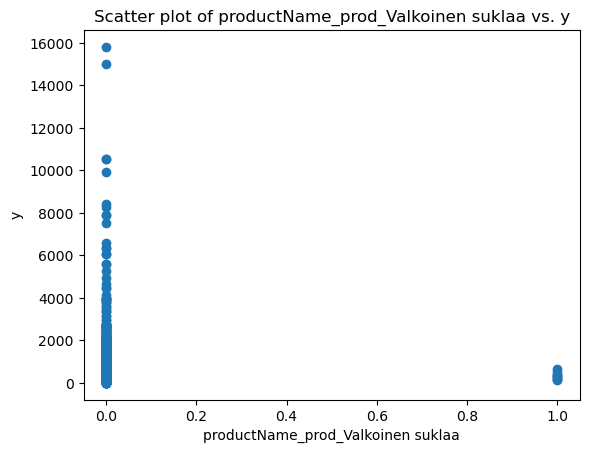

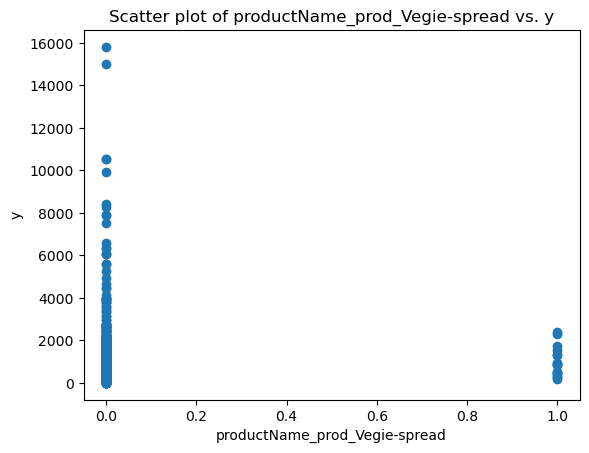

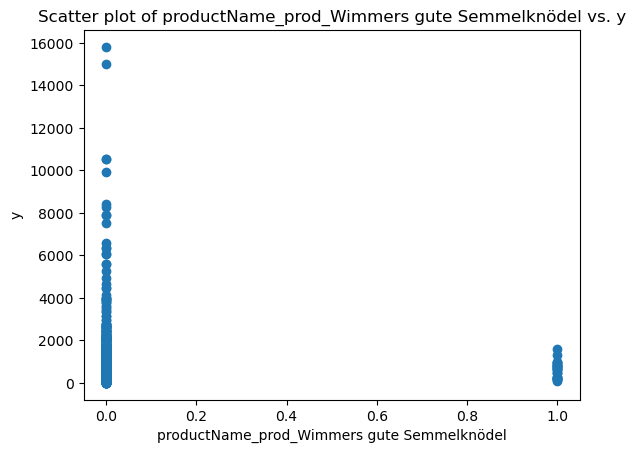

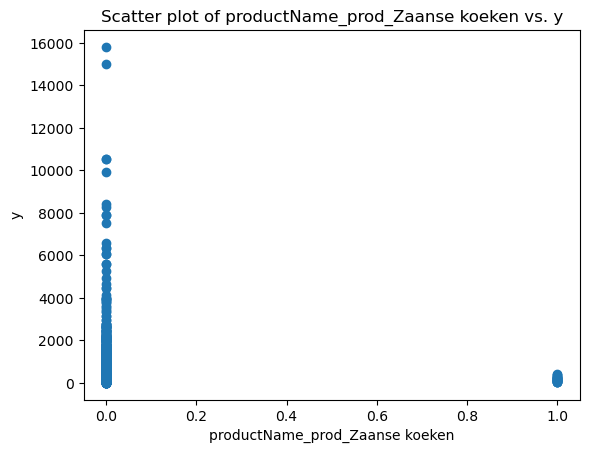

In [82]:
# Assuming 'df' is your DataFrame with independent variables 'X' and dependent variable 'y'
for column in X.columns:  # Exclude the dependent variable
    plt.scatter(X[column], y)
    plt.title(f'Scatter plot of {column} vs. y')
    plt.xlabel(column)
    plt.ylabel('y')
    plt.show()

We can see some sort of cyclical and seasonality for our date variables but since we have a lot of dummy variables, scatter plots are less informative since they are 0 or 1. In this case, Residual plots will be more informative for us.

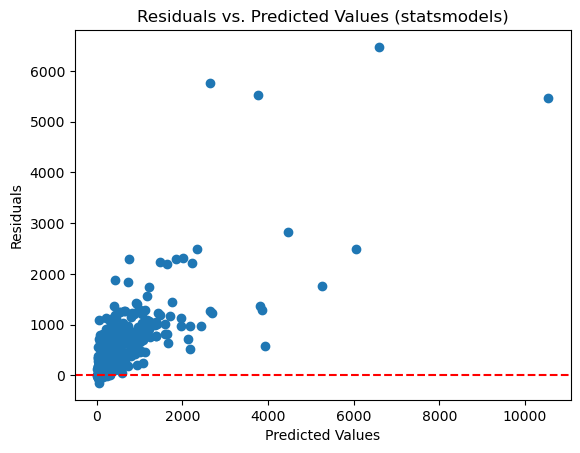

In [83]:
# Calculate residuals
residuals_statsmodels = results.resid

# Since results.fittedvalues contains the predicted values on the entire dataset (X_with_constant),
# ensure you're only plotting for the test set. This requires aligning the indices.

# Align indices of the test set and the fitted values
aligned_y_pred, aligned_residuals = y_test.align(pd.Series(results.fittedvalues, index=X_with_constant.index), join='inner')

# Plot residuals against predicted values
plt.scatter(aligned_y_pred, aligned_residuals)
plt.title('Residuals vs. Predicted Values (statsmodels)')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.axhline(y=0, color='red', linestyle='--')
plt.show()

Based on this plot, the residuals are not randomly distributed around the horizontal axis of y = 0 and seems to increase as there are higher predicted values. This suggests heteroscedasticity where the variance of the residuals are unequal.

There are many points with high residuals especially at higher predicted values which could be outliers or observations not well explained by the model.

In [84]:
from statsmodels.stats.diagnostic import het_breuschpagan
residuals = results.resid
bp_test = het_breuschpagan(residuals, results.model.exog)
labels = ['Lagrange Multiplier Statistic', 'p-value', 'f-value', 'f p-value']
print(dict(zip(labels, bp_test)))


{'Lagrange Multiplier Statistic': 542.7152537530454, 'p-value': 1.5735776170128928e-63, 'f-value': 7.985050903490213, 'f p-value': 6.389371916729239e-80}


Breusch-Pagan test formally tests for homoscedasticity and our results of small p-values for both Lagrange and f-value leads us to reject the null hypothesis of having homoscedasticity which means we have heteroscedasticity where the variance of the residuals are not constant across levels of the independent variables in our model.

Based on these plots and tests, our OLS model lacks linearity between features and target and is not adequate.

## Explaining linear regression summary diagnostic measures

In [85]:
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:           SalesRevenue   R-squared:                       0.576
Model:                            OLS   Adj. R-squared:                  0.557
Method:                 Least Squares   F-statistic:                     30.72
Date:                Tue, 26 Mar 2024   Prob (F-statistic):          2.01e-305
Time:                        15:21:11   Log-Likelihood:                -16396.
No. Observations:                2082   AIC:                         3.297e+04
Df Residuals:                    1993   BIC:                         3.347e+04
Df Model:                          88                                         
Covariance Type:            nonrobust                                         
                                                        coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------

### Normal Distribution of Residuals

Omnibus tests for the normality of residuals and checks whether the differences between observed and predicted values follow a normal distribution. If our model is well-fitted, the residuals should be approximately normally distributed. A large Omnibus statistic indicates non-normality. We typically just look at Prob(Omnibus) to determine this. A low p-value (typically < 0.05) means that our null hypothesis of normally distributed residuals can be rejected therefore we do not have normally distributed residuals. 

We can confirm this with a residual histogram, qq-plot, and shapiro test.

#### Residual Histogram, qq-plot charts, and shapiro test

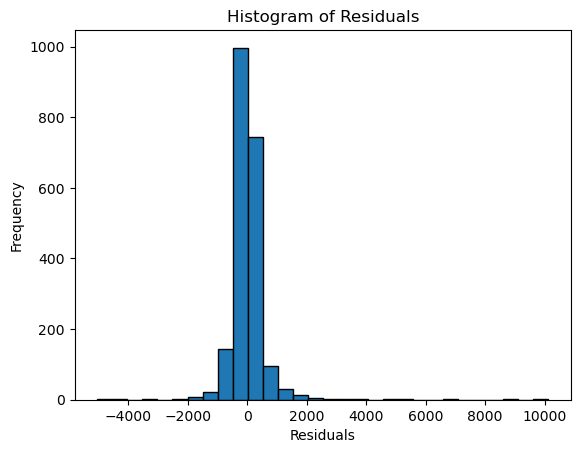

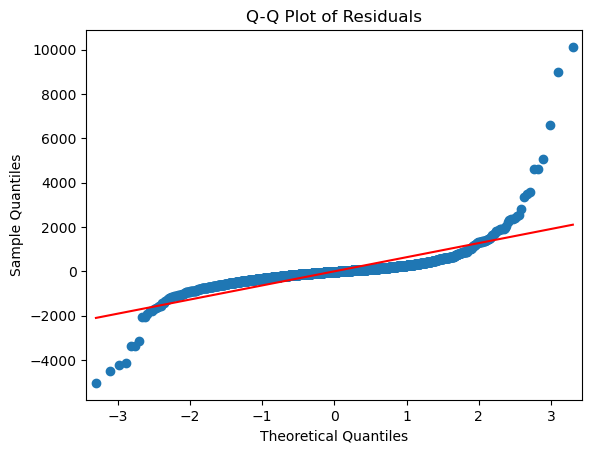

In [86]:
residuals = results.resid

# Histogram of residuals
plt.hist(residuals, bins=30, edgecolor = 'black')
plt.title('Histogram of Residuals')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()

# Q-Q plot
sm.qqplot(residuals, line='s')
plt.title('Q-Q Plot of Residuals')
plt.show()

In [87]:
from scipy.stats import shapiro

stat, p_value = shapiro(residuals)
print('Statistics=%.3f, p=%.3f' % (stat, p_value))

Statistics=0.636, p=0.000


The histogram displays the frequency distribution of the residuals. If it was perfectly normal, it would look like a symmetrical bell curve centered around 0. In our case, there is a significant skew to the right which indicates a lot of large positive residuals.

The Q-Q plot compares the quantiles of the residuals to the quantiles of a normal distribution. If the residuals were perfectly normally distributed, the points would fall on the red line. In our case, our points deviate significantly away from the line especially in the tails which are the lower and upper ends of the distribution.

The Shapiro-Wilk test is designed to test the normality of the data (residuals in our case) for small to moderate sample sizes and is more sensitive to departures from normality than the Omnibus test. A value close to 1 indicates that the sample has a distribution close to normal and a low p-value means the data doesn't follow a normal distribution. In our case, 0.636 is far from 1 and our p-value is 0.

In conclusion, seeing the skewness in our histogram, the deviation in the tails of the q-q plot, and the shapiro-test, we can confirm that our residuals are not normally distributed and fails the assumption of our linear model.

In [88]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Assuming 'X' is your dataframe of predictors
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns

# Calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(len(X.columns))]

print(vif_data)

C:\Users\valde\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:198: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


                                              feature           VIF
0                                    orderDate_o_year  3.687500e+03
1                                   orderDate_o_month  7.279870e+02
2                                     orderDate_o_day  5.473210e+00
3                                 orderDate_o_weekday           inf
4                                 requiredDate_o_year  2.038689e+03
5                                requiredDate_o_month  3.851639e+02
6                                  requiredDate_o_day  3.719250e+00
7                              requiredDate_o_weekday           inf
8                                  shippedDate_o_year  1.503014e+03
9                                 shippedDate_o_month  2.973397e+02
10                                  shippedDate_o_day  2.813905e+00
11                              shippedDate_o_weekday  1.065257e+00
12                                          freight_o  1.115122e+00
13                        categoryName_cat_Condi

#### Durbin-Watson Statistic

The Durbin-Watson statistic is used to detect the presence of autocorrelation (relationship between values separated from each other by a given time lag) in the residuals of a regression analysis.

A value around 2 suggesting no autocorrelation.

A value less than 2 indicating positive autocorrelation.

A value more than 2 indicating negative autocorrelation.

In our case, our value is 2.091 which suggests that there is likely little to no autocorrelation in the residuals of our model. This means that our residuals are independent of each other which fits one of the assumptions of the OLS regression.

This is important because we know that we have time-series data and if our model has no autocorrelation, it has successfully captured the underlying pattern in the data and is not missing any important time-dependent information or patterns in the data.

For time-series data, an OLS model without autocorrelation in residuals is generally better for making future predictions and drawing conclusions about the current data.

This test is very similar to ACF and PACF as they measure the correlation between a time series and its lagged versions for various lag lengths but Durbin-Watson does it for residuals in linear regression analysis for lag = 1.

In [89]:
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:           SalesRevenue   R-squared:                       0.576
Model:                            OLS   Adj. R-squared:                  0.557
Method:                 Least Squares   F-statistic:                     30.72
Date:                Tue, 26 Mar 2024   Prob (F-statistic):          2.01e-305
Time:                        15:21:13   Log-Likelihood:                -16396.
No. Observations:                2082   AIC:                         3.297e+04
Df Residuals:                    1993   BIC:                         3.347e+04
Df Model:                          88                                         
Covariance Type:            nonrobust                                         
                                                        coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------

#### Jarque-Bera (JB)

The Jarque-Bera test measures the goodness of fit of a distribution to the normal distribution. It tests whether the sample data has the skewness and kurtosis matching a normal distribution. In our case, it is testing the residuals of our model to see if its distribution fits a normal distribution.

This is similar to the Omnibus test since it also tests for the normality of residuals for large sample sizes. However, Jarque-Bera is known for its sensitivity for large samples and can detect subtle departures from normality. The Shapiro-Wilk test is also more sensitive than Omnibus but is most reliable for small sample sizes (<100 but can go up to 2000) whereas Jarque-Bera is effective when the sample size is in the hundreds or thousands.

Just like the Omnibus test, we look at Prob(JB) to see whether or not to reject the null hypothesis. In our case, we have a value of 0 so we reject normally distributed residuals, so once again our residuals are not normally distributed.

#### Skew, Kurtosis and Cond. No.

Skewness measures the symmetry of the distribution of residuals. A skewness of 0 means the distribution is perfectly symmetrical. Positive means longer tail on the right where we have the values of Mode > Median > Mean. Our model has a skewness of 4.071 which is a highly positively skewed distribution of residuals which means that many of our predictions are underestimating actual values. (Residuals = Observed - Predicted)

Kurtosis measures the 'tailedness' of the distribution of residuals. A normal distribution has a kurtosis of 3 and greater than 3 indicate a distribution with fatter tails with lots of outliers. Values less then 3 indicate thinner tails with less common outliers. Our model has a kurtosis of 69.163 is significantly higher than 3 indicating heavy tails and a sharp peak which means we have a lot of values close to the mean but also a lot of values far from it. Therefore, we have a lot of predictions that are closed to the observed values but also a lot of predictions that are extremely far away from the observed value.

Condition Number assesses the stability and sensitivity of the linear regression model to small changes in the input data. A high number indicates potential multicollinearity problem or that the scale of the features is vastly different. Our Cond. No. of 2.74e+18 is extremely high and suggests that our model is highly sensitive to small changes in the input data and signals severe multicollinearity among predictors or scale of features aren't normalized which makes our model less reliable.

###  Conclusion

Based on all of the diagnostic measures and their results, our model is unreliable due to multicollinearity. I agree with this since we have both category of products as well as the specific type of product from each category as features in our model.

Now that we know what a bad model looks like, let's create the model again using better features that don't have multicollinearity and manually picking out features that are likely to influence sales revenue without close relations with each other.

In [90]:
better_feature_columns = ['freight_o','unitPrice_prod', 'categoryName_cat','country_cust','country_emp','orderDate_o_year',
                          'orderDate_o_month','orderDate_o_day']

df_better_features = final_df[better_feature_columns]
df_better_features = pd.get_dummies(df_better_features, columns = ['categoryName_cat','country_cust','country_emp'])

for col in df_better_features.columns:
    if df_better_features[col].dtype == 'bool':
        df_better_features[col] = df_better_features[col].astype(int)
        
df_better_features

,freight_o,unitPrice_prod,orderDate_o_year,orderDate_o_month,orderDate_o_day,categoryName_cat_Beverages,categoryName_cat_Condiments,categoryName_cat_Confections,categoryName_cat_Dairy Products,categoryName_cat_Grains & Cereals,...,country_cust_Poland,country_cust_Portugal,country_cust_Spain,country_cust_Sweden,country_cust_Switzerland,country_cust_UK,country_cust_USA,country_cust_Venezuela,country_emp_UK,country_emp_USA
0,32.38,21.00,2013,7,4,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,0
1,52.92,21.00,2015,3,12,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,0
2,188.99,21.00,2014,6,17,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
3,39.92,21.00,2015,3,4,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
4,54.42,21.00,2015,1,20,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
5,10.95,21.00,2014,5,20,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
6,137.44,21.00,2014,12,26,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,1
7,5.32,21.00,2014,12,9,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
8,1.93,21.00,2014,7,29,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
9,280.61,21.00,2015,2,16,0,0,0,1,0,...,0,0,0,0,0,0,1,0,1,0


For multicollinearity, instead of using drop_first = True in pd.get_dummies, we're going to manually drop the dummy columns that have the least in salesrevenue. You can drop other columns but depending on which you drop, the model coefficients and the interpretation of it will change since categoricals are always relative to the dropped column.

Let's first take a look visually at the categoricals that have the lowest Sales Revenue aggregated.

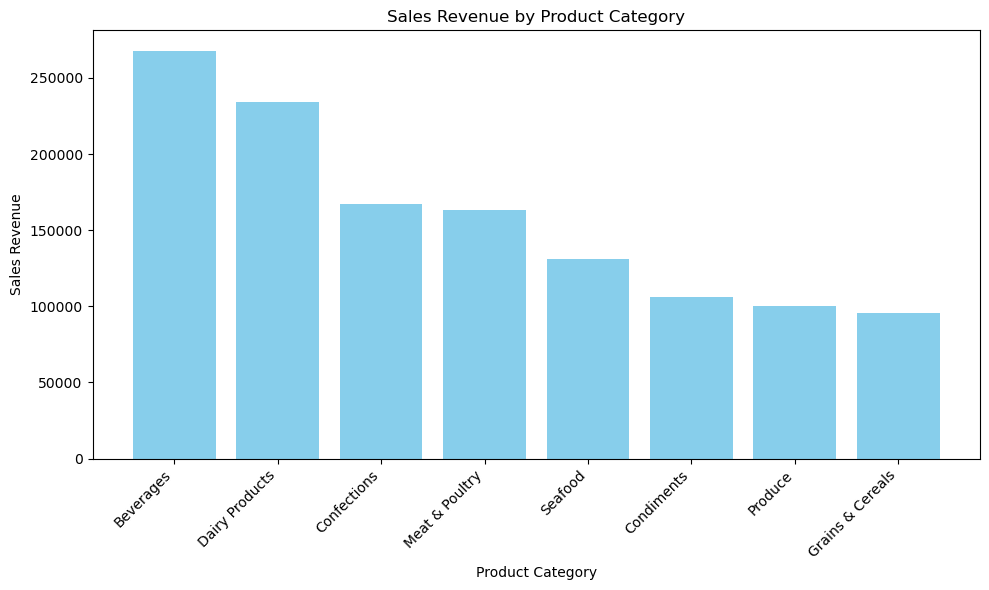

In [91]:
# Group by 'categoryName_cat' and sum 'SalesRevenue' for each category
category_revenue = final_df.groupby('categoryName_cat')['SalesRevenue'].sum().reset_index()

# Sort the categories by 'SalesRevenue' for better visualization (optional)
category_revenue_sorted = category_revenue.sort_values(by='SalesRevenue', ascending=False)

# Create a bar chart
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.bar(category_revenue_sorted['categoryName_cat'], category_revenue_sorted['SalesRevenue'], color='skyblue')

# Add titles and labels
plt.title('Sales Revenue by Product Category')
plt.xlabel('Product Category')
plt.ylabel('Sales Revenue')
plt.xticks(rotation=45, ha='right')  # Rotate category names for better readability

# Show the plot
plt.tight_layout()  # Adjust subplots to fit into figure area.
plt.show()

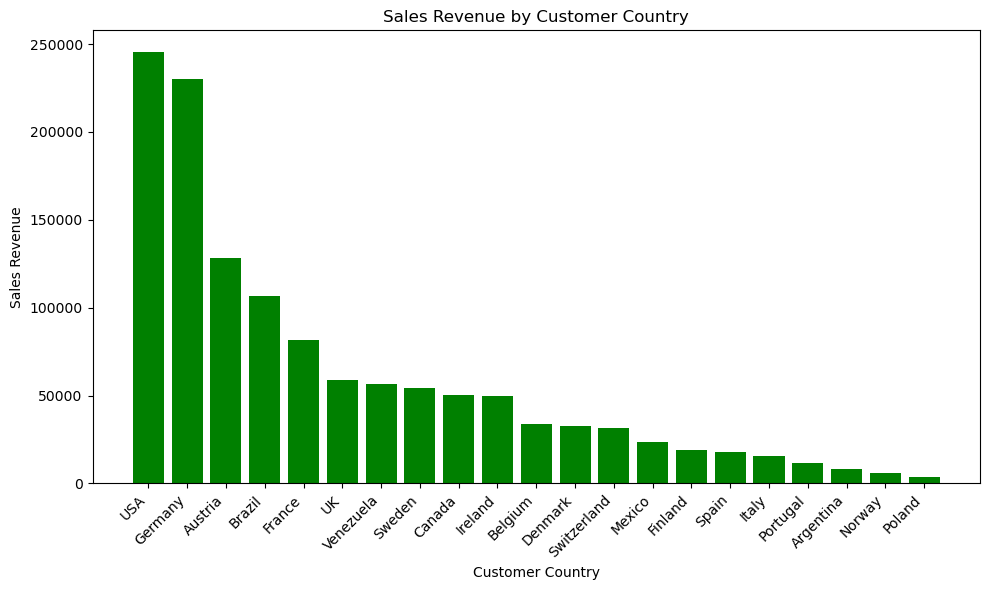

In [92]:
# Group by 'categoryName_cat' and sum 'SalesRevenue' for each category
country_cust_revenue = final_df.groupby('country_cust')['SalesRevenue'].sum().reset_index()

# Sort the categories by 'SalesRevenue' for better visualization (optional)
country_cust_revenue_sorted = country_cust_revenue.sort_values(by='SalesRevenue', ascending=False)

# Create a bar chart
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.bar(country_cust_revenue_sorted['country_cust'], country_cust_revenue_sorted['SalesRevenue'], color='green')

# Add titles and labels
plt.title('Sales Revenue by Customer Country')
plt.xlabel('Customer Country')
plt.ylabel('Sales Revenue')
plt.xticks(rotation=45, ha='right')  # Rotate category names for better readability

# Show the plot
plt.tight_layout()  # Adjust subplots to fit into figure area.
plt.show()

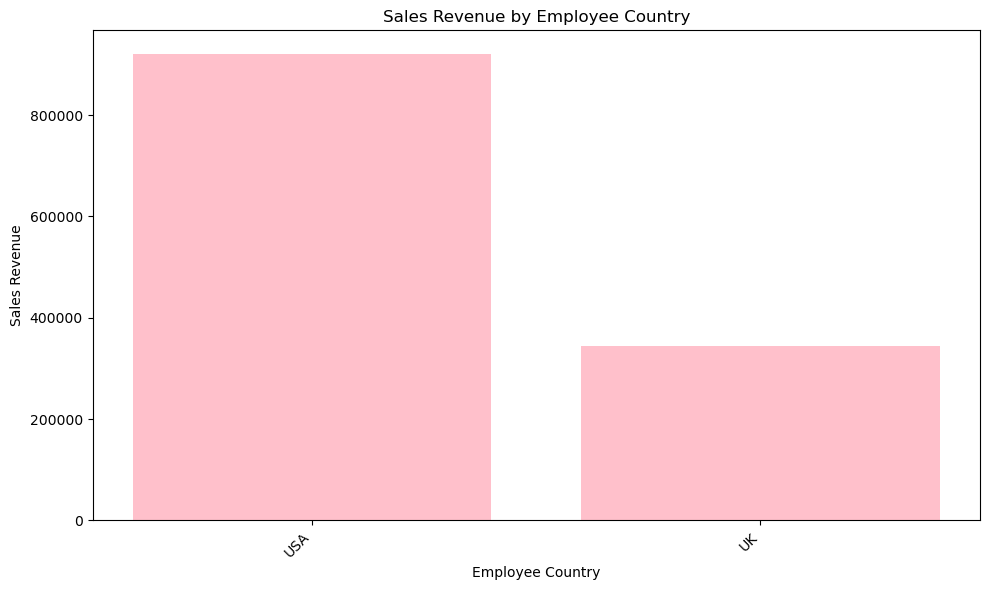

In [93]:
# Group by 'categoryName_cat' and sum 'SalesRevenue' for each category
country_emp_revenue = final_df.groupby('country_emp')['SalesRevenue'].sum().reset_index()

# Sort the categories by 'SalesRevenue' for better visualization (optional)
country_emp_revenue_sorted = country_emp_revenue.sort_values(by='SalesRevenue', ascending=False)

# Create a bar chart
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.bar(country_emp_revenue_sorted['country_emp'], country_emp_revenue_sorted['SalesRevenue'], color='pink')

# Add titles and labels
plt.title('Sales Revenue by Employee Country')
plt.xlabel('Employee Country')
plt.ylabel('Sales Revenue')
plt.xticks(rotation=45, ha='right')  # Rotate category names for better readability

# Show the plot
plt.tight_layout()  # Adjust subplots to fit into figure area.
plt.show()

In [94]:
#Dropping dummy columns with least salesrevenue to prevent multicollinearity

df_better_features.drop('categoryName_cat_Grains & Cereals', axis=1, inplace=True)
df_better_features.drop('country_cust_Poland', axis=1, inplace=True)
df_better_features.drop('country_emp_UK', axis=1, inplace=True)

In [95]:
#features and target
##We know that some ship dates have NaN and we will drop the corresponding rows from y
X = df_better_features.dropna() 
remaining_indexes = X.index

y = final_df['SalesRevenue'].loc[remaining_indexes]

#train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=33)

# Assuming X and y are already defined
# Add a constant to the model (intercept) since statsmodels doesn't have an intercept by default
X_with_constant = sm.add_constant(X)

# Create the model
model = sm.OLS(y, X_with_constant)

# Fit the model
results2 = model.fit()

# View the summary
print(results2.summary())


                            OLS Regression Results                            
Dep. Variable:           SalesRevenue   R-squared:                       0.573
Model:                            OLS   Adj. R-squared:                  0.566
Method:                 Least Squares   F-statistic:                     86.10
Date:                Tue, 26 Mar 2024   Prob (F-statistic):               0.00
Time:                        15:21:14   Log-Likelihood:                -16960.
No. Observations:                2155   AIC:                         3.399e+04
Df Residuals:                    2121   BIC:                         3.418e+04
Df Model:                          33                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

Our model still indicate multicollinearity or other numerical problems. Our numerical variables such as freight_o and unitPrice_prod could be highly correlated with each other. It's possible that are year, month, day variables could also have multicollinearity since they were derived from the same information.

We can try Variance Inflation Factor (VIF) analysis to identify which variables contribute the most to multicollinearity. Use correlation matrices or pair plots to identify and remove predictors. Regularization such as Ridge or Lasso.

### Dealing with multicollinearity

VIF, Correlation Matrices or Pair Plots, Regularization - Ridge or Lasso

#### VIF

In [96]:
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
print(vif_data)

                            feature         VIF
0                         freight_o    1.807107
1                    unitPrice_prod    2.006194
2                  orderDate_o_year  155.383201
3                 orderDate_o_month    3.917420
4                   orderDate_o_day    4.311652
5        categoryName_cat_Beverages    3.129716
6       categoryName_cat_Condiments    2.134776
7      categoryName_cat_Confections    2.738487
8   categoryName_cat_Dairy Products    2.944797
9   categoryName_cat_Meat & Poultry    1.953299
10         categoryName_cat_Produce    1.732050
11         categoryName_cat_Seafood    2.730011
12           country_cust_Argentina    3.153187
13             country_cust_Austria    8.980628
14             country_cust_Belgium    4.534604
15              country_cust_Brazil   13.758537
16              country_cust_Canada    5.724139
17             country_cust_Denmark    3.895796
18             country_cust_Finland    4.391961
19              country_cust_France   12

In [97]:
# Assuming 'final_df' is your DataFrame
correlation_matrix = X.corr()

# Display the correlation values for 'orderDate_o_year'
print(correlation_matrix['orderDate_o_year'].sort_values(ascending=False))

orderDate_o_year                   1.000000
country_cust_Argentina             0.092938
country_cust_Belgium               0.073130
freight_o                          0.044116
categoryName_cat_Beverages         0.031193
country_cust_USA                   0.030964
country_cust_Venezuela             0.027187
country_cust_Italy                 0.025510
country_cust_Sweden                0.022764
categoryName_cat_Seafood           0.022444
country_cust_Norway                0.022191
country_cust_Spain                 0.016242
categoryName_cat_Condiments        0.007351
categoryName_cat_Confections       0.001232
country_cust_Switzerland           0.000427
country_cust_Canada                0.000168
categoryName_cat_Produce          -0.002858
country_cust_Brazil               -0.004401
country_cust_UK                   -0.005238
unitPrice_prod                    -0.005936
country_cust_France               -0.008104
country_emp_USA                   -0.008445
country_cust_Finland            

We already know that we don't have a lot of years due to the small size of our dataset. Our negative correlation suggests that as the years go by, the number of orders made per month are shifting.

Let's plot the number of orders per month per year to see how they are shifting.

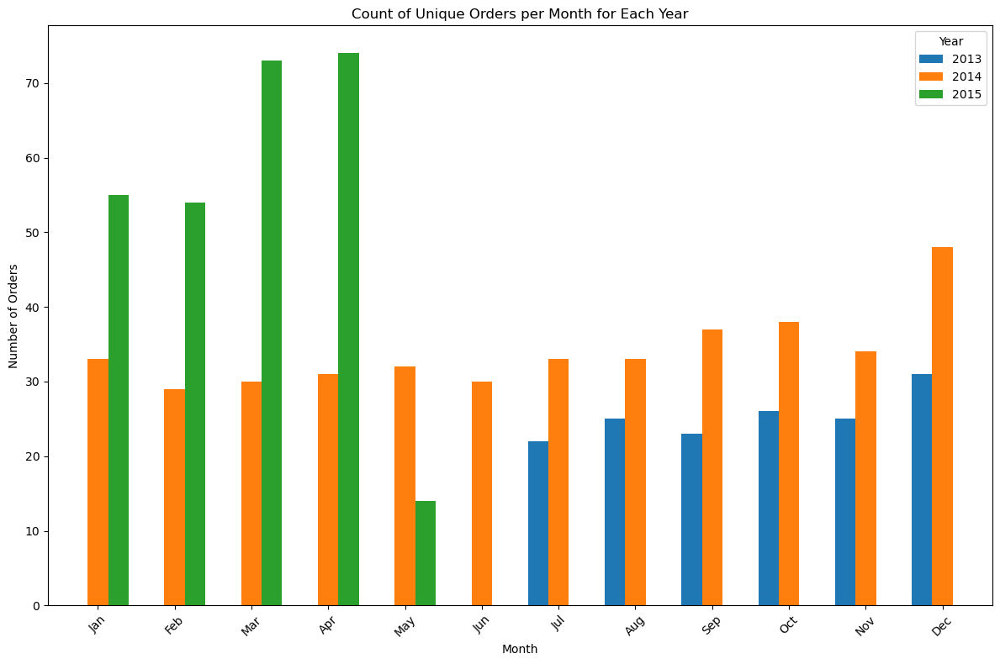

In [98]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'final_df' is your DataFrame and it contains 'orderDate_o_year', 'orderDate_o_month', and 'orderID'

# Group by year and month, then count the distinct 'orderID' to get the number of orders
df_counts = final_df.groupby(['orderDate_o_year', 'orderDate_o_month'])['orderID'].nunique().reset_index(name='orderCount')

# Pivot the data: months as rows, years as columns, and order counts as values
pivot_df = df_counts.pivot(index='orderDate_o_month', columns='orderDate_o_year', values='orderCount')

# Plot the pivot table data
pivot_df.plot(kind='bar', figsize=(12, 8), width=0.8)

# Adding labels and title
plt.xlabel('Month')
plt.ylabel('Number of Orders')
plt.title('Count of Unique Orders per Month for Each Year')
plt.xticks(ticks=range(0, 12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], rotation=45)
plt.legend(title='Year')

# Show plot
plt.tight_layout()
plt.show()


As observed in the graph, there appears to be a trend where the number of orders in the first half of each year is higher compared to the second half across the three years. This trend is consistent with the negative correlation of -0.67 between year and month from our correlation matrix. This suggests that as we move to later years, the distribution of orders shifts towards the earlier months of the year.

This is mostly due to the fact that we do not have two full years of data. Let's take year out of our model and see how it performs.

In [99]:
df_better_features.drop('orderDate_o_year', axis=1, inplace=True)
#features and target
##We know that some ship dates have NaN and we will drop the corresponding rows from y
X = df_better_features.dropna() 
remaining_indexes = X.index

y = final_df['SalesRevenue'].loc[remaining_indexes]

#train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=33)

# Assuming X and y are already defined
# Add a constant to the model (intercept) since statsmodels doesn't have an intercept by default
X_with_constant = sm.add_constant(X)

# Create the model
model = sm.OLS(y, X_with_constant)

# Fit the model
results3 = model.fit()

# View the summary
print(results3.summary())

                            OLS Regression Results                            
Dep. Variable:           SalesRevenue   R-squared:                       0.572
Model:                            OLS   Adj. R-squared:                  0.565
Method:                 Least Squares   F-statistic:                     88.57
Date:                Tue, 26 Mar 2024   Prob (F-statistic):               0.00
Time:                        15:21:15   Log-Likelihood:                -16962.
No. Observations:                2155   AIC:                         3.399e+04
Df Residuals:                    2122   BIC:                         3.418e+04
Df Model:                          32                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

Looks like we still have strong multicollinearity or other numerical problems. Let's check with VIF again.

In [100]:
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
print(vif_data)

                            feature       VIF
0                         freight_o  1.806896
1                    unitPrice_prod  2.004443
2                 orderDate_o_month  3.841332
3                   orderDate_o_day  4.267289
4        categoryName_cat_Beverages  2.918554
5       categoryName_cat_Condiments  2.032638
6      categoryName_cat_Confections  2.598823
7   categoryName_cat_Dairy Products  2.790659
8   categoryName_cat_Meat & Poultry  1.887704
9          categoryName_cat_Produce  1.663414
10         categoryName_cat_Seafood  2.600101
11           country_cust_Argentina  1.280567
12             country_cust_Austria  2.100200
13             country_cust_Belgium  1.343021
14              country_cust_Brazil  2.635086
15              country_cust_Canada  1.540791
16             country_cust_Denmark  1.428961
17             country_cust_Finland  1.427575
18              country_cust_France  2.350824
19             country_cust_Germany  3.733954
20             country_cust_Irelan

A general rule of VIF is that greater 5 or 10 indicates high multicollinearity. Our scores are all below those thresholds but multicollinearity can still manifest through linear combinations. In our case, I do not believe that we have any linear combinations.

## Checking multicollinearity or numerical problems

1. Linear Combinations: Are any variables linear combinations of others? Can they be computed by combining others?
2. Scale and Center Data: Standardize continuous variables (subtract mean and dividing by standard deviation), important if scales of variables are different
3. Investigate interaction or polynomial terms
4. Increase Sample Size
5. Regularization Methods: Ridge or Lasso
6. Remove Non-Informative Variables
7. Use Partial Least Squares Regression (PLSR) or Principal Component Regression (PCR)
8. Re-evaluate model: multicollinearity might not be a problem for prediction accuracy but can affect coefficients
9. Consult Domain Knowledge

### Scale and Center Data

We will standardize our continuous variables by subtracting the mean and dividing the standard deviation for each continuous variable. We will standardize freight and unitPrice but not the dates since they are typically treated as categoricals as they represent distinct periods rather than continuous numerical outputs.

One thing to note is that standardization changes the interpretation of the coefficients in our linear regression model. Before standardizing, the coefficients represent the change in the dependent variable for a one-unit change in the continuous predictor variable. For categorical dummy columns, the coefficient tells us the expected (average) difference in the dependent variable compared to being in the dropped dummy column.

After standardization, the coefficients represent the change in the dependent variable for a standard deviation change in the predictor variable. Since we're not doing anything to the categoricals, they will be interpreted the same way.

In [101]:
##We know that some ship dates have NaN and we will drop the corresponding rows from y
X = df_better_features.dropna() 
remaining_indexes = X.index

y = final_df['SalesRevenue'].loc[remaining_indexes]

#Standardizing
# Identify continuous variables
continuous_vars = ['freight_o', 'unitPrice_prod']

# Initialize the StandardScaler
scaler = StandardScaler()

# Fit the scaler to the continuous variables and transform the data
X[continuous_vars] = scaler.fit_transform(X[continuous_vars])

#train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=33)

# Assuming X and y are already defined
# Add a constant to the model (intercept) since statsmodels doesn't have an intercept by default
X_with_constant = sm.add_constant(X)

# Create the model
model = sm.OLS(y, X_with_constant)

# Fit the model
results4 = model.fit()

# View the summary
print(results4.summary())

                            OLS Regression Results                            
Dep. Variable:           SalesRevenue   R-squared:                       0.572
Model:                            OLS   Adj. R-squared:                  0.565
Method:                 Least Squares   F-statistic:                     88.57
Date:                Tue, 26 Mar 2024   Prob (F-statistic):               0.00
Time:                        15:21:15   Log-Likelihood:                -16962.
No. Observations:                2155   AIC:                         3.399e+04
Df Residuals:                    2122   BIC:                         3.418e+04
Df Model:                          32                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

Even though our month and day aren't at the treshhold for VIF, let's remove them and see what happens.

In [102]:
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
print(vif_data)

                            feature       VIF
0                         freight_o  1.184858
1                    unitPrice_prod  1.124689
2                 orderDate_o_month  3.843850
3                   orderDate_o_day  4.265747
4        categoryName_cat_Beverages  2.910569
5       categoryName_cat_Condiments  2.032965
6      categoryName_cat_Confections  2.597307
7   categoryName_cat_Dairy Products  2.785472
8   categoryName_cat_Meat & Poultry  1.880387
9          categoryName_cat_Produce  1.659102
10         categoryName_cat_Seafood  2.602384
11           country_cust_Argentina  1.271730
12             country_cust_Austria  1.992410
13             country_cust_Belgium  1.330818
14              country_cust_Brazil  2.579432
15              country_cust_Canada  1.516311
16             country_cust_Denmark  1.411197
17             country_cust_Finland  1.422133
18              country_cust_France  2.303262
19             country_cust_Germany  3.598301
20             country_cust_Irelan

In [103]:
df_better_features.drop('orderDate_o_month', axis=1, inplace=True)
df_better_features.drop('orderDate_o_day', axis=1, inplace=True)
df_better_features.drop('unitPrice_prod', axis=1, inplace=True)

In [104]:
##We know that some ship dates have NaN and we will drop the corresponding rows from y
X = df_better_features.dropna() 
remaining_indexes = X.index

y = final_df['SalesRevenue'].loc[remaining_indexes]

#Standardizing
# Identify continuous variables
continuous_vars = ['freight_o']

# Initialize the StandardScaler
scaler = StandardScaler()

# Fit the scaler to the continuous variables and transform the data
X[continuous_vars] = scaler.fit_transform(X[continuous_vars])

#train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=33)

# Assuming X and y are already defined
# Add a constant to the model (intercept) since statsmodels doesn't have an intercept by default
X_with_constant = sm.add_constant(X)

# Create the model
model = sm.OLS(y, X_with_constant)

# Fit the model
results5 = model.fit()

# View the summary
print(results5.summary())

                            OLS Regression Results                            
Dep. Variable:           SalesRevenue   R-squared:                       0.191
Model:                            OLS   Adj. R-squared:                  0.180
Method:                 Least Squares   F-statistic:                     17.33
Date:                Tue, 26 Mar 2024   Prob (F-statistic):           7.60e-78
Time:                        15:21:15   Log-Likelihood:                -17647.
No. Observations:                2155   AIC:                         3.535e+04
Df Residuals:                    2125   BIC:                         3.553e+04
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

In [105]:
# Assuming 'scaler' is your StandardScaler instance and 'freight_o' was included in the scaling
original_std_dev_freight_o = scaler.scale_[np.where(scaler.feature_names_in_ == 'freight_o')[0][0]]

print("Original standard deviation of freight_o:", original_std_dev_freight_o)


Original standard deviation of freight_o: 132.98040726062297


It looks like our month and day variables were causing the multicollinearity or numerical problems. Looking at diagnostic measures and numbers, it still looks like our model is pretty bad despite fixing those problems. The model still violates a lot of the OLS assumptions. It's time to try more complex models.

## Trees and Random Forests

One of the advantages of trees and random forests is their ability to automatically select features most important for predicting the target variable. While these models can handle both numeric and categorical, scikit-learn requires all data to be numeric. All we need to do is give it all the variables and encode the categoricals.

In [106]:
# Define features and target variable
X_tree = final_df.drop('SalesRevenue', axis=1)  # Drop the target to isolate predictors
X_tree = X_tree.drop(['orderDate_o','requiredDate_o','shippedDate_o' #Trees can't handle time variables
                      ,'unitPrice_od','quantity_od','discount_od'], axis = 1) #direct derivation columns should be dropped

#ship dates are NaN, remove rows and update y to match # of rows
X_tree = X_tree.dropna()
remaining_indexes = X_tree.index
y = final_df['SalesRevenue'].loc[remaining_indexes]


# Split data into training and test sets
X_tree_train, X_tree_test, y_tree_train, y_tree_test = train_test_split(X_tree, y, test_size=0.2, random_state=42)

# Start by identifying all categorical columns in the DataFrame
initial_categorical_columns = X_tree.select_dtypes(include=['object']).columns.tolist()

# Add specific columns you've identified as categorical
specific_columns = ['employeeID', 'shipperID', 'productID', 'reportsTo_emp']

categorical_columns = initial_categorical_columns + specific_columns

# Create a column transformer to apply OneHotEncoding to categorical columns
## Tree-based models inherently handle multicollinearity, not necessary to drop 1 dummy col
preprocessor = ColumnTransformer(transformers=[
    ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_columns)],
    remainder='passthrough')

# Apply the transformation to your training and test data
X_tree_train_transformed = preprocessor.fit_transform(X_tree_train)
X_tree_test_transformed = preprocessor.transform(X_tree_test)

In [107]:
# Initialize and fit the Decision Tree model
tree_model = DecisionTreeRegressor(random_state=42)
tree_model.fit(X_tree_train_transformed, y_tree_train)

# Predict and evaluate
y_tree_pred_train = tree_model.predict(X_tree_train_transformed)
y_tree_pred_test = tree_model.predict(X_tree_test_transformed)

# Evaluate the model
from sklearn.metrics import mean_squared_error
print("Decision Tree Training MSE:", mean_squared_error(y_tree_train, y_tree_pred_train))
print("Decision Tree Test MSE:", mean_squared_error(y_tree_test, y_tree_pred_test))

Decision Tree Training MSE: 0.0
Decision Tree Test MSE: 2194549.6086294535


In [108]:
# Initialize and fit the Random Forest model
forest_model = RandomForestRegressor(n_estimators=100, random_state=42)
forest_model.fit(X_tree_train_transformed, y_tree_train)

# Predict and evaluate
y_forest_pred_train = forest_model.predict(X_tree_train_transformed)
y_forest_pred_test = forest_model.predict(X_tree_test_transformed)

# Evaluate the model
print("Random Forest Training MSE:", mean_squared_error(y_tree_train, y_forest_pred_train))
print("Random Forest Test MSE:", mean_squared_error(y_tree_test, y_forest_pred_test))

Random Forest Training MSE: 50183.42819086702
Random Forest Test MSE: 765452.701145029


Our trees and random forest MSE indicate overfitting (especially tree) which means that they're learning the training data too well and capturing noise and random fluctuations instead of the underlying raltionship which leads to high performance on training data but poor generalization to new, unseen data.

If the model has high MSE on both training and test data, the model shows poor learning even on training data and indicates underfitting.

Let's compare the tree and random forest MSEs with our previous OLS regression.

In [109]:
# Add a constant to X_test
X_test_with_constant = sm.add_constant(X_test)
# Make predictions
y_pred = results5.predict(X_test_with_constant)
# Calculate the MSE
mse = mean_squared_error(y_test, y_pred)
print(f"MSE for the OLS regression model: {mse}")

MSE for the OLS regression model: 552122.1432819394


It appears that our random forests did much better than our singular decision tree but they both still did worse than our OLS regression and tends to overfit. We can try to solve overfitting by pruning the decision trees, adjusting the parameters, enforcing constraints, cross-validation, features selection and dimensionality reduction, or stacking and boosting.

Let's view which features are the most important in predicting sales revenue according to our decision tree and random forest models.

In [110]:
#Feature Importances for Decision Tree Model
# Ensure your 'preprocessor' variable is your ColumnTransformer instance
feature_names = preprocessor.get_feature_names_out()

# Create a DataFrame to map feature importances to feature names
importances = tree_model.feature_importances_
feature_importances_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False).reset_index(drop=True)

print(feature_importances_df)


                                               Feature    Importance
0                  cat__productName_prod_Côte de Blaye  3.686920e-01
1                            remainder__unitPrice_prod  1.755413e-01
2                                 remainder__freight_o  1.089696e-01
3                         remainder__shippedDate_o_day  5.444577e-02
4        cat__productName_prod_Thüringer Rostbratwurst  2.980908e-02
5                        remainder__requiredDate_o_day  2.972424e-02
6                                  cat__city_cust_Cork  2.698406e-02
7                           remainder__orderDate_o_num  1.714073e-02
8                     remainder__shippedDate_o_weekday  1.694586e-02
9                               cat__reportsTo_emp_5.0  1.371854e-02
10                                 cat__city_cust_Graz  9.850270e-03
11                      remainder__requiredDate_o_year  8.687462e-03
12     cat__productName_prod_Queso Manchego La Pastora  7.979072e-03
13                          remain

In [111]:
#Feature Importances for Random Forest Model
# Ensure your 'preprocessor' variable is your ColumnTransformer instance
feature_names = preprocessor.get_feature_names_out()

# Create a DataFrame to map feature importances to feature names
importances = forest_model.feature_importances_
feature_importances_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False).reset_index(drop=True)

print(feature_importances_df)


                                               Feature    Importance
0                            remainder__unitPrice_prod  3.209243e-01
1                                 remainder__freight_o  1.610410e-01
2                  cat__productName_prod_Côte de Blaye  9.989713e-02
3                                    cat__productID_38  6.248328e-02
4         cat__quantityPerUnit_prod_12 - 75 cl bottles  5.750328e-02
5                         remainder__shippedDate_o_day  2.633205e-02
6                        remainder__requiredDate_o_day  1.660459e-02
7                           remainder__orderDate_o_day  1.652549e-02
8                       remainder__shippedDate_o_month  1.077530e-02
9                      remainder__requiredDate_o_month  1.055058e-02
10                        remainder__orderDate_o_month  9.183984e-03
11                       remainder__requiredDate_o_num  8.351817e-03
12                                  remainder__orderID  8.329295e-03
13                        remainde

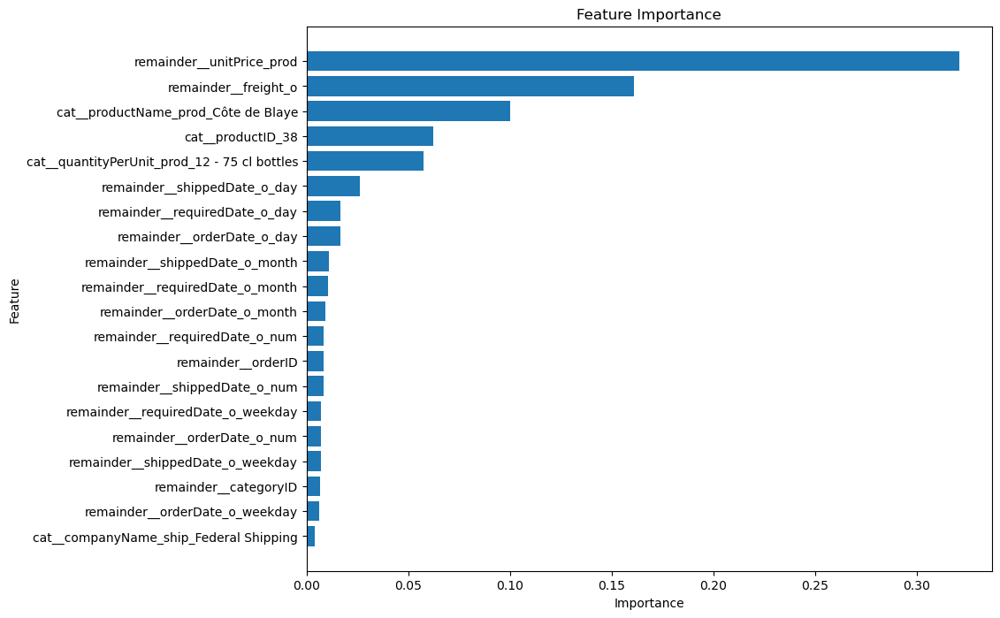

In [112]:
importances = forest_model.feature_importances_

# Create a feature importance plot
plt.figure(figsize=(10, 8))
plt.barh(feature_importances_df['Feature'][:20], feature_importances_df['Importance'][:20], align='center')  # Top 20 features
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.gca().invert_yaxis()  # Invert y-axis to have the most important feature on top
plt.show()


According to our random forest model's feature importance, Côte de Blaye accounts for approximately 32% of the decision making and is the most important in determining sales revenue. Next would be unitPrice_prod with 16% importance and freight has a 10% importance.

Overall, Côte de Blaye is a strong predictor of sales revenue, let's visualize this product against others.

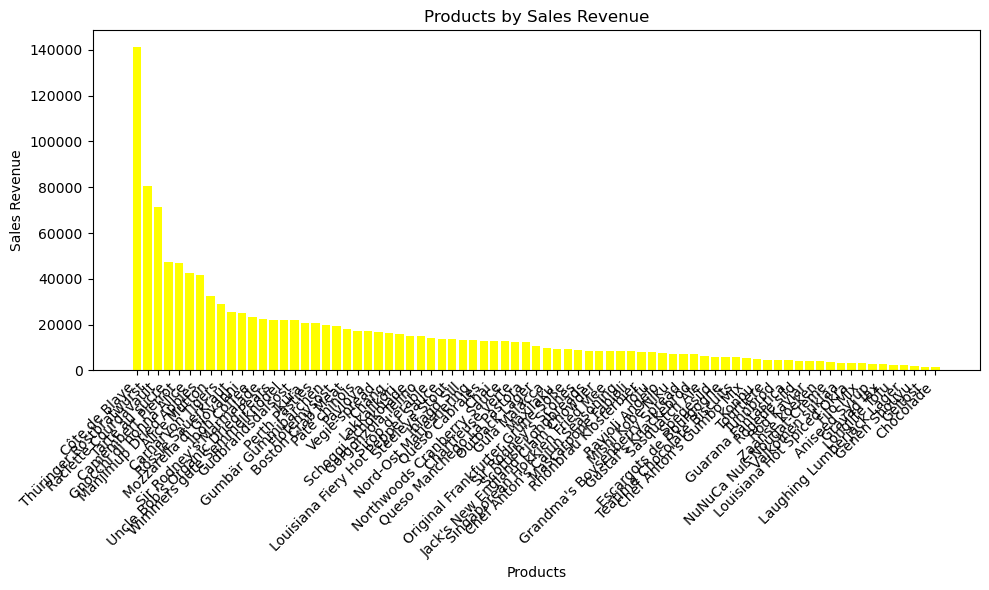

In [113]:
cote_revenue = final_df.groupby('productName_prod')['SalesRevenue'].sum().reset_index()

# Sort the categories by 'SalesRevenue' for better visualization (optional)
cote_revenue_sorted = cote_revenue.sort_values(by='SalesRevenue', ascending=False)

# Create a bar chart
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.bar(cote_revenue_sorted['productName_prod'], cote_revenue_sorted['SalesRevenue'], color='yellow')

# Add titles and labels
plt.title('Products by Sales Revenue')
plt.xlabel('Products')
plt.ylabel('Sales Revenue')
plt.xticks(rotation=45, ha='right')  # Rotate category names for better readability

# Show the plot
plt.tight_layout()  # Adjust subplots to fit into figure area.
plt.show()

As we can see in the first bar, Côte de Blaye generates the most sales revenue out of all the products.

Overall, I do not think that our dataset has enough information for us to create an adequate model for us to interpret the relationships between the variables. We're better off just creating visualizations to see the trends and patterns between different variables.

That will be all for modeling. Next up, we will be exploring these following sections:

1. Sales Revenue: Revenue Analysis of Product/Category, Influence of Product Popularity, Impact of Discounts, Product Association and Cross-Selling Opportunities

2. Customer Insights: Customer Segmentation, Customer Lifetime Value

3. Operational Insights: Order Fulfillment Analysis, Demand and Inventory Management, Regional Sales and Product Preferences

4. Employee Performance: Sales Performance by Employee, Impact of Supervision on Sales Performance

# Sales Revenue

## Revenue Analysis by Product and Category:

Prioritize based on revenue generation. Unfortunately, we do not have any inventory data nor the cost of products sourced so we can't make any analysis on that. We will begin by analyzing the sales revenue of products and categories.

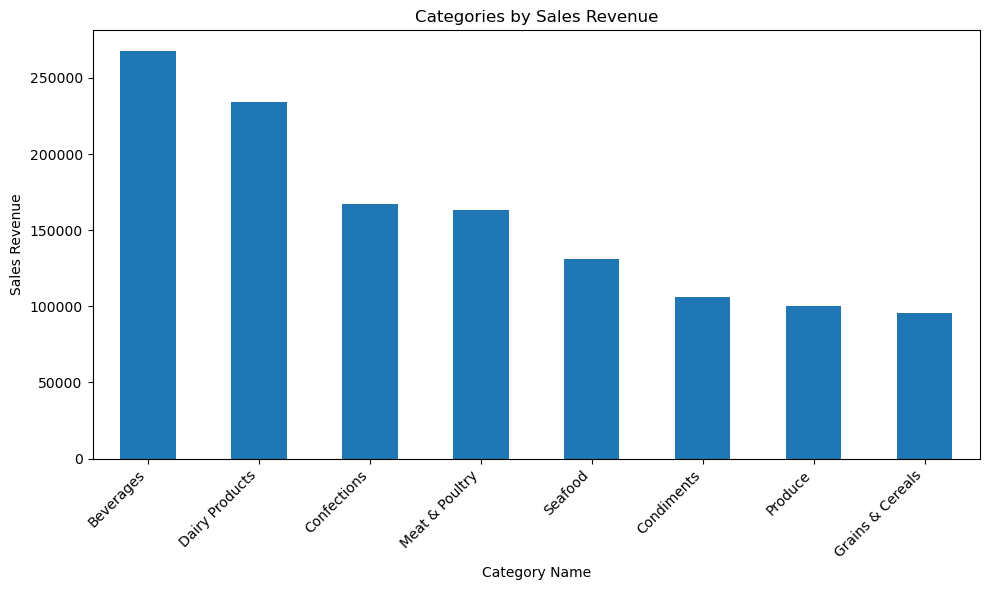

In [114]:
# Grouping by category and summing sales revenue, then sorting
rev_by_cat = final_df.groupby('categoryName_cat')['SalesRevenue'].sum().sort_values(ascending=False)

# Plotting the top 20% of categories by sales revenue
rev_by_cat.plot(kind='bar', figsize=(10, 6))  # Adjust figsize as needed
plt.title('Categories by Sales Revenue')
plt.xlabel('Category Name')
plt.ylabel('Sales Revenue')
plt.xticks(rotation=45, ha="right")  # Rotate the x-axis labels for better readability
plt.tight_layout()  # Adjust the layout to make room for the rotated x-axis labels
plt.show()

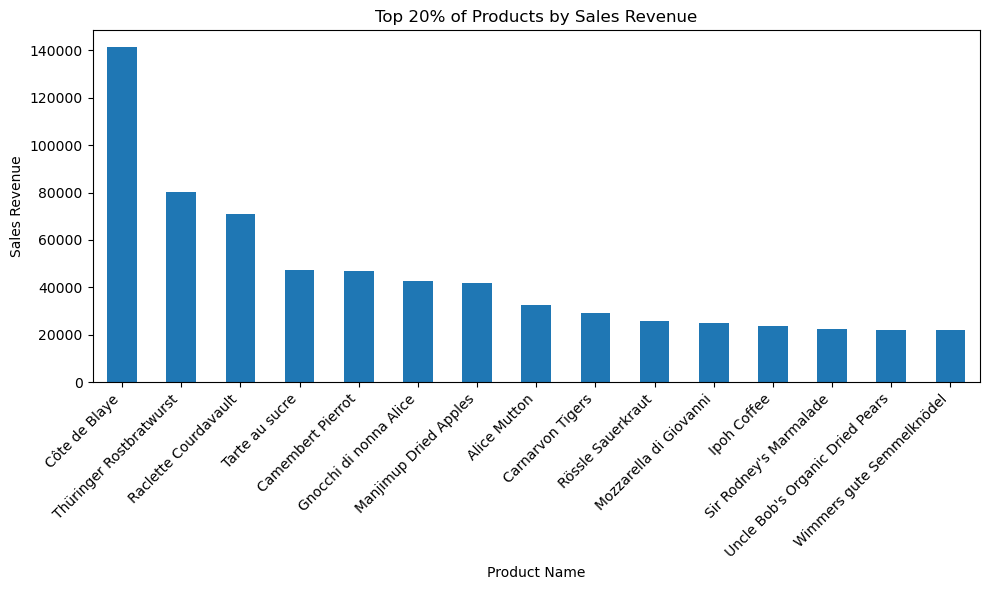

In [115]:
rev_by_prod = final_df.groupby('productName_prod')['SalesRevenue'].sum().sort_values(ascending = False)

tot_prod = len(rev_by_prod)

top_20_prod = int(tot_prod * 0.2)

top_20_perc_prod = rev_by_prod.head(top_20_prod)

# Plotting the top 20% of products by sales revenue
top_20_perc_prod.plot(kind='bar', figsize=(10, 6))  # Adjust figsize as needed
plt.title('Top 20% of Products by Sales Revenue')
plt.xlabel('Product Name')
plt.ylabel('Sales Revenue')
plt.xticks(rotation=45, ha="right")  # Rotate the x-axis labels for better readability
plt.tight_layout()  # Adjust the layout to make room for the rotated x-axis labels
plt.show()

As we can see here, Beverages and Dairy Products are the top 2 categories in terms of Sales Revenue. By plotting the top 20% products in terms of sales revenue, we can see that Côte de Blaye, a wine beverage, is the highest performer. Many of these products are cheeses which are dairy products.

It makes sense since the tradition and practice of drinking wine and eating cheese together dates back to hundreds of years ago.

## Influence of Product Popularity: 

Investigate the reasons behind the popularity of top-selling products. Include price, volume, customer demographics, regions, and seasonal trends. Utilize correlation analysis to identify these factors.

In our case, we want to examine why Côte de Blaye is so popular and why it generates the most revenue. We can look at the price and volume it is being sold at. We can see where these orders are from as well as when these orders are being made.

### Côte de Blaye Sales Over Time

In [116]:
cote_de_blaye = final_df[final_df['productName_prod'] == 'Côte de Blaye']

In [117]:
cote_de_blaye_monthly_quantity = cote_de_blaye.resample('M', on='orderDate_o')['quantity_od'].sum()

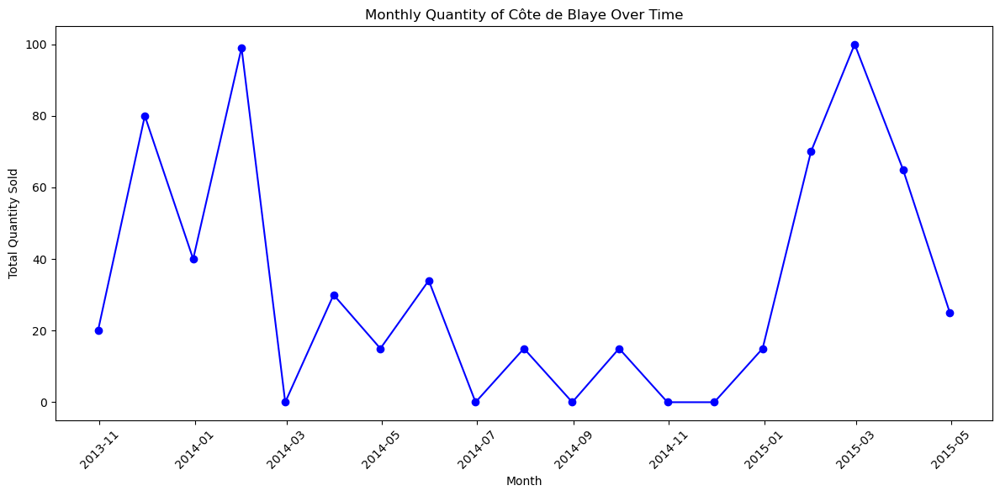

In [118]:
plt.figure(figsize=(12, 6))
plt.plot(cote_de_blaye_monthly_quantity.index, cote_de_blaye_monthly_quantity.values, marker='o', linestyle='-', color='b')
plt.title('Monthly Quantity of Côte de Blaye Over Time')
plt.xlabel('Month')
plt.ylabel('Total Quantity Sold')
plt.xticks(rotation=45)
plt.tight_layout()  # Adjust layout to make room for the x-axis labels
plt.show()

Interesting, it seems that Côte de Blaye is most often ordered by customers during the end and beginning months of the year. One reason for this could be that it is the holiday season which includes Christmas and New Year's as well as year-end gifts to clients.

### Côte de Blaye orders per country

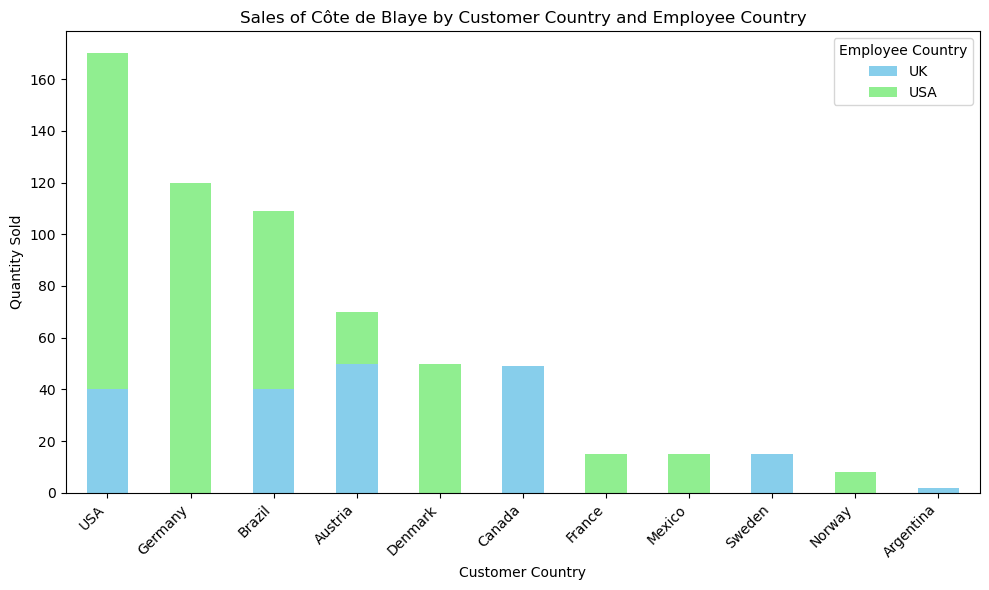

In [119]:
# Filter for 'Côte de Blaye' and then group by customer country and employee country
sales_split = final_df[final_df['productName_prod'] == 'Côte de Blaye'].groupby(['country_cust', 'country_emp'])['quantity_od'].sum().unstack(fill_value=0)

# Calculate the total sales for each country_cust by summing across the employee countries
sales_split['Total'] = sales_split.sum(axis=1)

# Sort the DataFrame based on the 'Total' column
sales_split_sorted = sales_split.sort_values(by='Total', ascending=False)

# Drop the 'Total' column as it's no longer needed for plotting
sales_split_sorted = sales_split_sorted.drop(columns='Total')

# Plotting
sales_split_sorted.plot(kind='bar', stacked=True, figsize=(10, 6), color=['skyblue', 'lightgreen'])
plt.title('Sales of Côte de Blaye by Customer Country and Employee Country')
plt.xlabel('Customer Country')
plt.ylabel('Quantity Sold')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Employee Country')
plt.tight_layout()
plt.show()


Unfortunately we don't have information of where the product is before it reaches the customer's location. We just know the location of the employee who handled the order. I'm not surprised to see USA and Germany with the highest sales as they have some of the highest GDPs in the world.

## Impact of Discounts on Sales: 

Perform a quantitative analysis to understand the relationship between discount levels and sales volume/revenue. Use regression analysis to quantify this relationship.

Does sales revenue increase when customers are given a bigger discount which drives them to buy more? How many customers are given discounts? For customers given discounts, do they buy more? How much are we losing/gaining due to these discounts?

Are discounts helping to drive sales volume, revenue, and profit? Can you quantify this gain/loss?

### Correlation between discount and quantity

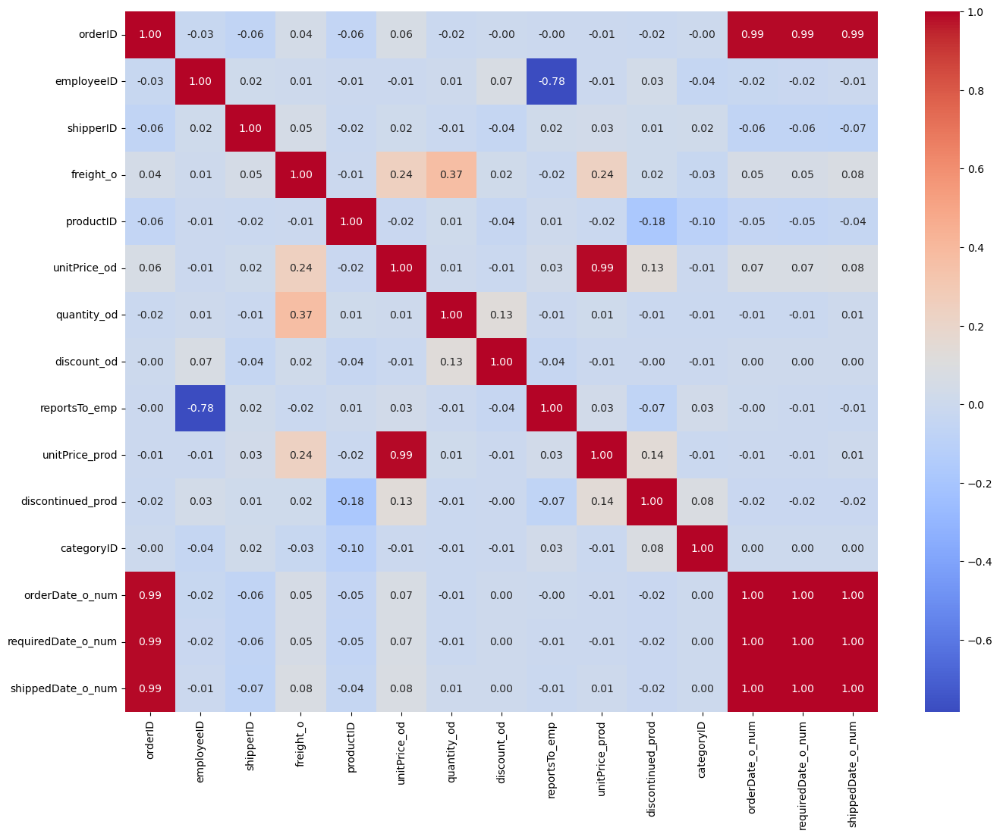

In [120]:
# Draw the heatmap for the new correlation matrix
plt.figure(figsize=(16, 12))
sns.heatmap(correlation_matrix_with_dates, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
plt.show()

If we review the previous correlation heat map that we have created previously, discount only has a 0.13 correlation with quantity which indicates a very weak positive linear relationship between the two. As discount increases, there is a small tendency for the quantity sold to increase.

### Discounts in Categories and Products

In [121]:
final_df['DiscountAmount'] = final_df['unitPrice_od'] * final_df['quantity_od'] * final_df['discount_od']

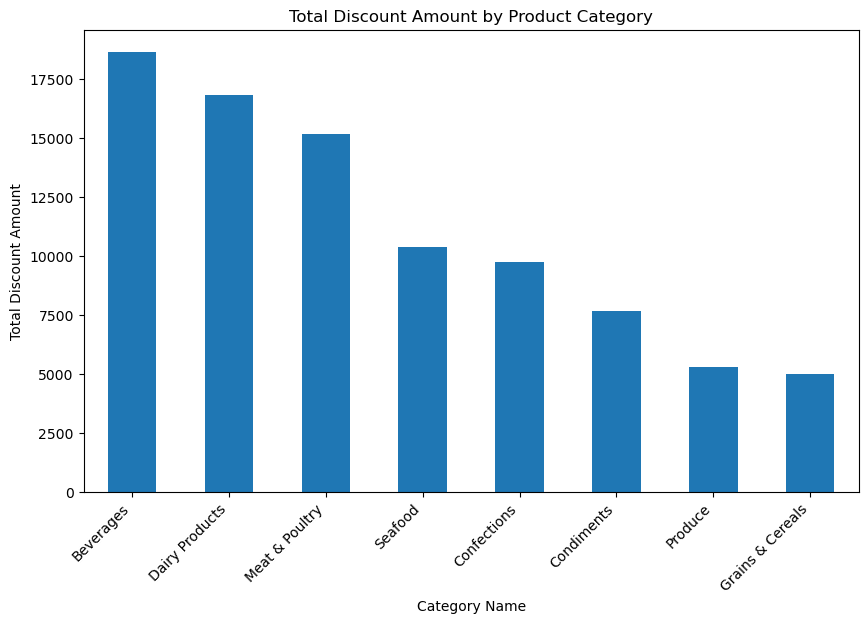

In [122]:
discount_by_category = final_df.groupby('categoryName_cat')['DiscountAmount'].sum()
discount_by_category_sorted = discount_by_category.sort_values(ascending=False)

discount_by_category_sorted.plot(kind='bar', figsize=(10, 6))
plt.title('Total Discount Amount by Product Category')
plt.xlabel('Category Name')
plt.ylabel('Total Discount Amount')
plt.xticks(rotation=45, ha='right')
plt.show()

Not surprising that it looks very similar to our Sales Revenue by Products since the more things sold in a certain category, the more discount amounts are in that category. Let's check the quantity and revenue between orders with and without discounts.

In [123]:
discounted = final_df[final_df['discount_od'] > 0]
non_discounted = final_df[final_df['discount_od'] == 0]

In [124]:
metrics = {
    'Count of Orders': (discounted['quantity_od'].count(), non_discounted['quantity_od'].count()),
    'Average Sales Volume': (discounted['quantity_od'].mean(), non_discounted['quantity_od'].mean()),
    'Average Revenue': (discounted['SalesRevenue'].mean(), non_discounted['SalesRevenue'].mean())
}
metrics

{'Count of Orders': (838, 1317),
 'Average Sales Volume': (27.10978520286396, 21.715261958997722),
 'Average Revenue': (614.671156921241, 570.0065375854215)}

It seems that on average, there is more volume when there is a discount as well as higher revenue. However, we are not told if the discount was present before or after the ordering and other factors such as automatic discounts based on product/quantity, customer relationships, and promotional periods could affect it as well.

Let's see if the difference between the sales revenue of the discount and non-discounted groups are statistically significant.

In [125]:
stat, p_value = ttest_ind(discounted['SalesRevenue'], non_discounted['SalesRevenue'])
stat, p_value

(1.0428923095063827, 0.2971152568895532)

This test performs an independent samples statistical t-test to compare the means of two independent groups to determine a statistical significance between them. In our case, it is comparing the average revenue between discounts and non-discounts.

The test statistic measures the distance between the group means and a higher value indicates a greater difference. In our case, 1.04 suggests a mild difference between the two groups which we saw in our metrics.

The p-value measures the probability of observing the test statistic as extreme as or more extreme than the observed value under the null hypothesis. In our case, our null hypothesis is that there is no difference between the average revenue between the two groups.

Our p-value of 0.29 is well above the common threshold of 0.05 and suggests that any observed difference could reasonably occur by random chance and we don't have enough evidence to conclude that discounts impact revenue significantly.

## Product Association and Cross-Selling Opportunities: 

Utilize market basket analysis or association rule mining to identify products frequently bought together. Develop cross-selling and promotional strategies based on these findings.

Each orderID represents one product order. However, there are duplicate orderIDs which represent the same customer ordering different products at the same time since they have the same customerID, employeeID, and dates. We can create our product basket by grouping on orderID which tells us all the products the customer ordered in one transaction.

### Market Basket Analysis

Create our basket of products per customer order. Use Apriori to find the most frequent items bought.

In [126]:
# Assuming 'orderID' is your order identifier and 'productName_prod' is the product name
baskets = final_df.groupby('orderID')['productName_prod'].apply(list).reset_index()

baskets.head()

,orderID,productName_prod
0,10248,"[Queso Cabrales, Mozzarella di Giovanni, Singa..."
1,10249,"[Tofu, Manjimup Dried Apples]"
2,10250,"[Manjimup Dried Apples, Louisiana Fiery Hot Pe..."
3,10251,"[Gustaf's Knackebröd, Ravioli Angelo, Louisian..."
4,10252,"[Camembert Pierrot, Geitost, Sir Rodney's Marm..."


In [127]:
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori, association_rules

# Transform the dataset into a format suitable for the Apriori algorithm
te = TransactionEncoder()
te_ary = te.fit(baskets['productName_prod']).transform(baskets['productName_prod'])
df = pd.DataFrame(te_ary, columns=te.columns_)

# Find frequent itemsets
frequent_itemsets = apriori(df, min_support=0.005, use_colnames=True)

# Generate association rules
rules = association_rules(frequent_itemsets, metric="lift", min_threshold=1)

# Filter rules based on some criteria, e.g., high lift and confidence
rules_filtered = rules[(rules['lift'] >= 1) & (rules['confidence'] >= 0.3)]


In [128]:
frequent_itemsets

,support,itemsets
0,0.044578,(Alice Mutton)
1,0.014458,(Aniseed Syrup)
2,0.049398,(Boston Crab Meat)
3,0.061446,(Camembert Pierrot)
4,0.032530,(Carnarvon Tigers)
5,0.045783,(Chai)
6,0.053012,(Chang)
7,0.036145,(Chartreuse verte)
8,0.024096,(Chef Anton's Cajun Seasoning)
9,0.012048,(Chef Anton's Gumbo Mix)


Frequent itemsets shows us individual items and some pairs of items that meet our minimum support threshold of 0.005 that means we're looking at items or pairs that appear in at least 0.5% of all transactions. In our case, Alice Mutton appears in 4.46% of all transactions. Let's check the associations found between our products.

In [129]:
rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(Alice Mutton),(Geitost),0.044578,0.038554,0.006024,0.135135,3.505068,0.004305,1.111672,0.748045
1,(Geitost),(Alice Mutton),0.038554,0.044578,0.006024,0.156250,3.505068,0.004305,1.132352,0.743358
2,(Flotemysost),(Camembert Pierrot),0.050602,0.061446,0.007229,0.142857,2.324930,0.004120,1.094980,0.600254
3,(Camembert Pierrot),(Flotemysost),0.061446,0.050602,0.007229,0.117647,2.324930,0.004120,1.075984,0.607189
4,(Pavlova),(Camembert Pierrot),0.051807,0.061446,0.007229,0.139535,2.270862,0.004046,1.090752,0.590216
5,(Camembert Pierrot),(Pavlova),0.061446,0.051807,0.007229,0.117647,2.270862,0.004046,1.074618,0.596277
6,(Chang),(Gorgonzola Telino),0.053012,0.061446,0.006024,0.113636,1.849376,0.002767,1.058882,0.484987
7,(Gorgonzola Telino),(Chang),0.061446,0.053012,0.006024,0.098039,1.849376,0.002767,1.049921,0.489345
8,(Pavlova),(Chang),0.051807,0.053012,0.006024,0.116279,2.193446,0.003278,1.071592,0.573825
9,(Chang),(Pavlova),0.053012,0.051807,0.006024,0.113636,2.193446,0.003278,1.069756,0.574555


This output shows us the associations found between products based on our criteria. Each row or rule is represented by an antecedent which leads to a consequent. For example, the first row says that customers who buy 'Alice Mutton' also tend to buy 'Geitost' with a lift of 3.505 which means the combination of these two products is over 3.5 times more likely than would be expected if they were statistically independent.

A lift of greater than 1 means that the rule is potentially useful and items are likely to be bought together than separately.

Confidence represents the conditional probability of buying the consequent given the antecedent. For example, the confidence of 0.135 of buying 'Geitost' given 'Alice Mutton' suggests that about 13.5% of 'Alice Mutton' buyers also buy 'Geitost'.

Support shows the proportion of transactions that contain both items and tells us how common these combinations are in our dataset.

In [130]:
rules_filtered

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
34,(Sirop d'érable),(Sir Rodney's Scones),0.028916,0.046988,0.009639,0.333333,7.094017,0.00828,1.429518,0.884615


Our rules_filtered filters out the rule for any that have lift greater than 1 and confidence greater than 30%. That is, we're looking for rules where there is an association between the antecedent and consequent products such that there is a higher likelihood of buying these two products together than independently and that 30% of people who buy the antecedent also buy the consequent product.

Our results indicate that Sirop d'érable and Sir Rodney's Scones with a lift of 7 suggests that the frequency of them appearing together is 7 times higher than their expected frequency under independence. Example) If Sirop appears in 2% of transactions and Sir Rodney appears in 3% of transactions, their independent expected frequency would be 2% * 3% = 0.06% of transactions. With a lift of 7, their co-occurence would be approximately 0.06% * 7 = 0.42% in all transactions.

Their confidence is 33% which means 33% of people who buy Sirop also buy Sir Rodney.

Note that a lift of exactly 1 suggests that there is no association between the purchase of the antecedent and consequent. They appear together in transactions as often as we would expect by chance.

A lift of less than 1 indicates that these items don't influence each other's sales and even a negative association such that the products are purchased together less frequently than one would expect based on their individual sale frequencies.

In conclusion, we can tweak the rules_filtered criteria to acquire combinations with high lift and confidence and pair them up for cross-selling opportunities as well as identify combinatinos with negative associations.

# Customer InSights

## Customer Segmentation:
Segment customers based on geographic location, order frequency, and average order value. Use clustering techniques (e.g., K-means or hierarchical clustering) to identify distinct customer segments.

### Selecting Relevant Features

Since we want geographic location, order frequency, and average order value for customers, we will grab customerID to aggregate orders for each customer, country_cust to segment geographically, orderID to calculate order frequency per customer, and SalesRevenue to compute the average order value per customer.

In [131]:
agg_data = final_df.groupby('customerID').agg( #groups by customerID and aggregates the following
    OrderFrequency=('orderID', 'nunique'), #take number of unique orderIDs
    AverageOrderValue=('SalesRevenue', 'mean'), #take mean of SalesRevenue
    Country=('country_cust', 'first')  # Assuming one country per customer
).reset_index() #converts the groupby object back into a regular DataFrame so that customerID is included as col and not index

agg_data

,customerID,OrderFrequency,AverageOrderValue,Country
0,ALFKI,6,356.083333,Germany
1,ANATR,4,140.295000,Mexico
2,ANTON,7,413.175147,Mexico
3,AROUT,13,446.355000,UK
4,BERGS,18,479.376490,Sweden
5,BLAUS,7,231.414286,Germany
6,BLONP,11,712.849231,France
7,BOLID,3,705.475000,Spain
8,BONAP,17,499.164830,France
9,BOTTM,14,594.331429,Canada


### Data Preparation for Clustering: OneHotEncoder and Normalization

Use OneHotEncoder to one-hot encode the country names into binary columns since they need to be represented numerically for clustering. 

Clustering algorithms like K-means are sensitive to the scale of the data therefore we need to normalize the data so each feature contributes equally to the distance calculations. 

Use StandardScaler aka Z-score normalization in order to normalize our features.

In [132]:
encoder = OneHotEncoder(sparse_output = False) #create array output to convert to pd later
country_encoded = encoder.fit_transform(agg_data[['Country']]) #use encoder to learn categories in 'Country' and transform, ea unique cat now becomes a col with 0s/1s
country_df = pd.DataFrame(country_encoded, columns=encoder.get_feature_names_out()) #convert encoded to pd, set col names

data_for_clustering = agg_data.drop(columns=['Country', 'customerID']) #drop country since encoded, drop customerID since unique identifier; not needed for clustering
data_for_clustering = pd.concat([data_for_clustering, country_df], axis=1) #append dataframes

scaler = StandardScaler() #create instance used for normalize/standardize
data_scaled = scaler.fit_transform(data_for_clustering) #fitted to df, learns mean & sd of ea feat, transforms daata

data_for_clustering

,OrderFrequency,AverageOrderValue,Country_Argentina,Country_Austria,Country_Belgium,Country_Brazil,Country_Canada,Country_Denmark,Country_Finland,Country_France,...,Country_Mexico,Country_Norway,Country_Poland,Country_Portugal,Country_Spain,Country_Sweden,Country_Switzerland,Country_UK,Country_USA,Country_Venezuela
0,6,356.083333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,4,140.295000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,7,413.175147,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,13,446.355000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,18,479.376490,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
5,7,231.414286,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,11,712.849231,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,3,705.475000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
8,17,499.164830,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,14,594.331429,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Perform Clustering

Before performing our clustering, we need to find the optimal amount of clusters we should group by dataset into. To do this, we will find the inertia of the KMeans of different clusters. 

Inertia measures how well a dataset was clustered by K-Means and calculates the distance between each data point and its centroid, squaring this distance, and summing these squares across one cluster.

A good model is one with low interia AND low number of clusters which is often a tradeoff since inertia decreases as the number of clusters increase. To find the optimal amount of clusters, we use the elbow method to find the point where inertia begins to slow.

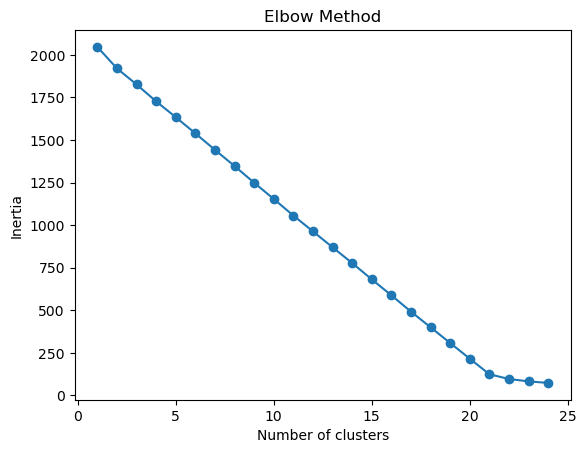

In [133]:
inertia = []
for k in range(1, 25):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init = 50).fit(data_scaled) 
    #repeat func with k # of clusters, set random_state to reproduce results, n_init = # of initializations with diff random seed; diff initial centroids of clusters
    inertia.append(kmeans.inertia_)

plt.plot(range(1, 25), inertia, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

As we can see, we start to get diminishing returns of decreasing inertia around 20 clusters. After 21 clusters, inertia does not seem to decrease that much. Let's create our kmeans using 21 clusters and label each row in our agg_data with their cluster number.

In [134]:
kmeans = KMeans(n_clusters = 21, random_state = 42, n_init = 50)

kmeans.fit(data_scaled)

cluster_labels = kmeans.labels_

agg_data['Cluster'] = cluster_labels

agg_data

,customerID,OrderFrequency,AverageOrderValue,Country,Cluster
0,ALFKI,6,356.083333,Germany,6
1,ANATR,4,140.295000,Mexico,2
2,ANTON,7,413.175147,Mexico,2
3,AROUT,13,446.355000,UK,5
4,BERGS,18,479.376490,Sweden,14
5,BLAUS,7,231.414286,Germany,6
6,BLONP,11,712.849231,France,3
7,BOLID,3,705.475000,Spain,8
8,BONAP,17,499.164830,France,3
9,BOTTM,14,594.331429,Canada,7


Now that each row has their cluster, we can calculate the means of the numeric columns to see the average characteristics of our customers within that cluster.

In [135]:
# Select only the numeric columns for calculating the mean
numeric_cols = agg_data.select_dtypes(include=[np.number]).columns

# Now calculate the mean only on these numeric columns
cluster_profile = agg_data.groupby('Cluster')[numeric_cols].mean()

cluster_profile

,OrderFrequency,AverageOrderValue,Cluster
Cluster,,,
0,11.500000,455.436927,0.0
1,9.384615,490.614392,1.0
2,5.600000,255.943438,2.0
3,7.700000,405.062709,3.0
4,9.222222,477.170618,4.0
5,8.000000,381.532032,5.0
6,11.090909,517.020853,6.0
7,10.000000,520.633289,7.0
8,5.750000,338.778386,8.0


In [136]:
agg_data[agg_data['Cluster'] == 13]

,customerID,OrderFrequency,AverageOrderValue,Country,Cluster
19,ERNSH,30,1028.186064,Austria,13
56,PICCO,10,1005.602609,Austria,13


Looking at cluster 13 with the highest OrderFrequency and AverageOrderValue, we can possibly designate these customers as VIP and assign them a personal account manager or special support line. By taking a look at these clusters, we can tailor our marketing towards them, adjust customer service, and manage our product and inventory.

## Customer Lifetime Value (CLV): 
Calculate CLV to identify the most valuable customers. Analyze their purchasing patterns to inform targeted marketing strategies. CLV helps in identifiying the most protiftable customers and how valuable different customers are to your business over time. CLV allows more more targeted and efficient marketing strategies.

We will calculate the Average Order Value (AOV), Purchase Frequency (PF), and Customer Lifespan (CL) for each customer by using their data over time.

First, we calculate the average revenue per order for each customer by grouping by customer and taking the average of their sales revenue. Then, we will store the total number of orders by counting unique orders, total customers by counting unique customer IDs, and calculating the overall purchase frequency by dividing total orders with total customers.

In [137]:
# Calculate AOV for each customer
customer_aov = final_df.groupby('customerID')['SalesRevenue'].mean().reset_index(name='AOV')

# Calculate overall Purchase Frequency
total_orders = final_df['orderID'].nunique()
total_customers = final_df['customerID'].nunique()
overall_pf = total_orders / total_customers


Second, we will calculate the customer lifespan by grouping each customer and getting their min and max order dates. Then we calculate the difference between the dates and dividing by a year to get the number of years they were active.

In [138]:
# Calculate the first and last order dates for each customer
customer_dates = final_df.groupby('customerID')['orderDate_o'].agg([min, max])

# Calculate the difference in days, then convert to years; add buffer if necessary
customer_dates['CL'] = (customer_dates['max'] - customer_dates['min']).dt.days / 365.25


Finally, we group our customer_aov and customer_dates dataset to get the full picture with all of our features.

In [139]:
# Merge AOV and CL dataframes
customer_clv = customer_aov.merge(customer_dates['CL'], left_on='customerID', right_index=True)

# Add a column for Purchase Frequency, which is overall PF (individual PF isn't meaningful per customer)
customer_clv['PF'] = overall_pf

# Calculate CLV for each customer (simple formula without discount rate)
customer_clv['CLV'] = customer_clv['AOV'] * customer_clv['PF'] * customer_clv['CL']


In [140]:
customer_clv.sort_values(by = 'CLV', ascending = False)

,customerID,AOV,CL,PF,CLV
60,QUICK,1282.294244,1.689254,9.325843,20200.899965
19,ERNSH,1028.186064,1.798768,9.325843,17247.849092
32,HANAR,1026.292813,1.801506,9.325843,17242.293846
70,SIMOB,1121.139833,1.516769,9.325843,15858.693620
35,HUNGO,908.725545,1.648186,9.325843,13967.770452
56,PICCO,1005.602609,1.451061,9.325843,13608.182407
68,SAVEA,899.671983,1.560575,9.325843,13093.534982
62,RATTC,719.687331,1.787817,9.325843,11999.272055
37,KOENE,792.522667,1.522245,9.325843,11250.824361
86,WHITC,684.090125,1.749487,9.325843,11161.229559


In [141]:
customer_clv.describe()

,AOV,CL,PF,CLV
count,89.000000,89.000000,8.900000e+01,89.000000
mean,457.914849,1.342808,9.325843e+00,6118.999638
std,255.076404,0.416123,1.071853e-14,4172.245878
min,50.400000,0.000000,9.325843e+00,0.000000
25%,277.700417,1.169062,9.325843e+00,2537.812572
50%,422.937905,1.451061,9.325843e+00,5564.924411
75%,594.331429,1.648186,9.325843e+00,8410.189694
max,1282.294244,1.815195,9.325843e+00,20200.899965


QUICK has the highest AOV and CLV which makes them one of our most valuable customers. They have the highest average revenue generated per order and customer life time value (most active). Let's analyze their purchases for insights.

In [142]:
final_df[final_df['customerID'] == 'QUICK']['categoryName_cat'].value_counts()

categoryName_cat
Beverages           19
Dairy Products      14
Confections         13
Seafood             12
Condiments          11
Grains & Cereals     7
Meat & Poultry       5
Produce              5
Name: count, dtype: int64

QUICK buys products from every category but mostly from Beverages and Dairy Products. From what we have seen so far, I assume that these are wine and cheeses. Let's take a quick look at their products.

In [143]:
quick_purchases = final_df[final_df['customerID'] == 'QUICK']
top_products = quick_purchases.groupby('productName_prod')['SalesRevenue'].sum().sort_values(ascending=False).reset_index(name='TotalRevenue')
top_products.head(5)

,productName_prod,TotalRevenue
0,Côte de Blaye,22924.5
1,Camembert Pierrot,6800.0
2,Schoggi Schokolade,5268.0
3,Thüringer Rostbratwurst,4951.6
4,Uncle Bob's Organic Dried Pears,4050.0


As we expected, their top purchase is wine followed by cheese. Let's plot their monthly sales revenue to see if there are any seasonal big purchases.

<Axes: xlabel='orderDate_o'>

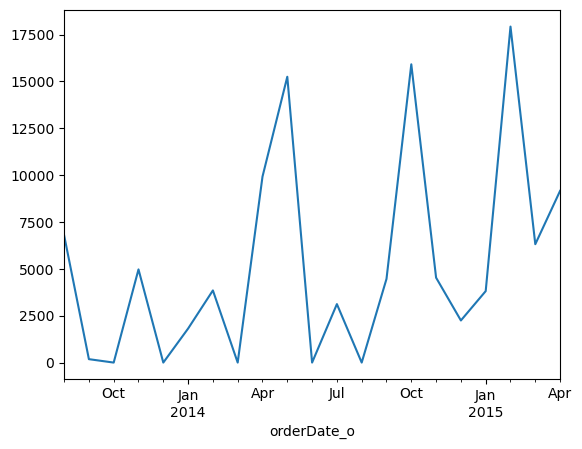

In [144]:
monthly_sales = quick_purchases.set_index('orderDate_o').resample('M')['SalesRevenue'].sum()
monthly_sales.plot()

Based on this chart, it seems like they have a big purchase every 4-5 months starting from May 2014.

# Operational Insights

## Order Fulfillment Analysis: 
Analyze the time from order to shipment and identify any delays. Compare the performance of shipping companies to identify the most reliable partners.

Let's first create a new df with the features that we might need to analyze shipment information.

In [145]:
shipping = final_df[['orderID','customerID','employeeID','orderDate_o','requiredDate_o','shippedDate_o','companyName_ship','freight_o']] #select relevant shipment cols
shipping = shipping.dropna() #drop missing shippeddate rows
shipping

,orderID,customerID,employeeID,orderDate_o,requiredDate_o,shippedDate_o,companyName_ship,freight_o
0,10248,VINET,5,2013-07-04,2013-08-01,2013-07-16,Federal Shipping,32.38
1,10944,BOTTM,6,2015-03-12,2015-03-26,2015-03-13,Federal Shipping,52.92
2,10570,MEREP,3,2014-06-17,2014-07-15,2014-06-19,Federal Shipping,188.99
3,10926,ANATR,4,2015-03-04,2015-04-01,2015-03-11,Federal Shipping,39.92
4,10842,TORTU,1,2015-01-20,2015-02-17,2015-01-29,Federal Shipping,54.42
5,10542,KOENE,1,2014-05-20,2014-06-17,2014-05-26,Federal Shipping,10.95
6,10800,SEVES,1,2014-12-26,2015-01-23,2015-01-05,Federal Shipping,137.44
7,10770,HANAR,8,2014-12-09,2015-01-06,2014-12-17,Federal Shipping,5.32
8,10614,BLAUS,8,2014-07-29,2014-08-26,2014-08-01,Federal Shipping,1.93
9,10889,RATTC,9,2015-02-16,2015-03-16,2015-02-23,Federal Shipping,280.61


Let's create new columns to calculate the times between order, shipped, and required dates.

In [146]:
shipping['order_shipped_days'] = (shipping['shippedDate_o'] - shipping['orderDate_o']).dt.days 
shipping['order_required_days'] = (shipping['requiredDate_o'] - shipping['orderDate_o']).dt.days
shipping['required_shipped_days'] = (shipping['requiredDate_o'] - shipping['shippedDate_o']).dt.days

In [147]:
shipping

,orderID,customerID,employeeID,orderDate_o,requiredDate_o,shippedDate_o,companyName_ship,freight_o,order_shipped_days,order_required_days,required_shipped_days
0,10248,VINET,5,2013-07-04,2013-08-01,2013-07-16,Federal Shipping,32.38,12,28,16
1,10944,BOTTM,6,2015-03-12,2015-03-26,2015-03-13,Federal Shipping,52.92,1,14,13
2,10570,MEREP,3,2014-06-17,2014-07-15,2014-06-19,Federal Shipping,188.99,2,28,26
3,10926,ANATR,4,2015-03-04,2015-04-01,2015-03-11,Federal Shipping,39.92,7,28,21
4,10842,TORTU,1,2015-01-20,2015-02-17,2015-01-29,Federal Shipping,54.42,9,28,19
5,10542,KOENE,1,2014-05-20,2014-06-17,2014-05-26,Federal Shipping,10.95,6,28,22
6,10800,SEVES,1,2014-12-26,2015-01-23,2015-01-05,Federal Shipping,137.44,10,28,18
7,10770,HANAR,8,2014-12-09,2015-01-06,2014-12-17,Federal Shipping,5.32,8,28,20
8,10614,BLAUS,8,2014-07-29,2014-08-26,2014-08-01,Federal Shipping,1.93,3,28,25
9,10889,RATTC,9,2015-02-16,2015-03-16,2015-02-23,Federal Shipping,280.61,7,28,21


order_shipped_days will let us get a sense of how long it takes for an order to be shipped after it has been placed.

order_required_days will let us see how quickly the customer expects us to fulfil their order. Comparing order_shipped_days and order_required_days will let us see how well our operations align with expectations.

Unfortunately, we don't have the information of when the customer received their order which would help in assessing how well we meet customer expectations.

required_shipped_days will allow us to see if there are orders that are shipped after the required date (negative days).

Let's see the distribution of the three columns.

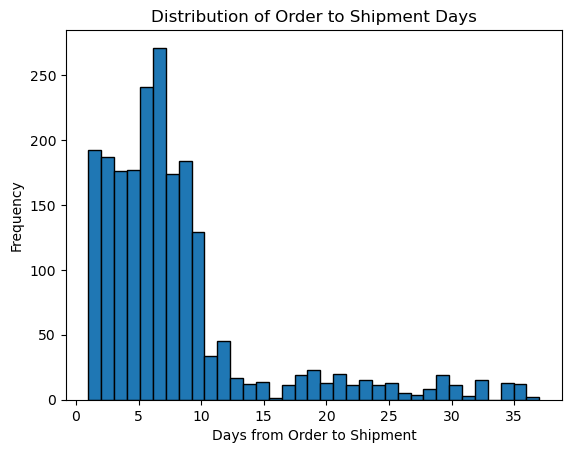

In [148]:
shipping['order_shipped_days'].plot(kind='hist', bins=35, edgecolor='k')
plt.title('Distribution of Order to Shipment Days')
plt.xlabel('Days from Order to Shipment')
plt.ylabel('Frequency')
plt.show()

Looks like it generally takes less than a week for an order to be shipped.

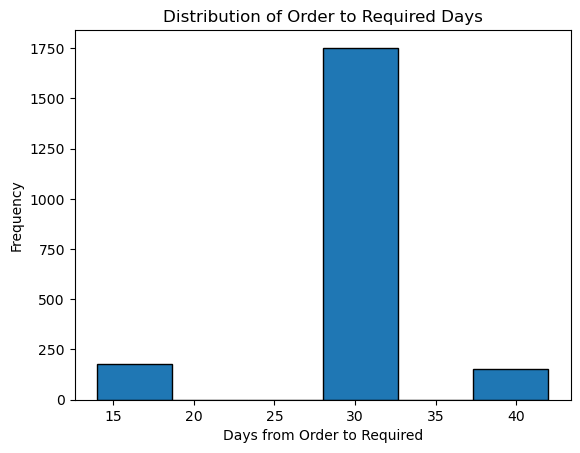

In [149]:
shipping['order_required_days'].plot(kind='hist', bins=6, edgecolor='k')
plt.title('Distribution of Order to Required Days')
plt.xlabel('Days from Order to Required')
plt.ylabel('Frequency')
plt.show()

In [150]:
shipping['order_required_days'].value_counts()

order_required_days
28    1752
14     179
42     151
Name: count, dtype: int64

Interesting, it looks like there are only 3 distinct durations between order placement and the required dates across all the orders. Majority of the orders have a 28-day gap. This is quite unusual to me. Let's double check that our columns are correct by viewing them again.

In [151]:
shipping.head(5)

,orderID,customerID,employeeID,orderDate_o,requiredDate_o,shippedDate_o,companyName_ship,freight_o,order_shipped_days,order_required_days,required_shipped_days
0,10248,VINET,5,2013-07-04,2013-08-01,2013-07-16,Federal Shipping,32.38,12,28,16
1,10944,BOTTM,6,2015-03-12,2015-03-26,2015-03-13,Federal Shipping,52.92,1,14,13
2,10570,MEREP,3,2014-06-17,2014-07-15,2014-06-19,Federal Shipping,188.99,2,28,26
3,10926,ANATR,4,2015-03-04,2015-04-01,2015-03-11,Federal Shipping,39.92,7,28,21
4,10842,TORTU,1,2015-01-20,2015-02-17,2015-01-29,Federal Shipping,54.42,9,28,19


It appears that our columns are correct and there is no problem with our calculations. I am positive that since the duration of days between order and required are multiples of 7, the company is aligning its delivery schedule with a weekly cycle and only allowing the customer to select from 3 required date options where they are given 2 weeks, 4 weeks, or 6 weeks from their order date.

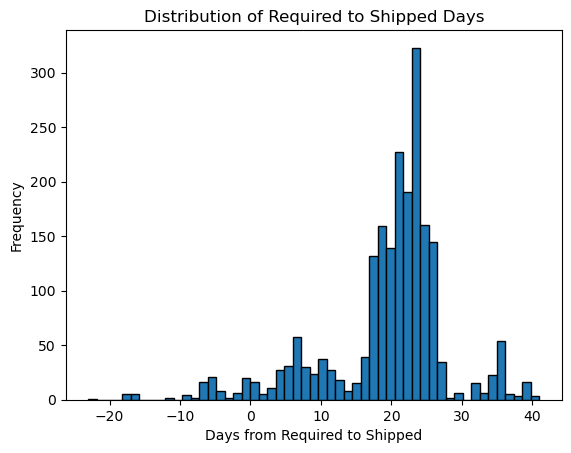

In [152]:
shipping['required_shipped_days'].plot(kind='hist', bins=53, edgecolor='k')
plt.title('Distribution of Required to Shipped Days')
plt.xlabel('Days from Required to Shipped')
plt.ylabel('Frequency')
plt.show()

We can see that most orders have a difference of approximately 20 days between their required and shipped dates which means that a majority of the orders are actually shipped way before their required date. There are several orders that have negative duration meaning that these orders were shipped after the required date which means that the order will be late. Let's take a look at what these orders were.

In [153]:
late_orders = shipping[shipping['required_shipped_days'] < 0]['orderID']

final_df[final_df['orderID'].isin(late_orders)].sort_values(by = 'orderID', ascending = False)

,orderID,customerID,employeeID,orderDate_o,requiredDate_o,shippedDate_o,shipperID,freight_o,productID,unitPrice_od,...,orderDate_o_weekday,requiredDate_o_year,requiredDate_o_month,requiredDate_o_day,requiredDate_o_weekday,shippedDate_o_year,shippedDate_o_month,shippedDate_o_day,shippedDate_o_weekday,DiscountAmount
503,10970,BOLID,9,2015-03-24,2015-04-07,2015-04-24,1,16.16,52,7.00,...,1,2015,4,7,1,2015.0,4.0,24.0,4.0,56.000
778,10960,HILAA,3,2015-03-19,2015-04-02,2015-04-08,1,2.08,24,4.50,...,3,2015,4,2,3,2015.0,4.0,8.0,2.0,11.250
1946,10960,HILAA,3,2015-03-19,2015-04-02,2015-04-08,1,2.08,41,9.65,...,3,2015,4,2,3,2015.0,4.0,8.0,2.0,0.000
1005,10927,LACOR,4,2015-03-05,2015-04-02,2015-04-08,1,19.79,76,18.00,...,3,2015,4,2,3,2015.0,4.0,8.0,2.0,0.000
1461,10927,LACOR,4,2015-03-05,2015-04-02,2015-04-08,1,19.79,20,81.00,...,3,2015,4,2,3,2015.0,4.0,8.0,2.0,0.000
500,10927,LACOR,4,2015-03-05,2015-04-02,2015-04-08,1,19.79,52,7.00,...,3,2015,4,2,3,2015.0,4.0,8.0,2.0,0.000
1030,10924,BERGS,3,2015-03-04,2015-04-01,2015-04-08,2,151.52,75,7.75,...,2,2015,4,1,2,2015.0,4.0,8.0,2.0,0.000
1892,10924,BERGS,3,2015-03-04,2015-04-01,2015-04-08,2,151.52,10,31.00,...,2,2015,4,1,2,2015.0,4.0,8.0,2.0,62.000
1548,10924,BERGS,3,2015-03-04,2015-04-01,2015-04-08,2,151.52,28,45.60,...,2,2015,4,1,2,2015.0,4.0,8.0,2.0,136.800
943,10847,SAVEA,4,2015-01-22,2015-02-05,2015-02-10,3,487.57,1,18.00,...,3,2015,2,5,3,2015.0,2.0,10.0,1.0,288.000


Nothing really stands out to me here, let's try graphing the number of shipped orders per employee against the total number of orders each employee had.

<Axes: xlabel='employeeName_emp'>

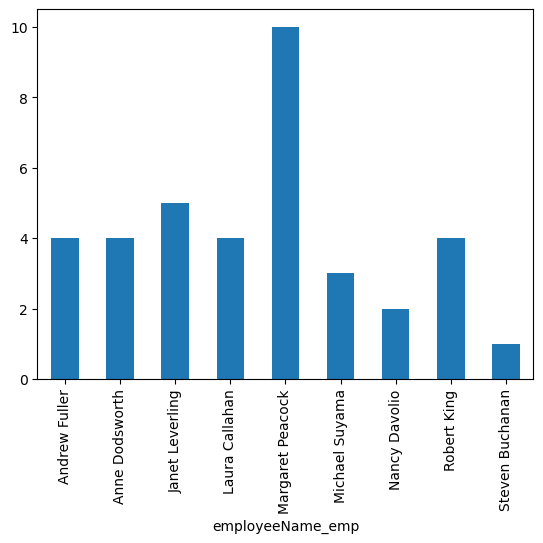

In [154]:
final_df[final_df['orderID'].isin(late_orders)].groupby('employeeName_emp')['orderID'].nunique().plot(kind = 'bar')

<Axes: xlabel='employeeName_emp'>

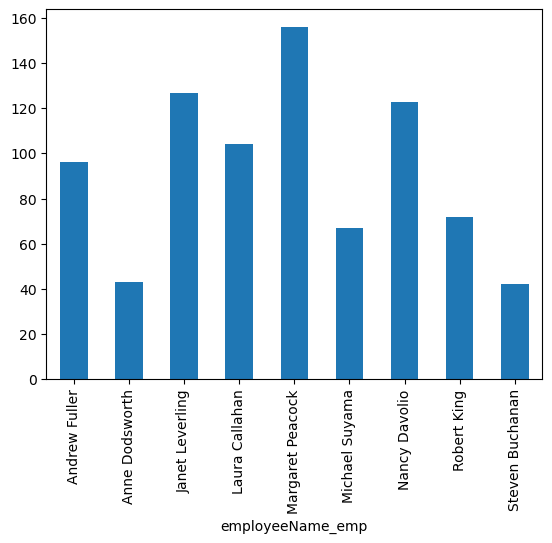

In [155]:
final_df.groupby('employeeName_emp')['orderID'].nunique().plot(kind = 'bar')

Nothing wrong here, Margaret has the most orders so they're bound to have the most late orders.

Overall, there is nothing that stands out too much. Let's take a look at which shipping company is the most reliable by comparing the number of late shipments.

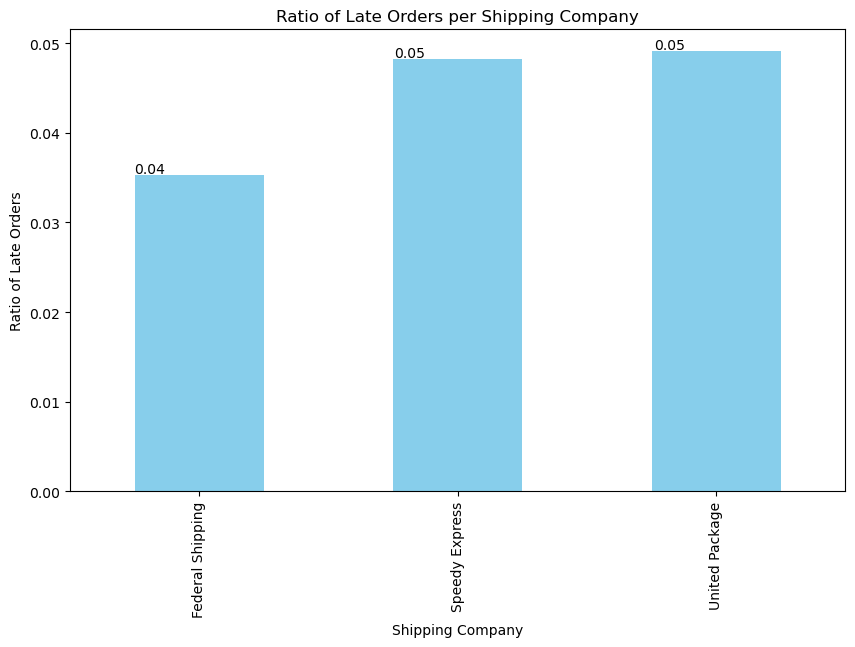

In [156]:
late_orders_ratios = final_df[final_df['orderID'].isin(late_orders)].groupby('companyName_ship')['orderID'].nunique()/final_df.groupby('companyName_ship')['orderID'].nunique()

# Plot the ratios as a bar graph
ax = late_orders_ratios.plot(kind='bar', color='skyblue', figsize=(10, 6))

# Annotate the bars
for p in ax.patches:
    ax.annotate(str(round(p.get_height(), 2)), (p.get_x() * 1.005, p.get_height() * 1.005))

plt.title('Ratio of Late Orders per Shipping Company')
plt.xlabel('Shipping Company')
plt.ylabel('Ratio of Late Orders')
plt.show()


Comparing their ratio of late orders to total orders per shipping company, there is barely any difference. All shipping companies approximately have the same ratio of late orders. In conclusion, all the shipping companies are approximately equally reliable.

## Demand and Inventory Management: 
Identify high-demand products based on sales data and focus on restocking strategies. Use sales and inventory turnover rates for effective inventory management.

Unforuntately, we do not have any data on inventory. Let's take a look at our best-selling products and when they are most sold so that the company can restock the products in preparation for these times.

<Axes: xlabel='productName_prod'>

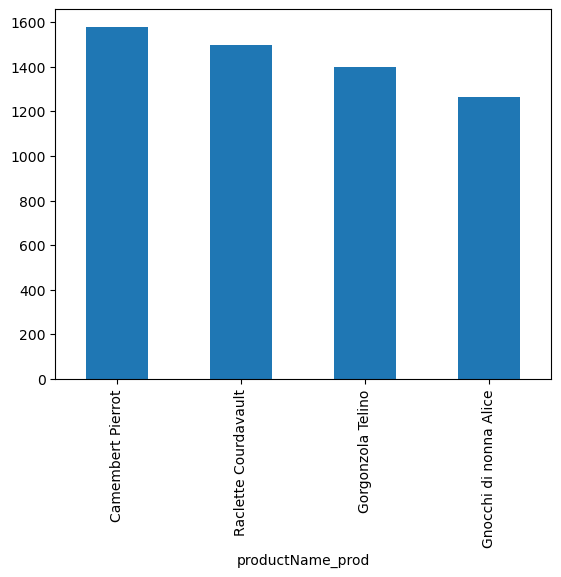

In [157]:
final_df.groupby(by = 'productName_prod')['quantity_od'].sum().sort_values(ascending = False).head(4).plot(kind = 'bar')

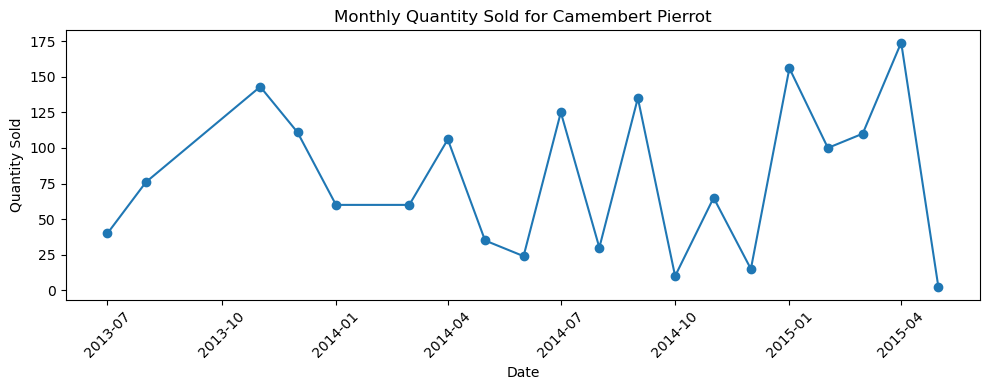

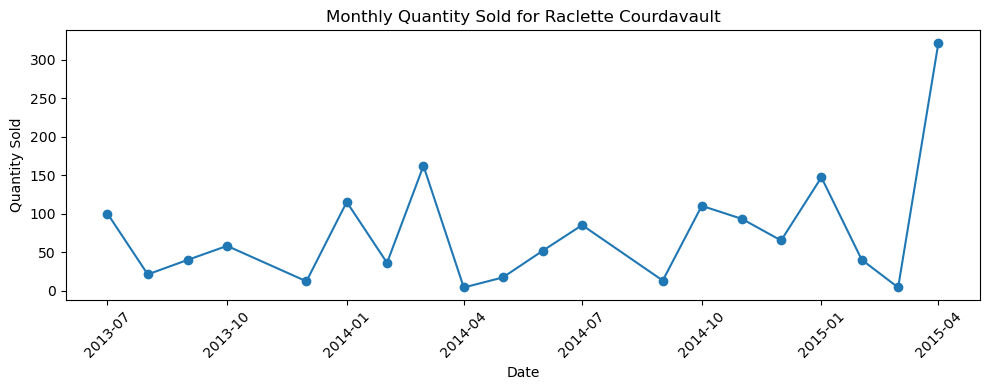

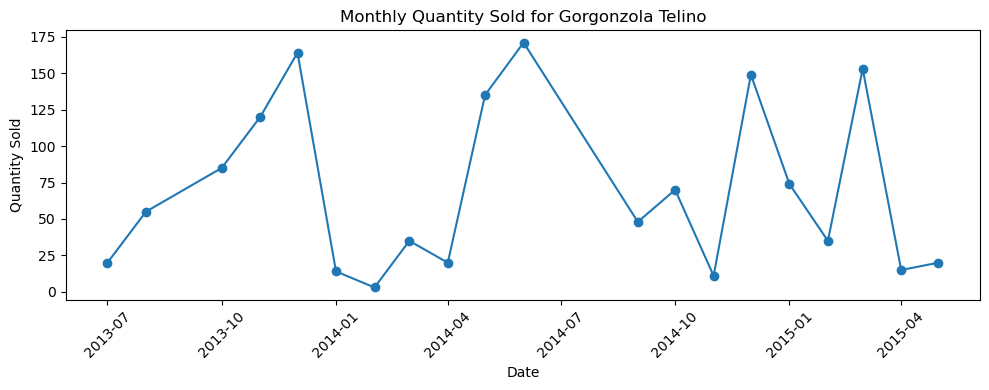

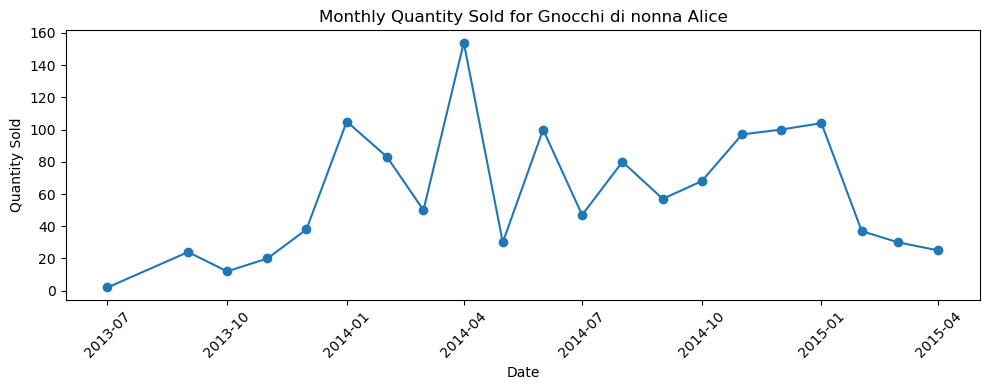

In [158]:
# Identify the top 4 products
top_products = final_df.groupby('productName_prod')['quantity_od'].sum().sort_values(ascending=False).head(4).index.tolist()

# Plot monthly sales for each of the top 4 products
for product in top_products:
    # Filter data for the current product
    product_data = final_df[final_df['productName_prod'] == product]
    
    # Group by year and month, then sum the quantity
    monthly_sales = product_data.groupby(['orderDate_o_year', 'orderDate_o_month'])['quantity_od'].sum().reset_index()
    monthly_sales['Date'] = pd.to_datetime(monthly_sales['orderDate_o_year'].astype(str) + '-' + monthly_sales['orderDate_o_month'].astype(str))
    
    # Plot
    plt.figure(figsize=(10, 4))
    plt.plot(monthly_sales['Date'], monthly_sales['quantity_od'], marker='o', linestyle='-')
    plt.title(f'Monthly Quantity Sold for {product}')
    plt.xlabel('Date')
    plt.ylabel('Quantity Sold')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

Taking a look at these charts, it doesn't seem like there is any clear pattern or seasonality of the quantity sold throughout the years. I would recommend having safety stock levels, reordering points, and being aware of market trends.

## Regional Sales and Product Preferences: 
Explore regional trends in sales and product preferences based on customer and order locations

Let's explore the top 10 countries in which we generate the most sales revenue.

In [159]:
top_count_rev = final_df.groupby('country_cust')['SalesRevenue'].sum().sort_values(ascending = False).head(10)
labels = top_count_rev.index.tolist()
values = top_count_rev.values.tolist()

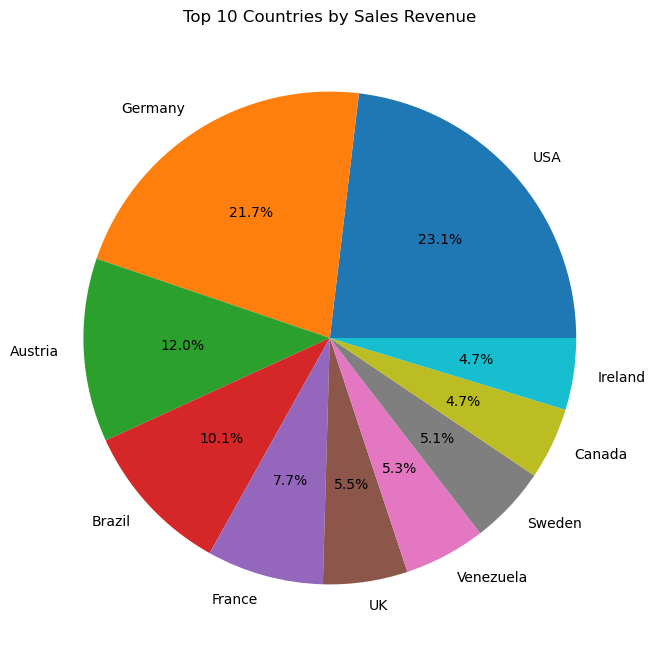

In [160]:
# Create pie chart
plt.figure(figsize=(10, 8))
plt.pie(values, labels=labels, autopct='%1.1f%%')
plt.title('Top 10 Countries by Sales Revenue')
plt.show()

Interesting, it looks like Germany and the US generates the most sales revenue for us. Let's take a look at the top 10 cities.

In [161]:
top_cities_rev = final_df.groupby('city_cust')['SalesRevenue'].sum().sort_values(ascending = False).head(10)
labels = top_cities_rev.index.tolist()
values = top_cities_rev.values.tolist()

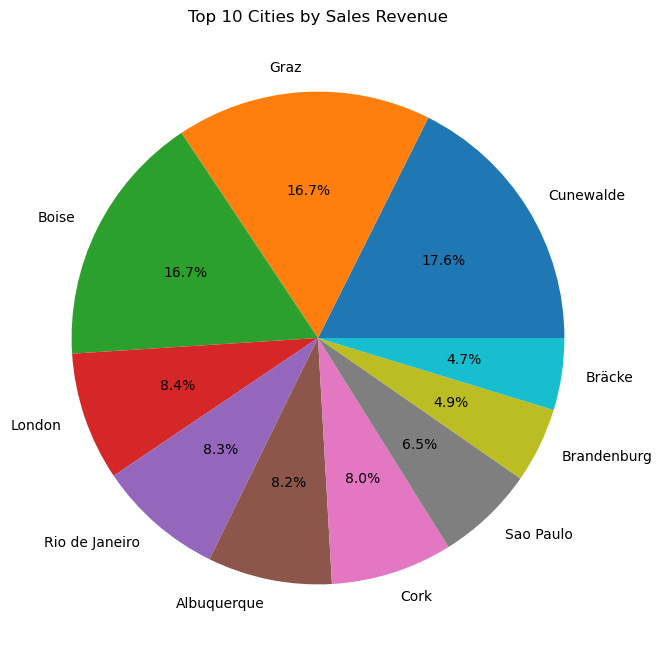

In [162]:
# Create pie chart
plt.figure(figsize=(10, 8))
plt.pie(values, labels=labels, autopct='%1.1f%%')
plt.title('Top 10 Cities by Sales Revenue')
plt.show()

Surprisingly, Graz from Austria is tied with Boise from US for second place in Sales Revenue with Cunewalde from Germany being first.

# Employee Performance

## Sales Performance by Employee: 
Analyze sales data to rank employees by performance. Include total sales revenue and the number of orders handled as metrics

<Axes: xlabel='employeeName_emp'>

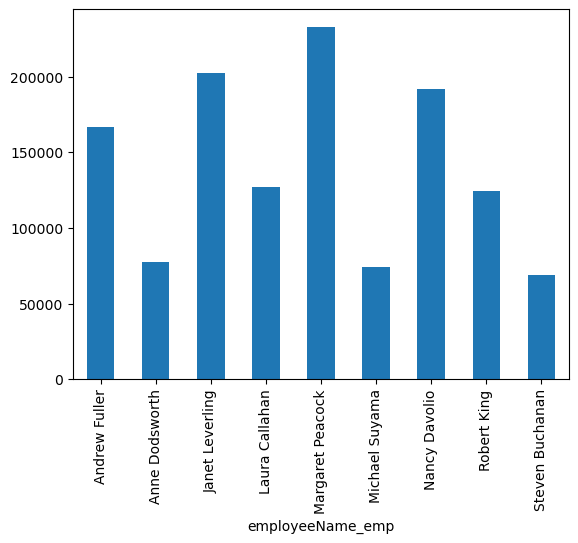

In [163]:
final_df.groupby('employeeName_emp')['SalesRevenue'].sum().plot(kind = 'bar')

<Axes: xlabel='employeeName_emp'>

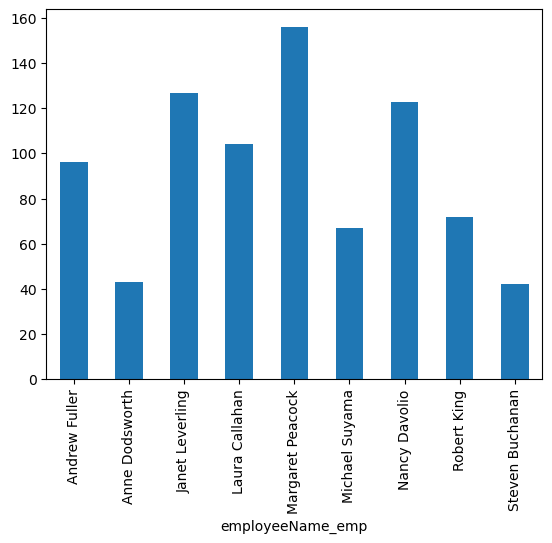

In [164]:
final_df.groupby('employeeName_emp')['orderID'].nunique().plot(kind = 'bar')

As expected, the number of orders handled by employees is proportional to the amount of sales revenue generated. Margaret Peacock has the most orders and revenue generated followed by Janet Leverling and Nancy Davolio. Let's see what their title was.

In [165]:
top_emp = ['Margaret Peacock','Janet Leverling','Nancy Davolio']

top_emp_info = final_df[final_df['employeeName_emp'].isin(top_emp)][['employeeName_emp', 'title_emp','reportsTo_emp']].drop_duplicates()

top_emp_info

,employeeName_emp,title_emp,reportsTo_emp
2,Janet Leverling,Sales Representative,8.0
3,Margaret Peacock,Sales Representative,8.0
4,Nancy Davolio,Sales Representative,8.0


Interesting, they are all Sales Representatives that report to employeeID 8. Let's see who this is.

In [166]:
emp_8 = final_df[final_df['employeeID'] == 8][['employeeName_emp','title_emp','reportsTo_emp']].drop_duplicates()

emp_8

,employeeName_emp,title_emp,reportsTo_emp
7,Laura Callahan,Sales Manager,2.0


In [167]:
emp_2 = final_df[final_df['employeeID'] == 2][['employeeName_emp','title_emp','reportsTo_emp']].drop_duplicates()

emp_2

,employeeName_emp,title_emp,reportsTo_emp
15,Andrew Fuller,Vice President Sales,NaN


Laura is the Manager of all 3 of these employees and reports to the Vice President of Sales. Despite being their manager, she is still 4th in Sales and Orders. Perhaps Laura is a really good manager and employee.

## Impact of Supervision on Sales Performance: 
Examine the 'reportsTo' hierarchy to identify any patterns in sales performance. Consider using statistical tests to assess the impact of supervision on performance.

First, let's take a look at our employees, their titles, and who they report to.

In [168]:
final_df[['employeeID','employeeName_emp','title_emp','reportsTo_emp']].drop_duplicates().sort_values(by = 'reportsTo_emp')

,employeeID,employeeName_emp,title_emp,reportsTo_emp
0,5,Steven Buchanan,Sales Manager,2.0
7,8,Laura Callahan,Sales Manager,2.0
1,6,Michael Suyama,Sales Representative,5.0
9,9,Anne Dodsworth,Sales Representative,5.0
10,7,Robert King,Sales Representative,5.0
2,3,Janet Leverling,Sales Representative,8.0
3,4,Margaret Peacock,Sales Representative,8.0
4,1,Nancy Davolio,Sales Representative,8.0
15,2,Andrew Fuller,Vice President Sales,NaN


We have Andrew Fuller, Vice President Sales, at the top of the hierarchy and under them are 2 Sales Managers, Steven and Laura, who are both managing 3 Sales Representatives. Let's perform a test to figure out if there are any statistically significant differences in sales revenue depending on your manager.

First we will create a df with our relevant columns. Then group by employee and their manager and aggregate SalesRevenue. After that, we will will create a group just for 'reportsTo_emp' as they are supervisors and assign the corresponding group_data for each one. We will run ANOVA and compare the means of the aggregates sales figures per employee across different supervisors.

In [169]:
# Assuming final_df is your DataFrame
relevant_columns = ['employeeID', 'reportsTo_emp', 'SalesRevenue']
df_relevant = final_df[relevant_columns].dropna()

# Group by employeeID and reportsTo_emp to get sum of SalesRevenue for each
sales_by_employee = df_relevant.groupby(['employeeID', 'reportsTo_emp'])['SalesRevenue'].sum().reset_index()

# Create a list for each group
groups = sales_by_employee['reportsTo_emp'].unique()
group_data = [sales_by_employee[sales_by_employee['reportsTo_emp'] == supervisor]['SalesRevenue'] for supervisor in groups]

# Perform ANOVA
anova_result = f_oneway(*group_data)

print("ANOVA F-statistic:", anova_result.statistic)
print("ANOVA P-value:", anova_result.pvalue)

ANOVA F-statistic: 14.837005439048912
ANOVA P-value: 0.00789613942259892


An F-statistic of 14 indicates a significant amount of variance in sales performance between groups of employees reporting to different supervisors. This suggests that the supervisor an employee reports to might be a factor in influencing sales performance as the variance between groups is larger than the variance within groups.

A p-value of 0.00789 means there is a 0.79% chance of observing the detected level of variance between groups by chance and suggests that the difference in sales performance across different supervisors' groups are statistically significant.

This result suggests significant impact of an employee's total sales revenue is due to supervision.